### **LSTM based Stock Price Prediction Project**

This notebook presents the implementation of a Long Short-Term Memory (LSTM) neural network for stock price forecasting. The primary goal is to evaluate the effectiveness of LSTM models in predicting next-day closing prices of publicly traded technology companies and assess their utility within algorithmic trading strategies.



---



**SECTION 1: This is the individual LSTM models for each stock part of the project**

In [57]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [58]:
#import nnecessary librarires
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import FuncFormatter
import seaborn as sns
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import yfinance as yf

In [ ]:
#load each data file into a separate df
amzn = pd.read_csv('/content/drive/MyDrive/Finally/FYP Implementation/AMZN.csv')
aapl = pd.read_csv('/content/drive/MyDrive/Finally/FYP Implementation/Apple Stock Price History.csv')
googl = pd.read_csv('/content/drive/MyDrive/Finally/FYP Implementation/GOOGL_Historical_Data.csv')
meta = pd.read_csv('/content/drive/MyDrive/Finally/FYP Implementation/META_Historical_Data.csv')
msft = pd.read_csv('/content/drive/MyDrive/Finally/FYP Implementation/MSFT_Historical_Data.csv')
ndx = pd.read_csv('/content/drive/MyDrive/Finally/FYP Implementation/NDX (26 years daily).csv')
nvda = pd.read_csv('/content/drive/MyDrive/Finally/FYP Implementation/NVDA_Historical_Data.csv')
orcl = pd.read_csv('/content/drive/MyDrive/Finally/FYP Implementation/ORCL_Historical_Data.csv')

Rename column names to the small letters so that it's easier to handle data later.

In [60]:
amzn.columns = amzn.columns.str.lower().str.replace(' ', '_')
aapl.columns = aapl.columns.str.lower().str.replace(' ', '_')
googl.columns = googl.columns.str.lower().str.replace(' ', '_')
meta.columns = meta.columns.str.lower().str.replace(' ', '_')
msft.columns = msft.columns.str.lower().str.replace(' ', '_')
ndx.columns = ndx.columns.str.lower().str.replace(' ', '_')
nvda.columns = nvda.columns.str.lower().str.replace(' ', '_')
orcl.columns = orcl.columns.str.lower().str.replace(' ', '_')

In [61]:
print("AMZN Columns:", amzn.columns.tolist())
print("AAPL Columns:", aapl.columns.tolist())
print("GOOGL Columns:", googl.columns.tolist())
print("META Columns:", meta.columns.tolist())
print("MSFT Columns:", msft.columns.tolist())
print("NDX Columns:", ndx.columns.tolist())
print("NVDA Columns:", nvda.columns.tolist())
print("ORCL Columns:", orcl.columns.tolist())

AMZN Columns: ['date', 'open', 'high', 'low', 'close', 'volume', 'adj_close']
AAPL Columns: ['date', 'open', 'high', 'low', 'close', 'volume']
GOOGL Columns: ['date', 'open', 'high', 'low', 'close', 'adjclose', 'volume', 'unadjustedvolume', 'change', 'changepercent', 'vwap', 'label', 'changeovertime']
META Columns: ['date', 'open', 'high', 'low', 'close', 'adjclose', 'volume', 'unadjustedvolume', 'change', 'changepercent', 'vwap', 'label', 'changeovertime']
MSFT Columns: ['date', 'open', 'high', 'low', 'close', 'adjclose', 'volume', 'unadjustedvolume', 'change', 'changepercent', 'vwap', 'label', 'changeovertime']
NDX Columns: ['date', 'open', 'high', 'low', 'close', 'adj_close', 'volume']
NVDA Columns: ['date', 'open', 'high', 'low', 'close', 'adjclose', 'volume', 'unadjustedvolume', 'change', 'changepercent', 'vwap', 'label', 'changeovertime']
ORCL Columns: ['date', 'open', 'high', 'low', 'close', 'adjclose', 'volume', 'unadjustedvolume', 'change', 'changepercent', 'vwap', 'label', 'c

Keep only the Required Columns

In [62]:
columns_to_keep = ['date', 'open', 'high', 'low', 'close']

amzn = amzn[columns_to_keep]
aapl = aapl[columns_to_keep]
googl = googl[columns_to_keep]
meta = meta[columns_to_keep]
msft = msft[columns_to_keep]
ndx = ndx[columns_to_keep]
nvda = nvda[columns_to_keep]
orcl = orcl[columns_to_keep]

In [63]:
print("AMZN dtypes:\n", amzn.dtypes, "\n")
print("AAPL dtypes:\n", aapl.dtypes, "\n")
print("GOOGL dtypes:\n", googl.dtypes, "\n")
print("META dtypes:\n", meta.dtypes, "\n")
print("MSFT dtypes:\n", msft.dtypes, "\n")
print("NDX dtypes:\n", ndx.dtypes, "\n")
print("NVDA dtypes:\n", nvda.dtypes, "\n")
print("ORCL dtypes:\n", orcl.dtypes, "\n")

AMZN dtypes:
 date      object
open     float64
high     float64
low      float64
close    float64
dtype: object 

AAPL dtypes:
 date      object
open     float64
high     float64
low      float64
close    float64
dtype: object 

GOOGL dtypes:
 date      object
open     float64
high     float64
low      float64
close    float64
dtype: object 

META dtypes:
 date      object
open     float64
high     float64
low      float64
close    float64
dtype: object 

MSFT dtypes:
 date      object
open     float64
high     float64
low      float64
close    float64
dtype: object 

NDX dtypes:
 date      object
open     float64
high     float64
low      float64
close    float64
dtype: object 

NVDA dtypes:
 date      object
open     float64
high     float64
low      float64
close    float64
dtype: object 

ORCL dtypes:
 date      object
open     float64
high     float64
low      float64
close    float64
dtype: object 



In [64]:
#convert date column to datetime for all
amzn['date'] = pd.to_datetime(amzn['date'])
aapl['date'] = pd.to_datetime(aapl['date'])
googl['date'] = pd.to_datetime(googl['date'])
meta['date'] = pd.to_datetime(meta['date'])
msft['date'] = pd.to_datetime(msft['date'])
ndx['date'] = pd.to_datetime(ndx['date'])
nvda['date'] = pd.to_datetime(nvda['date'])
orcl['date'] = pd.to_datetime(orcl['date'])

<ipython-input-64-68933dfbac81>:3: FutureWarning: In a future version of pandas, parsing datetimes with mixed time zones will raise an error unless `utc=True`. Please specify `utc=True` to opt in to the new behaviour and silence this warning. To create a `Series` with mixed offsets and `object` dtype, please use `apply` and `datetime.datetime.strptime`
  aapl['date'] = pd.to_datetime(aapl['date'])


In [65]:
aapl['date'] = pd.to_datetime(aapl['date'], errors='coerce')
aapl['date'] = aapl['date'].dt.tz_localize(None)  # Only if timezone is present

Check Start and End Date of each data file

In [66]:
print("AMZN:", amzn['date'].min(), "to", amzn['date'].max())
print("AAPL:", aapl['date'].min(), "to", aapl['date'].max())
print("GOOGL:", googl['date'].min(), "to", googl['date'].max())
print("META:", meta['date'].min(), "to", meta['date'].max())
print("MSFT:", msft['date'].min(), "to", msft['date'].max())
print("NDX:", ndx['date'].min(), "to", ndx['date'].max())
print("NVDA:", nvda['date'].min(), "to", nvda['date'].max())
print("ORCL:", orcl['date'].min(), "to", orcl['date'].max())

AMZN: 2000-02-01 00:00:00 to 2012-09-12 00:00:00
AAPL: 1980-12-12 00:00:00 to 2025-02-04 00:00:00
GOOGL: 2020-03-10 00:00:00 to 2025-03-07 00:00:00
META: 2020-03-10 00:00:00 to 2025-03-07 00:00:00
MSFT: 2020-03-10 00:00:00 to 2025-03-07 00:00:00
NDX: 1997-07-01 00:00:00 to 2023-10-31 00:00:00
NVDA: 2020-03-10 00:00:00 to 2025-03-07 00:00:00
ORCL: 2020-03-10 00:00:00 to 2025-03-07 00:00:00


- Amazon's data here covers a relatively limited period (from 2000 to 2012). It's important to note that this period includes some significant years for Amazon, but doesn't encompass the full growth trajectory after 2012. The data is useful for modeling in the early years of Amazon's growth but doesn't reflect its more recent explosive growth from 2012 to the present.
- Apple has an extensive dataset going all the way back to 1980.
- Google's stock data here is available only from 2020, which means it doesn't cover the pre-2020 period.
- Meta's dataset also starts from 2020.
- Microsoft’s data covers the same timeframe as Google and Meta (from 2020 to the present). While Microsoft has been a major player in the tech industry for decades, the dataset only includes the more recent stock price movements.
- The NDX data starts in 1997 and goes up to 2023.
- Similar to Google, Meta, and Microsoft, NVIDIA's stock data is only available from 2020.
-  Oracle's dataset is also available from 2020, similar to the others in this batch. Oracle's data spans the same 5-year period.


When stocks have different start and end dates, then it must ensure all stocks are aligned to the same dates. So, Modelling all of the stocks at once wouldnnt be an option.



**Visualise the Data**

In [67]:
stocks = {
    'AMZN': amzn,
    'AAPL': aapl,
    'GOOGL': googl,
    'META': meta,
    'MSFT': msft,
    'NDX': ndx,
    'NVDA': nvda,
    'ORCL': orcl
}

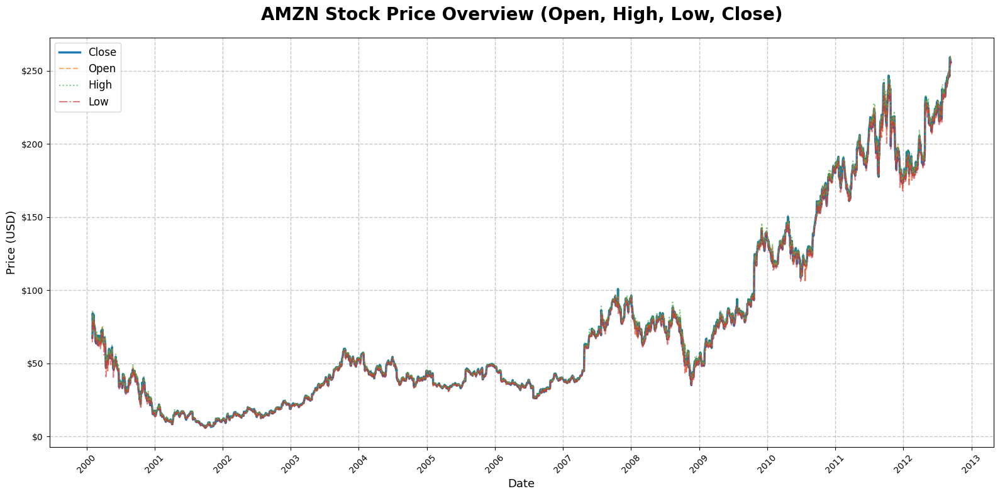

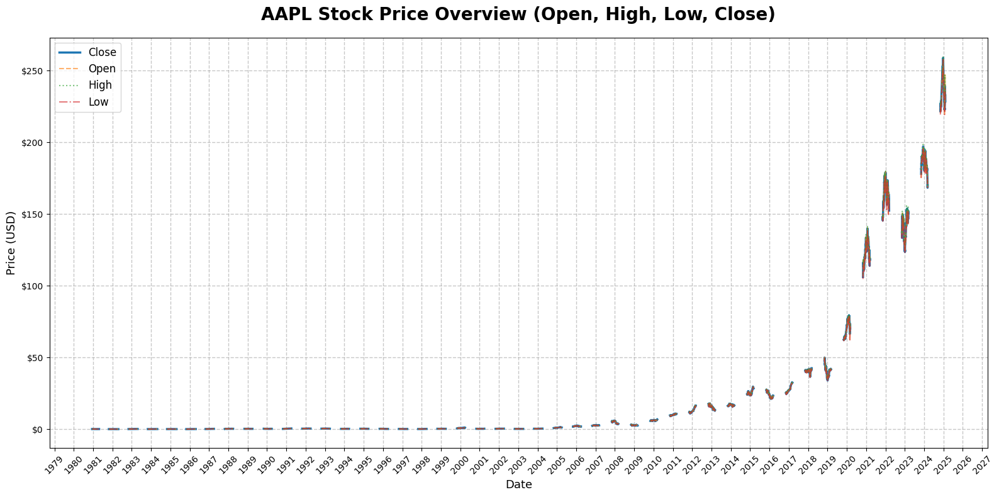

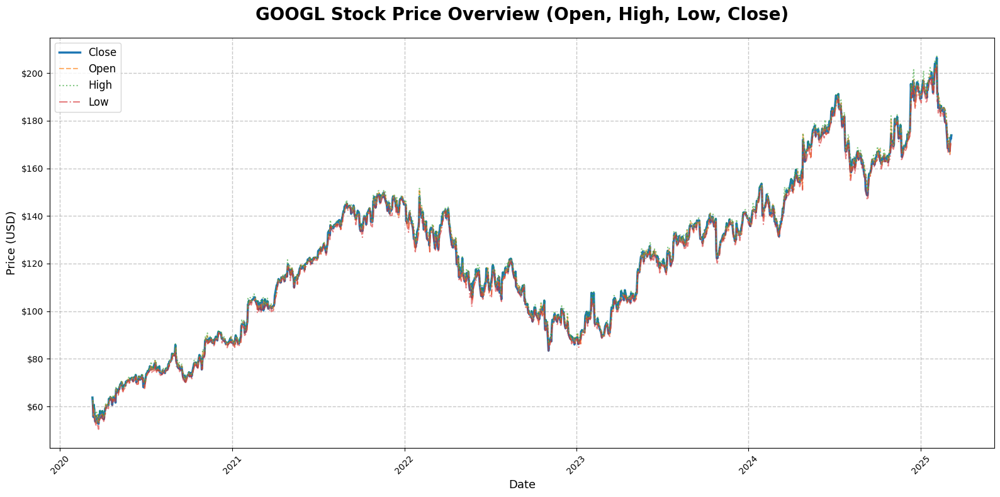

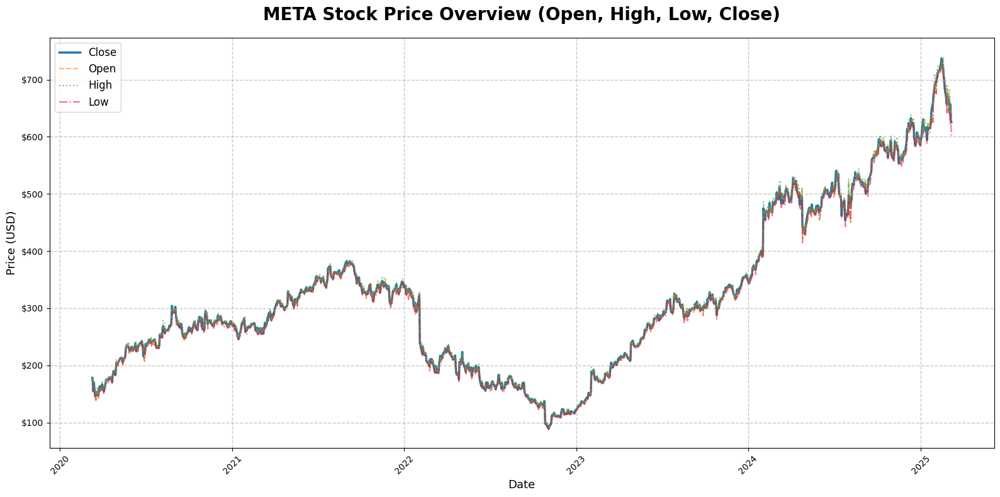

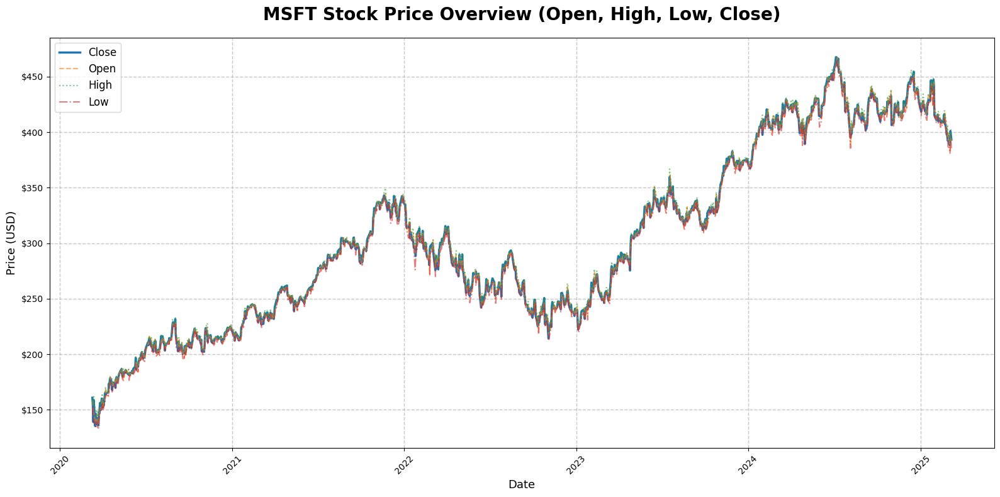

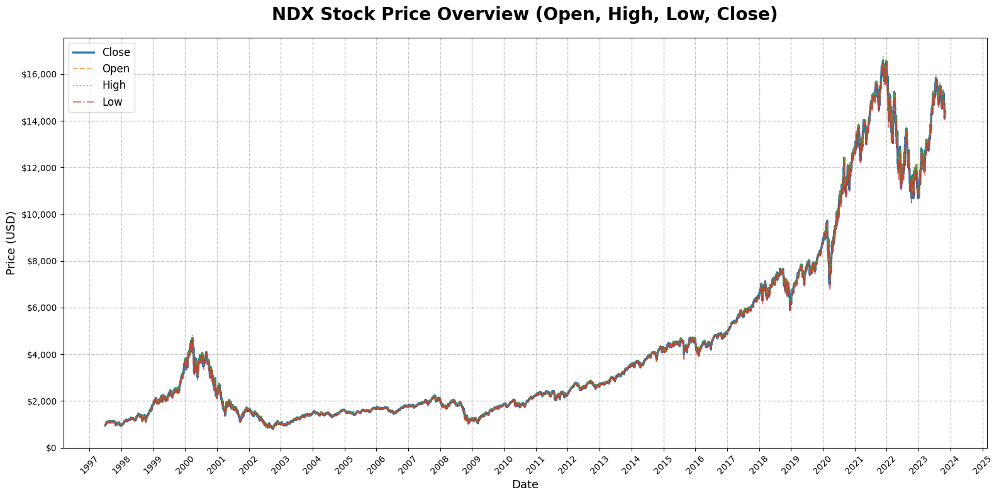

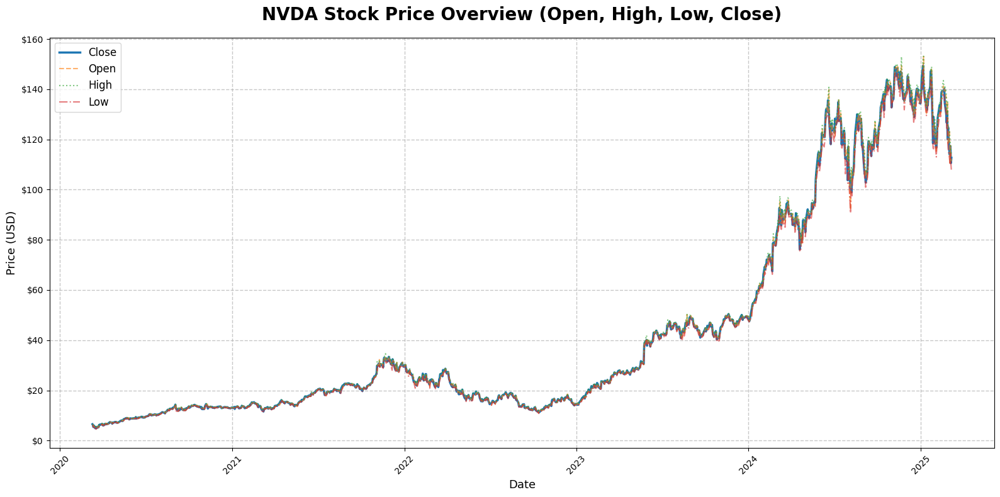

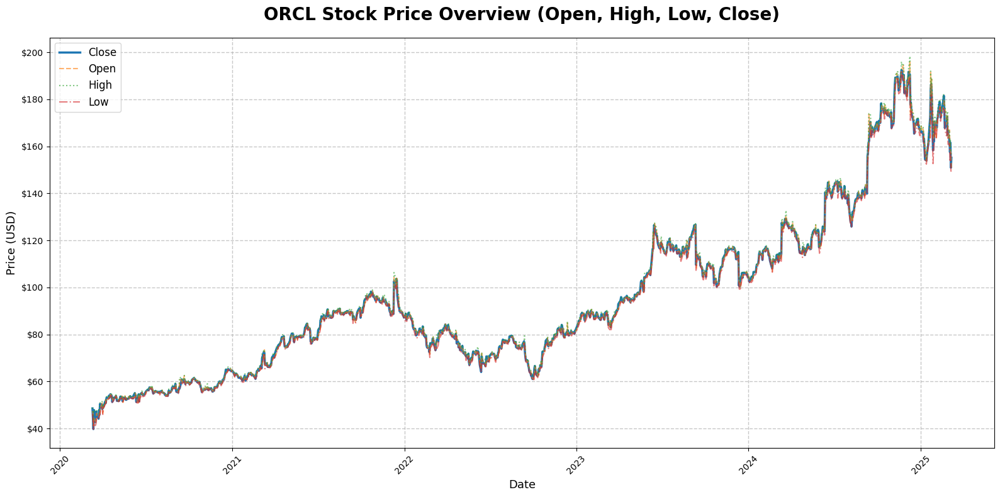

In [68]:
usd_formatter = FuncFormatter(lambda x, _: f'${x:,.0f}')
for name, df in stocks.items():
    plt.figure(figsize=(16, 8))
    plt.plot(df['date'], df['close'], label='Close', linewidth=2.5)
    plt.plot(df['date'], df['open'], label='Open', linestyle='--', alpha=0.6)
    plt.plot(df['date'], df['high'], label='High', linestyle=':', alpha=0.6)
    plt.plot(df['date'], df['low'], label='Low', linestyle='-.', alpha=0.6)

    # Title and axis labels
    plt.title(f'{name} Stock Price Overview (Open, High, Low, Close)', fontsize=20, weight='bold', pad=20)
    plt.xlabel('Date', fontsize=13)
    plt.ylabel('Price (USD)', fontsize=13)

    # Formatting
    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    plt.gca().yaxis.set_major_formatter(usd_formatter)
    plt.xticks(rotation=45)
    plt.legend(loc='upper left', fontsize=12)
    plt.grid(True, which='both', linestyle='--', linewidth=1, alpha=0.7)
    plt.tight_layout()

    # Show each plot one by one
    plt.show()

Each stock has differennt time Availability

### **Why use the close price for LSTM modeling?**

The close price represents the final price at which the stock traded during a given time frame (daily, hourly, etc.). It's widely considered the most important and conclusive price point because:

- It reflects the market consensus at the end of the day.
- It incorporates all intraday action — opening volatility, mid-day corrections, and end-of-day sentiment.
- Most technical indicators (like Moving Averages, RSI, MACD) are based on closing prices.
- Charts, signals, and strategies are typically built using closes.
- If comparing with real-world performance or signals, that is standard practice.
- LSTMs require sequential data — and a single target variable (like next day's close). Including all four OHLC values complicates dimensionality without always adding clear benefit, unless you're modeling volatility or using multivariate inputs.
- Intraday prices (open, high, low) can include a lot of noise — temporary spikes, news reactions, etc.
- Close prices tend to be smoother and more stable, which is better for deep learning models that struggle with noisy inputs.



#### **Strategy:**
Start with close → validate results → optionally expand to open, high, low, volume → compare performance.



prepare data for LSTM

In [69]:
def create_sequences(data, time_step=60):
    X, y = [], []
    for i in range(len(data) - time_step):
        X.append(data[i:i + time_step])
        y.append(data[i + time_step])
    return np.array(X), np.array(y)


Processing AMZN


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step
AMZN - MSE: 10.2599, RMSE: 3.2031


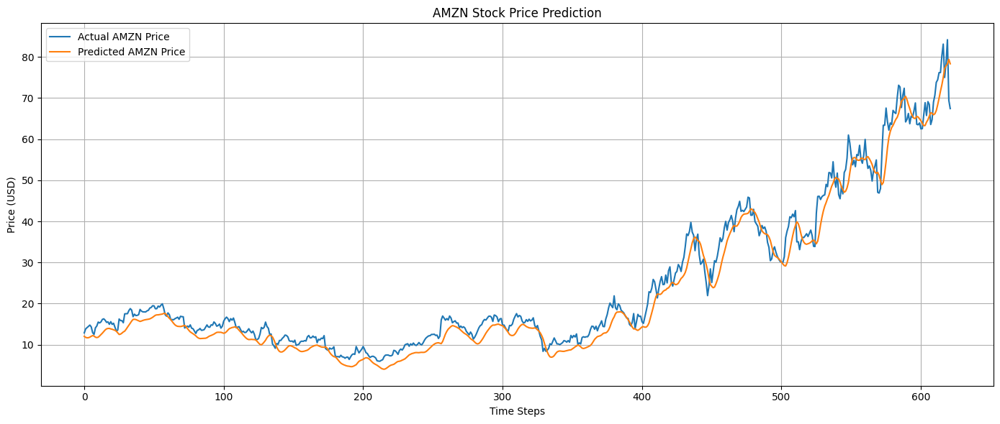


Processing AAPL


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step
AAPL - MSE: 376.3719, RMSE: 19.4003


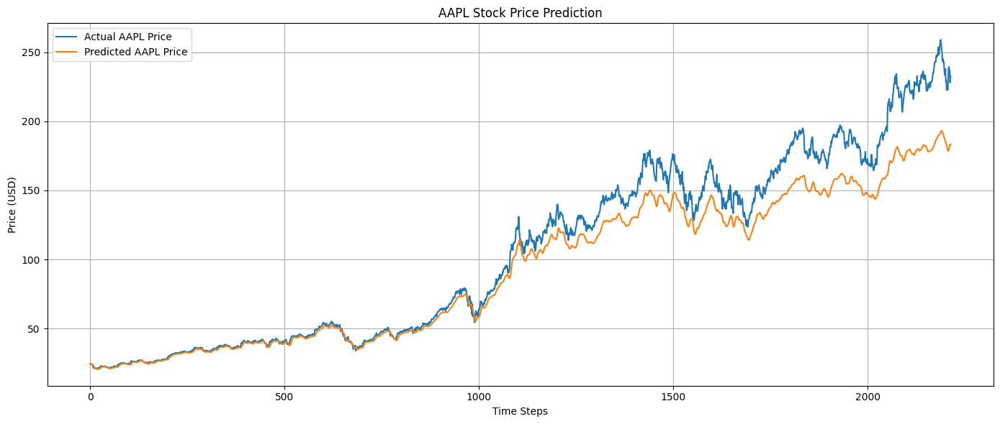


Processing GOOGL


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step
GOOGL - MSE: 107.0470, RMSE: 10.3464


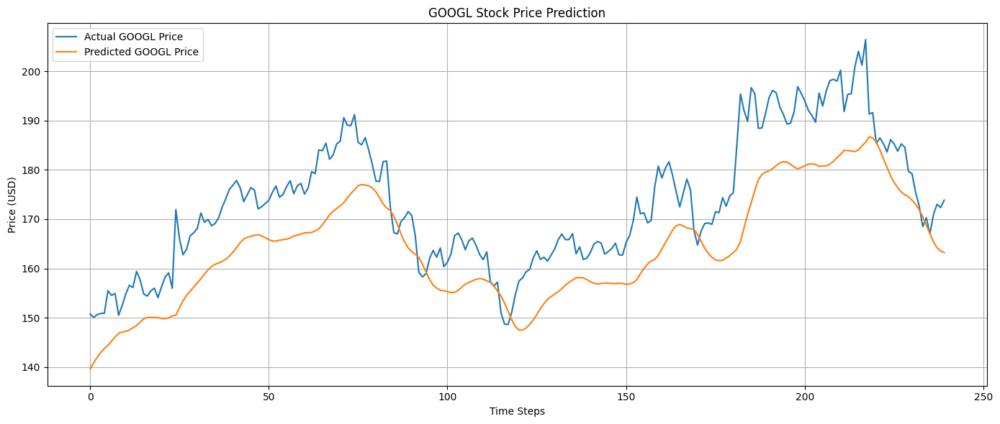


Processing META


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step
META - MSE: 635.4704, RMSE: 25.2085


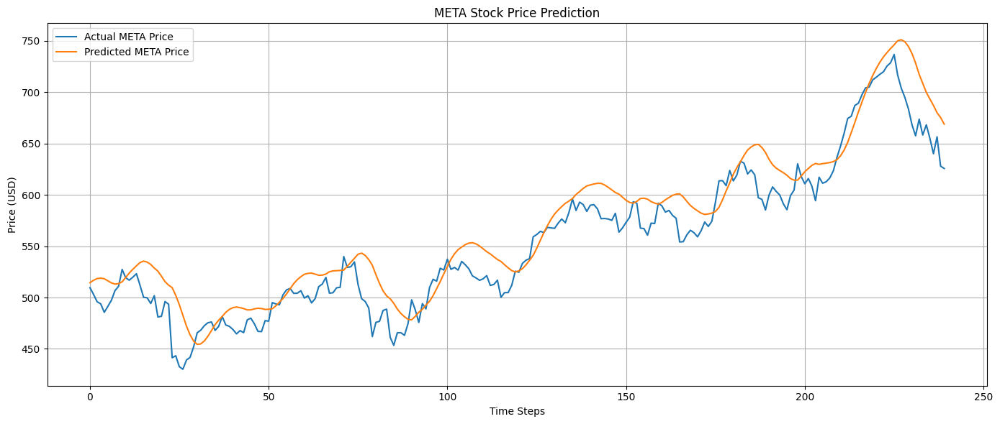


Processing MSFT


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step
MSFT - MSE: 294.9835, RMSE: 17.1751


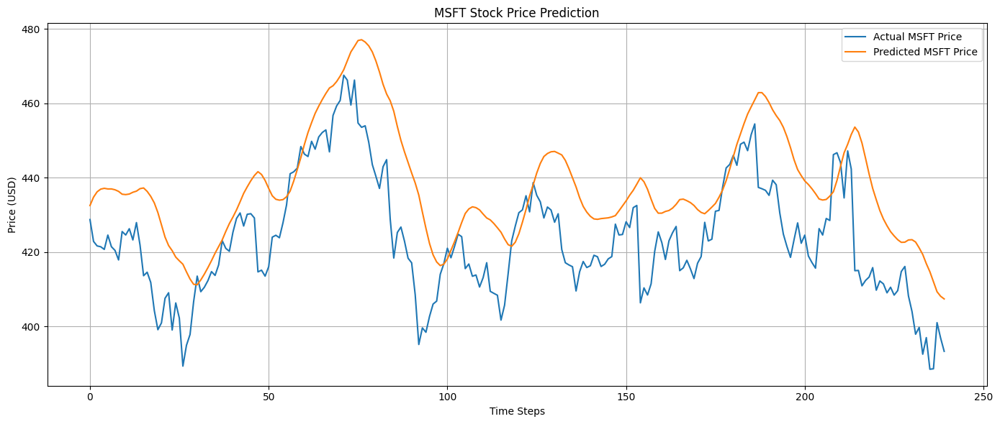


Processing NDX


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step
NDX - MSE: 211808.7059, RMSE: 460.2268


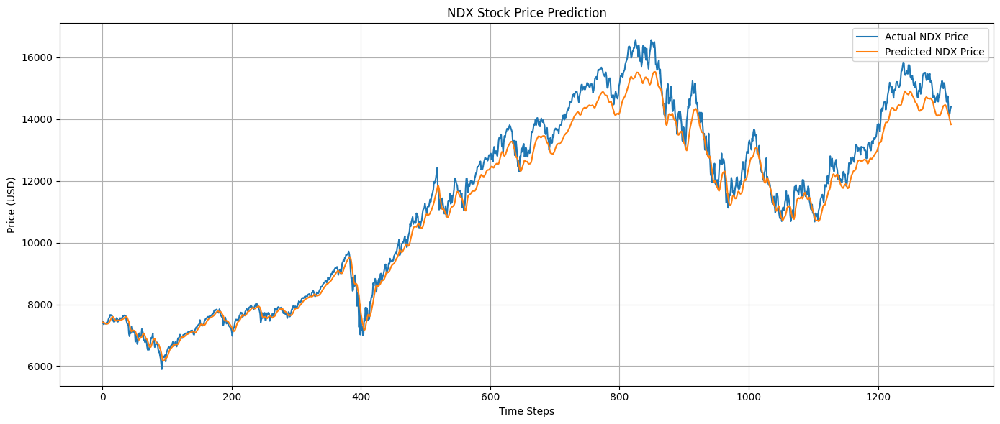


Processing NVDA


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step
NVDA - MSE: 47.4733, RMSE: 6.8901


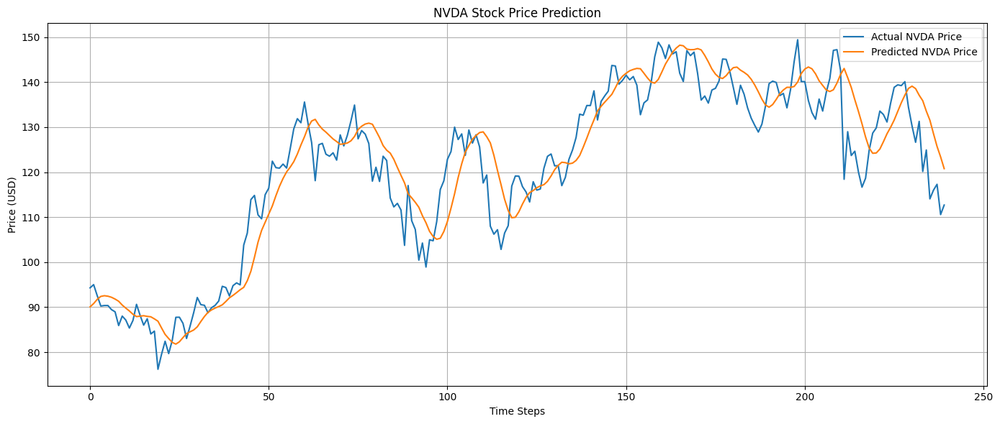


Processing ORCL


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step
ORCL - MSE: 48.8696, RMSE: 6.9907


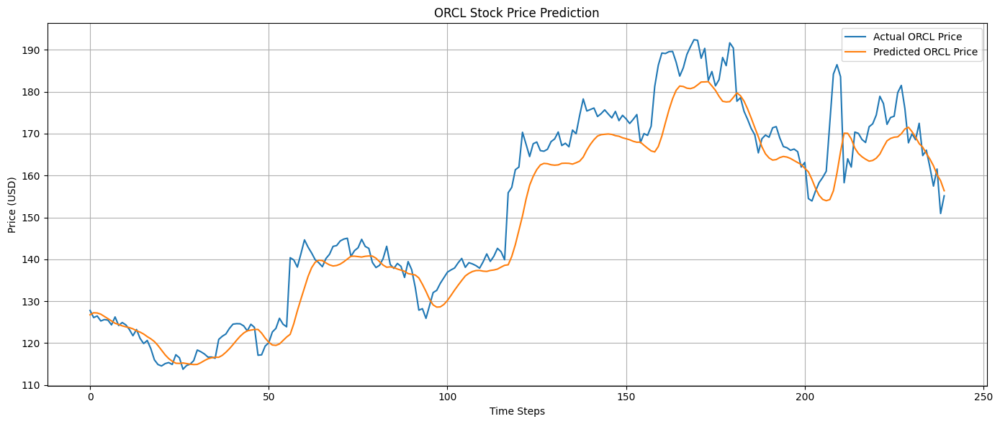

In [ ]:
for stock, df in stocks.items():
    print("\n" + "="*40)
    print(f"Processing {stock}")
    print("="*40)

    df.set_index('date', inplace=True)

    #normalize
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(df[['close']])

    #create sequences
    X, y = create_sequences(scaled_data, time_step=60)

    #train-test split
    train_size = int(len(X) * 0.80)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    #reshape for LSTM
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
    X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

    #build model
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(units=50))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    #train
    model.fit(X_train, y_train, epochs=20, batch_size=16, validation_data=(X_test, y_test), verbose=0)

    #predict
    predictions = model.predict(X_test)

    #inverse scale
    predictions_rescaled = scaler.inverse_transform(predictions)
    y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

    #metrics
    mse = mean_squared_error(y_test_rescaled, predictions_rescaled)
    rmse = np.sqrt(mse)
    print(f"{stock} - MSE: {mse:.4f}, RMSE: {rmse:.4f}")

    # plot
    plt.figure(figsize=(14, 6))
    plt.plot(y_test_rescaled, label=f"Actual {stock} Price")
    plt.plot(predictions_rescaled, label=f"Predicted {stock} Price")
    plt.title(f'{stock} Stock Price Prediction')
    plt.xlabel('Time Steps')
    plt.ylabel('Price (USD)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

## **Combined All Stocks Prediction - Single Model - Given Data**

**SECTION 2: This is where we develop a single LSTM model to predict on the stocks that are possible to make predictions for. Many stocks one SINGLE lstm model**


In [70]:
stocks = {
    'AMZN': amzn,
    'AAPL': aapl,
    'GOOGL': googl,
    'META': meta,
    'MSFT': msft,
    'NDX': ndx,
    'NVDA': nvda,
    'ORCL': orcl
}
#...

In [71]:
for ticker, df in stocks.items():
    print(f"{ticker} columns: {df.columns.tolist()}")


AMZN columns: ['date', 'open', 'high', 'low', 'close']
AAPL columns: ['date', 'open', 'high', 'low', 'close']
GOOGL columns: ['date', 'open', 'high', 'low', 'close']
META columns: ['date', 'open', 'high', 'low', 'close']
MSFT columns: ['date', 'open', 'high', 'low', 'close']
NDX columns: ['date', 'open', 'high', 'low', 'close']
NVDA columns: ['date', 'open', 'high', 'low', 'close']
ORCL columns: ['date', 'open', 'high', 'low', 'close']


In [72]:
close_prices = pd.DataFrame()

for ticker, df in stocks.items():
    df.columns = df.columns.str.lower().str.replace(' ', '_')
    df = df[['date', 'close']].dropna()
    df = df[df['date'] >= '2020-03-10']  # manual cutoff for maximum overlap
    df.set_index('date', inplace=True)
    close_prices[ticker] = df['close']

In [73]:
close_prices

,AMZN,AAPL,GOOGL,META,MSFT,NDX,NVDA,ORCL
date,,,,,,,,
2020-11-02,NaN,106.178116,81.22,261.36,202.33,11084.759766,12.58,56.45
2020-11-03,NaN,107.808319,82.28,265.30,206.43,11279.910156,13.02,56.80
2020-11-04,NaN,112.210831,87.29,287.38,216.39,11777.019531,13.79,56.49
2020-11-05,NaN,116.193619,88.13,294.68,223.29,12078.070313,14.16,56.66
2020-11-06,NaN,116.061607,87.99,293.41,223.72,12091.349609,14.56,56.80
...,...,...,...,...,...,...,...,...
2025-01-29,NaN,239.360001,195.41,676.49,442.33,NaN,123.70,162.02
2025-01-30,NaN,237.589996,200.87,687.00,414.99,NaN,124.65,170.38
2025-01-31,NaN,236.000000,204.02,689.18,415.06,NaN,120.07,170.06


In [74]:
close_prices.drop(columns=['NDX','AMZN',], inplace=True) #drop as they do not have max range data.

In [42]:
stocks = {
    'AAPL': aapl,
    'GOOGL': googl,
    'META': meta,
    'MSFT': msft,
    'NVDA': nvda,
    'ORCL': orcl
}

In [75]:
close_prices.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 408 entries, 2020-11-02 to 2025-02-04
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL    408 non-null    float64
 1   GOOGL   408 non-null    float64
 2   META    408 non-null    float64
 3   MSFT    408 non-null    float64
 4   NVDA    408 non-null    float64
 5   ORCL    408 non-null    float64
dtypes: float64(6)
memory usage: 22.3 KB


In [76]:
##Data Preprocessing
#normalize the stock prices to be between 0 and 1
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(close_prices)

In [77]:
#create sequences of data for LSTM
def create_sequences(data, time_step=14):
    X, y = [], []
    for i in range(len(data) - time_step):
        X.append(data[i:i + time_step])
        y.append(data[i + time_step])
    return np.array(X), np.array(y)

time_step = 14  #number of previous days to use for prediction
X, y = create_sequences(scaled_data, time_step)

In [78]:
#split data into training and testing sets
train_size = int(len(X) * 0.9)  # 90% for training, 10% for testing
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

In [79]:
#build the LSTM Model
model = Sequential()

#add LSTM layers
model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))  #dropout layer to prevent overfitting
model.add(LSTM(units=50, return_sequences=False))
model.add(Dropout(0.2))

#output layer for predicting 8 stock prices at once
model.add(Dense(6))  # 6 output units (one for each stock)

#compile the model
model.compile(optimizer='adam', loss='mean_squared_error')
#train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step - loss: 0.1136 - val_loss: 0.0795
Epoch 2/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0250 - val_loss: 0.0522
Epoch 3/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0210 - val_loss: 0.0212
Epoch 4/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0152 - val_loss: 0.0100
Epoch 5/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0116 - val_loss: 0.0209
Epoch 6/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0112 - val_loss: 0.0138
Epoch 7/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0108 - val_loss: 0.0113
Epoch 8/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0110 - val_loss: 0.0079
Epoch 9/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0094 - val_loss: 0.0183
Epoch 10/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0097 - val_loss: 0.0132
Epoch 11/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0090 - val_loss: 0.0108
Epoch 12/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0086 - val_

In [80]:
#predictions
predictions = model.predict(X_test)

#inverse transform the predictions and actual values to get the original scale
predictions_rescaled = scaler.inverse_transform(predictions)
y_test_rescaled = scaler.inverse_transform(y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 367ms/step


In [81]:
#calculate MSE and RMSE
mse = mean_squared_error(y_test_rescaled, predictions_rescaled)
rmse = np.sqrt(mse)

#print the metrics
print(f'Overall Mean Squared Error (MSE): {mse}')
print(f'Overall Root Mean Squared Error (RMSE): {rmse}')

Overall Mean Squared Error (MSE): 284.9438274541687
Overall Root Mean Squared Error (RMSE): 16.880279246925056


In [82]:
#calculate mse and rmmse for each stock
for i, stock in enumerate(stocks):
    stock_mse = mean_squared_error(y_test_rescaled[:, i], predictions_rescaled[:, i])
    stock_rmse = np.sqrt(stock_mse)
    print(f'{stock} - MSE: {stock_mse}, RMSE: {stock_rmse}')

AMZN - MSE: 177.0343128137407, RMSE: 13.3054241876665
AAPL - MSE: 307.34057724424684, RMSE: 17.53113165897304
GOOGL - MSE: 928.0645367324089, RMSE: 30.46415166605512
META - MSE: 111.1721054429585, RMSE: 10.543818352141622
MSFT - MSE: 126.85556012310683, RMSE: 11.263017363171684
NDX - MSE: 59.195872368550205, RMSE: 7.693885388316504


IndexError: index 6 is out of bounds for axis 1 with size 6

## **Combined All Stocks Prediction - Single Model**

Download Data from Api and Do modelling for larger date time.

**SECTION 3:** Here This is where the models that I base my dissertation report off lays.


In [ ]:
#import nnecessary librarires
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import FuncFormatter
import seaborn as sns
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import yfinance as yf

In [ ]:
# download stock data for multiple stocks (2015 to 2023 for training, 2023 to 2025 for testing
stocks = ['AAPL', 'GOOG', 'AMZN', 'MSFT', 'META', 'NVDA', 'ORCL']  #list of stock symbols
start_date = '2015-01-01'
end_date = '2025-01-01'

# download data
stock_data = yf.download(stocks, start=start_date, end=end_date)['Close']  #wwe only need the 'Close' prices
print(stock_data.head())

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  7 of 7 completed


Ticker           AAPL     AMZN       GOOG       META       MSFT      NVDA  \
Date                                                                        
2015-01-02  24.320429  15.4260  26.045290  78.082001  40.072132  0.483099   
2015-01-05  23.635288  15.1095  25.502359  76.827911  39.703636  0.474939   
2015-01-06  23.637510  14.7645  24.911291  75.792793  39.120888  0.460540   
2015-01-07  23.968962  14.9210  24.868610  75.792793  39.617939  0.459340   
2015-01-08  24.889908  15.0230  24.947023  77.813263  40.783417  0.476619   

Ticker           ORCL  
Date                   
2015-01-02  37.863846  
2015-01-05  37.332840  
2015-01-06  36.947437  
2015-01-07  36.955997  
2015-01-08  37.178680  


In [ ]:
stock_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2516 entries, 2015-01-02 to 2024-12-31
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL    2516 non-null   float64
 1   AMZN    2516 non-null   float64
 2   GOOG    2516 non-null   float64
 3   META    2516 non-null   float64
 4   MSFT    2516 non-null   float64
 5   NVDA    2516 non-null   float64
 6   ORCL    2516 non-null   float64
dtypes: float64(7)
memory usage: 157.2 KB


NDX stock is not available for all last years starting from 2015 to recent. We can exclude it here for now.

In [ ]:
##Data Preprocessing
#normalize the stock prices to be between 0 and 1
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(stock_data)

In [ ]:
#create sequences of data for LSTM
def create_sequences(data, time_step=60):
    X, y = [], []
    for i in range(len(data) - time_step):
        X.append(data[i:i + time_step])
        y.append(data[i + time_step])
    return np.array(X), np.array(y)

time_step = 60  #number of previous days to use for prediction
X, y = create_sequences(scaled_data, time_step)

In [ ]:
#split data into training and testing sets (last 2 years for testing)
train_size = int(len(X) * 0.8)  # 80% for training, 20% for testing
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

In [ ]:
#build the LSTM Model
model = Sequential()

#add LSTM layers
model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))  #dropout layer to prevent overfitting
model.add(LSTM(units=50, return_sequences=False))
model.add(Dropout(0.2))

#output layer for predicting 8 stock prices at once
model.add(Dense(7))  # 8 output units (one for each stock)

#compile the model
model.compile(optimizer='adam', loss='mean_squared_error')
#train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.0248 - val_loss: 0.0458
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 0.0038 - val_loss: 0.0414
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.0028 - val_loss: 0.0412
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - loss: 0.0023 - val_loss: 0.0329
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.0022 - val_loss: 0.0335
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.0019 - val_loss: 0.0309
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.0016 - val_loss: 0.0276
Epoch 8/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.0016 - val_loss: 0.0308
Epoch 9/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.0015 - val_loss: 0.0275
Epoch 10/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - loss: 0.0013 - val_loss: 0.0247
Epoch 11/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.0014 - val_loss: 0.0254
Epoch 12/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.0011 - val_l

In [ ]:
#predictions
predictions = model.predict(X_test)

#inverse transform the predictions and actual values to get the original scale
predictions_rescaled = scaler.inverse_transform(predictions)
y_test_rescaled = scaler.inverse_transform(y_test)

16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step


In [ ]:
#calculate MSE and RMSE
mse = mean_squared_error(y_test_rescaled, predictions_rescaled)
rmse = np.sqrt(mse)

#print the metrics
print(f'Overall Mean Squared Error (MSE): {mse}')
print(f'Overall Root Mean Squared Error (RMSE): {rmse}')

Overall Mean Squared Error (MSE): 568.5846848357298
Overall Root Mean Squared Error (RMSE): 23.845013835930768


In [ ]:
#calculate mse and rmmse for each stock
for i, stock in enumerate(stocks):
    stock_mse = mean_squared_error(y_test_rescaled[:, i], predictions_rescaled[:, i])
    stock_rmse = np.sqrt(stock_mse)
    print(f'{stock} - MSE: {stock_mse}, RMSE: {stock_rmse}')

AAPL - MSE: 209.1769078039972, RMSE: 14.462949484942454
GOOG - MSE: 29.885787418653177, RMSE: 5.466789498293599
AMZN - MSE: 107.9567548397481, RMSE: 10.39022400334796
MSFT - MSE: 1520.8017587580857, RMSE: 38.997458362797
META - MSE: 315.00739816015886, RMSE: 17.748447767626296
NVDA - MSE: 1463.8735005089256, RMSE: 38.26059984512691
ORCL - MSE: 333.39068636054344, RMSE: 18.258989193286233


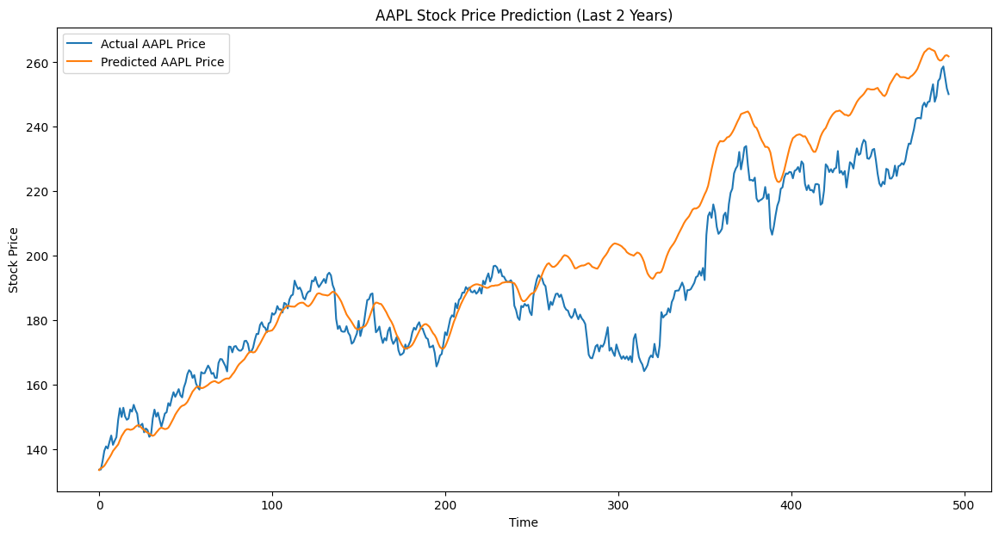

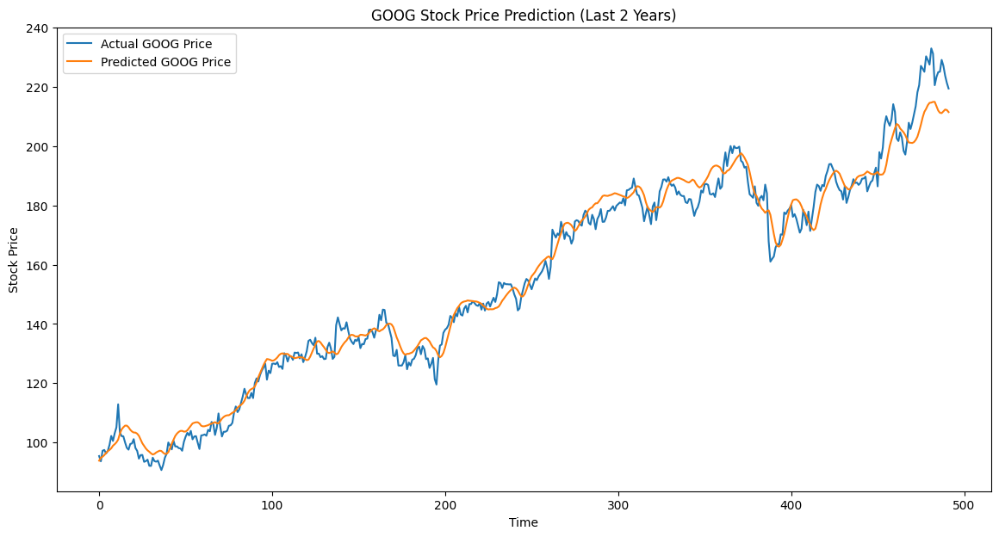

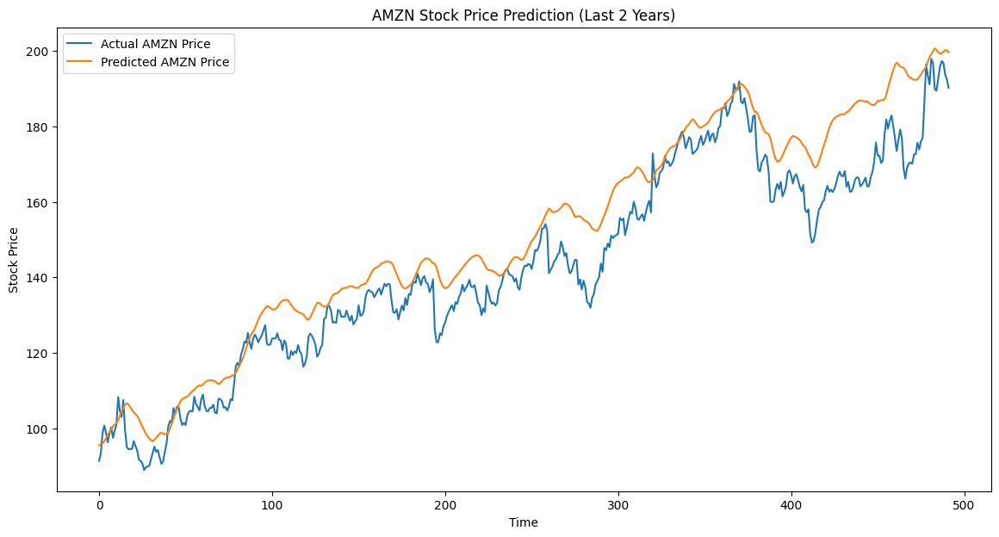

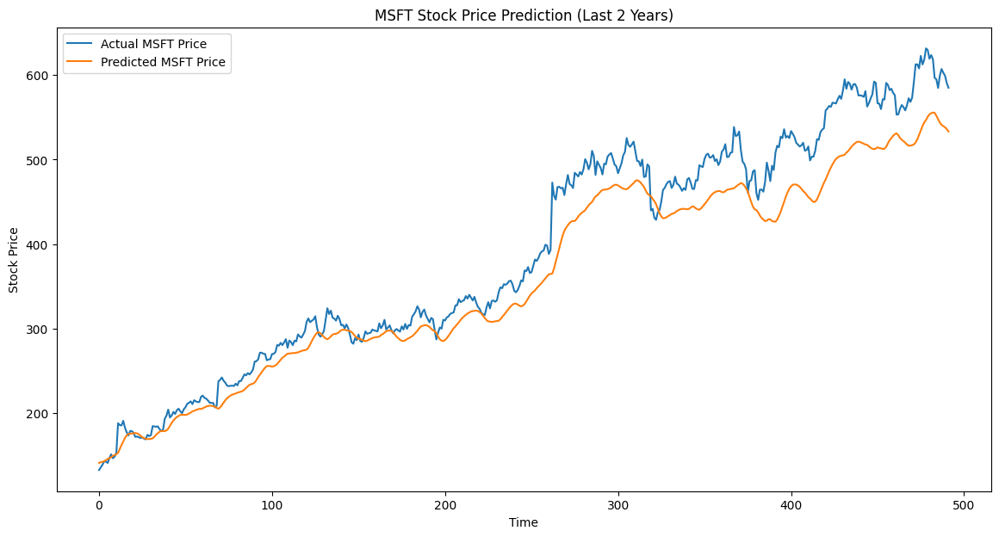

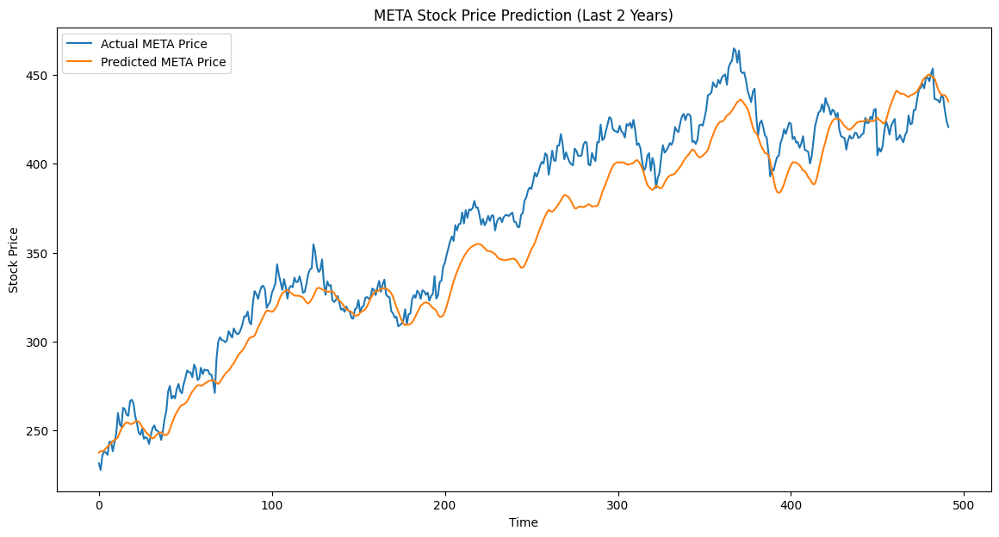

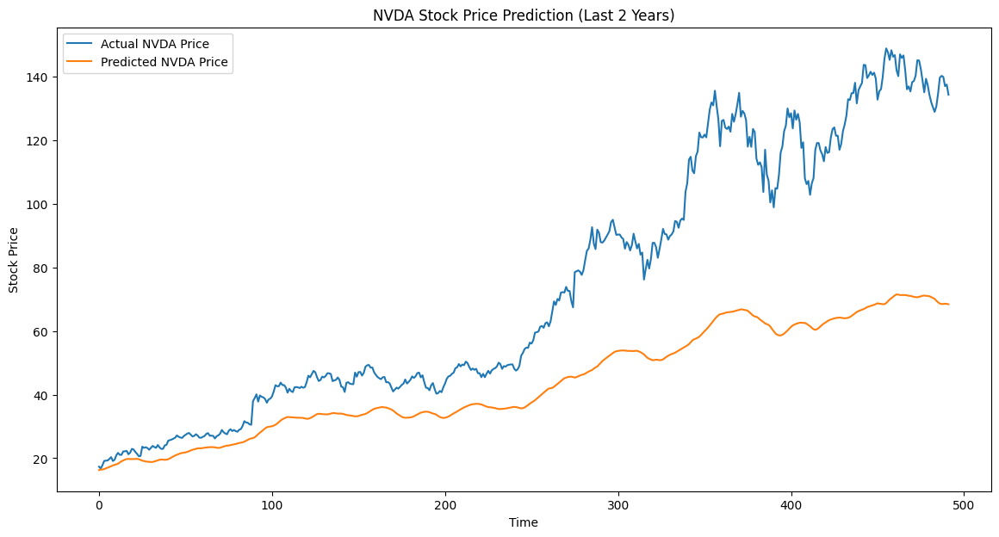

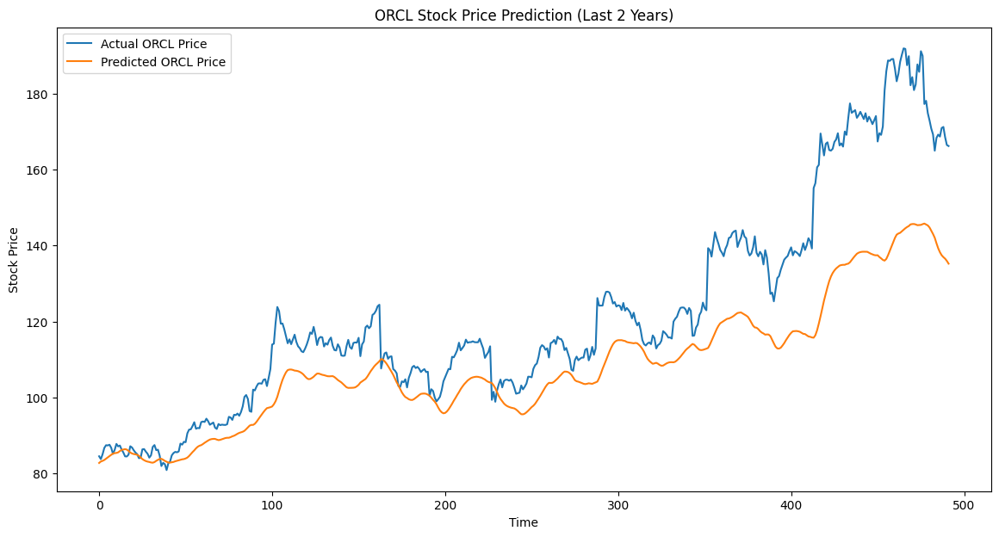

In [ ]:
for i, stock in enumerate(stocks):
    plt.figure(figsize=(14, 7))
    plt.plot(y_test_rescaled[:, i], label=f"Actual {stock} Price")
    plt.plot(predictions_rescaled[:, i], label=f"Predicted {stock} Price")
    plt.title(f'{stock} Stock Price Prediction (Last 2 Years)')
    plt.xlabel('Time')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

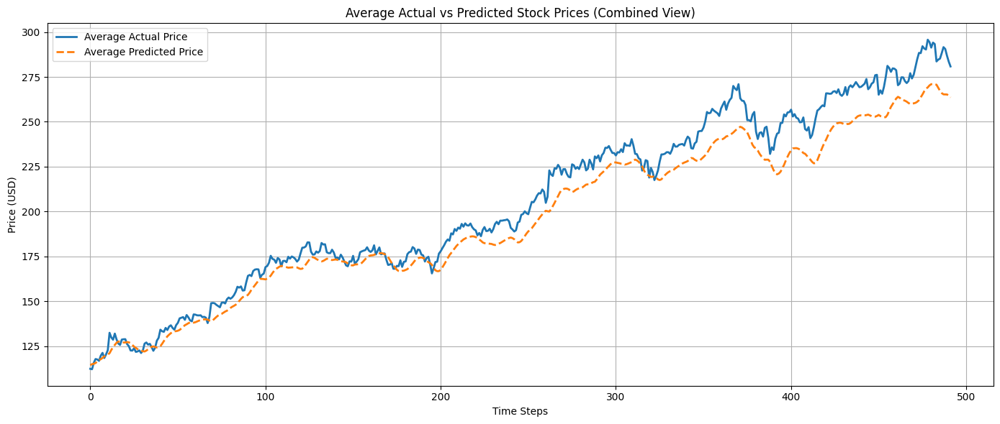

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Take the average across stocks for each time step
avg_actual = np.mean(y_test_rescaled, axis=1)
avg_predicted = np.mean(predictions_rescaled, axis=1)

# Plot
plt.figure(figsize=(14, 6))
plt.plot(avg_actual, label='Average Actual Price', linewidth=2)
plt.plot(avg_predicted, label='Average Predicted Price', linewidth=2, linestyle='--')
plt.title('Average Actual vs Predicted Stock Prices (Combined View)')
plt.xlabel('Time Steps')
plt.ylabel('Price (USD)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



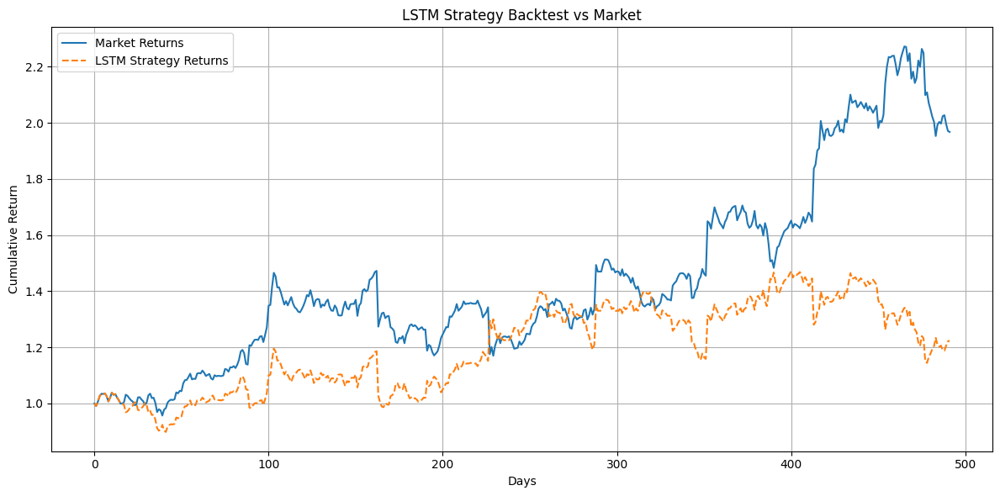

📈 Cumulative Return (Strategy): 22.36%
📉 Sharpe Ratio: 0.49


In [ ]:
###Backtesting for profitability

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# STEP 1:  We will Prepare  the predictions and  the actuals

actual = y_test_rescaled[:, i]  # Actual closing price of stock i
predicted = predictions_rescaled[:, i]  # Model’s prediction


# STEP 2: We create atrading signal
# If the predicted next price (is greater than )> current price then go long (1)
# If the  predicted next price (is less than) < current price then go short (-1)
# If it is equal we will hold (0)
signals = np.where(np.roll(predicted, -1) > predicted, 1, -1)
signals[-1] = 0  # last day no trade

# STEP 3:  we calculate the  daily returns ( on the basis of the actual prices)
returns = np.diff(actual) / actual[:-1]
returns = np.insert(returns, 0, 0)  # insert 0 for first day

# STEP 4: calculate  the strategy return
strategy_returns = signals[:-1] * returns[1:]  # use the lagged position
strategy_returns = np.insert(strategy_returns, 0, 0)

# STEP 5: Cumulative returns
cumulative_strategy = (1 + strategy_returns).cumprod()
cumulative_market = (1 + returns).cumprod()

# STEP 6: Sharpe Ratio
sharpe = (np.mean(strategy_returns) / np.std(strategy_returns)) * np.sqrt(252)

# STEP 7: Plot results
plt.figure(figsize=(12,6))
plt.plot(cumulative_market, label='Market Returns')
plt.plot(cumulative_strategy, label='LSTM Strategy Returns', linestyle='--')
plt.title("LSTM Strategy Backtest vs Market")
plt.xlabel("Days")
plt.ylabel("Cumulative Return")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

# STEP 8: Summary metrics
print(f"📈 Cumulative Return (Strategy): {(cumulative_strategy[-1] - 1) * 100:.2f}%")
print(f"📉 Sharpe Ratio: {sharpe:.2f}")


*Why Sharpe Ratio and Cumulative return?*


Sharpe ratio Tells you how much return you earn per unit of risk (volatility).

A high Sharpe ratio means the strategy gives good returns without being too risky.



In [ ]:
print("actual[:5]:", actual[:5])
print("predicted[:5]:", predicted[:5])
print("returns[:5]:", returns[:5])
print("strategy_returns[:5]:", strategy_returns[:5])
print("cumulative_strategy[:5]:", cumulative_strategy[:5])
print("cumulative_market[:5]:", cumulative_market[:5])



actual[:5]: [84.48929596 83.7390213  85.01546478 86.69140625 87.40271759]
predicted[:5]: [80.86568  81.2083   81.38695  81.67192  82.093994]
returns[:5]: [ 0.         -0.00888011  0.01524311  0.01971337  0.0082051 ]
strategy_returns[:5]: [ 0.         -0.00888011  0.01524311  0.01971337  0.0082051 ]
cumulative_strategy[:5]: [1.         0.99111989 1.00622764 1.02606378 1.03448273]
cumulative_market[:5]: [1.         0.99111989 1.00622764 1.02606378 1.03448273]


This is the pure LSTM approach


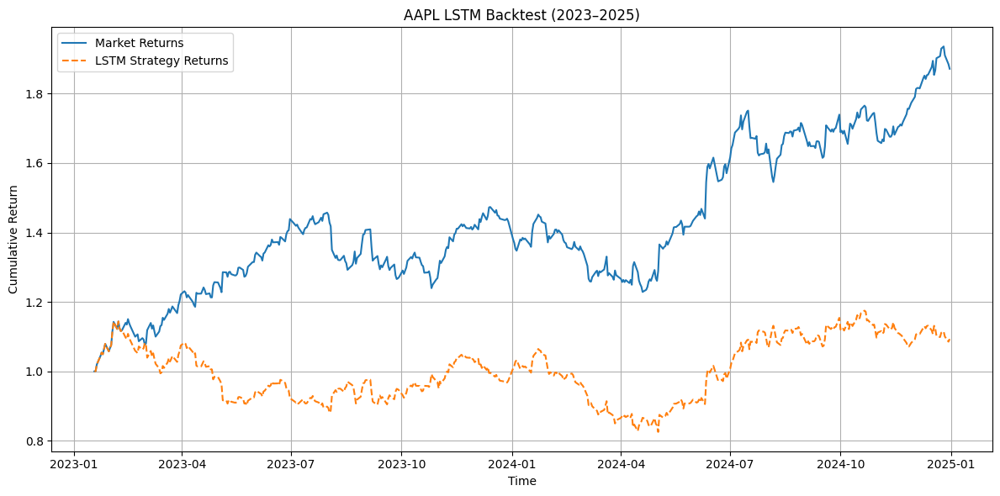


📊 AAPL — LSTM Strategy (2023–2025)
📆 Period: 2023-01-18 to 2024-12-31
💰 Total Strategy Return: 9.31%
📉 Sharpe Ratio: 0.32


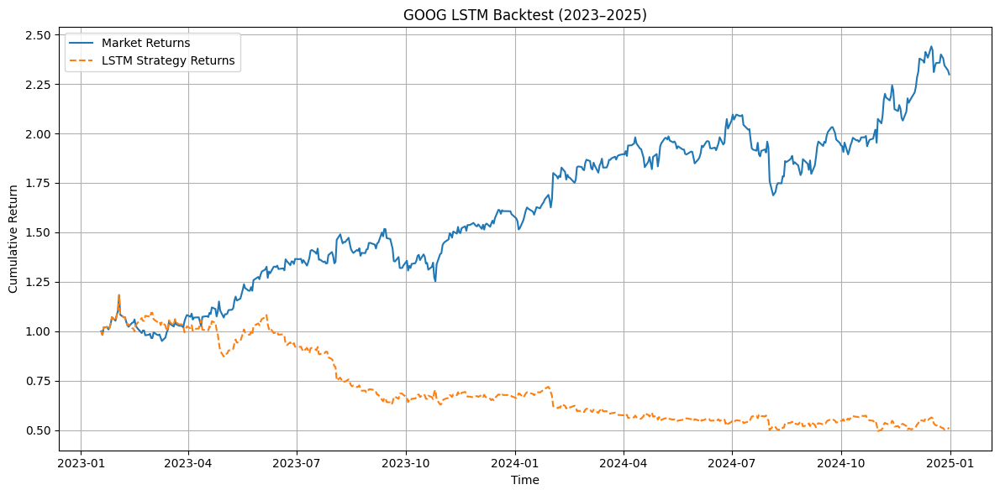


📊 GOOG — LSTM Strategy (2023–2025)
📆 Period: 2023-01-18 to 2024-12-31
💰 Total Strategy Return: -48.79%
📉 Sharpe Ratio: -0.97


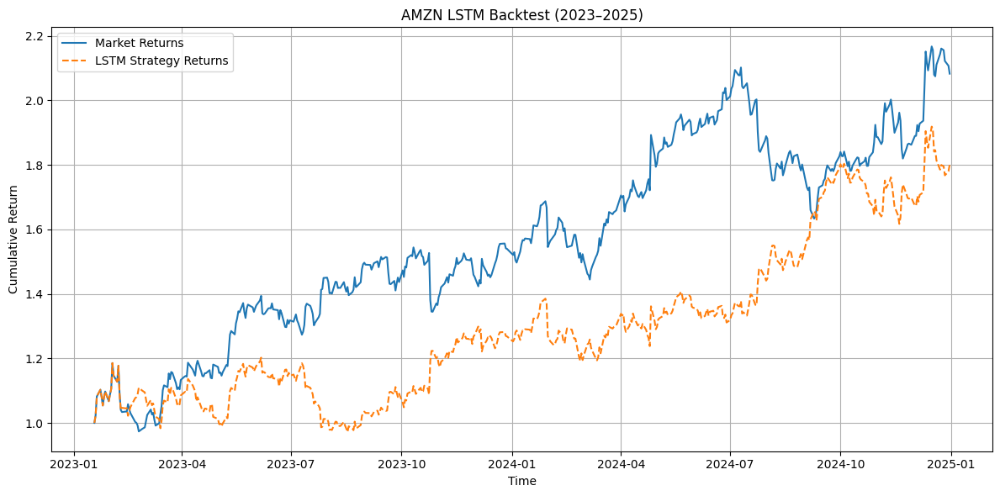


📊 AMZN — LSTM Strategy (2023–2025)
📆 Period: 2023-01-18 to 2024-12-31
💰 Total Strategy Return: 80.03%
📉 Sharpe Ratio: 1.17


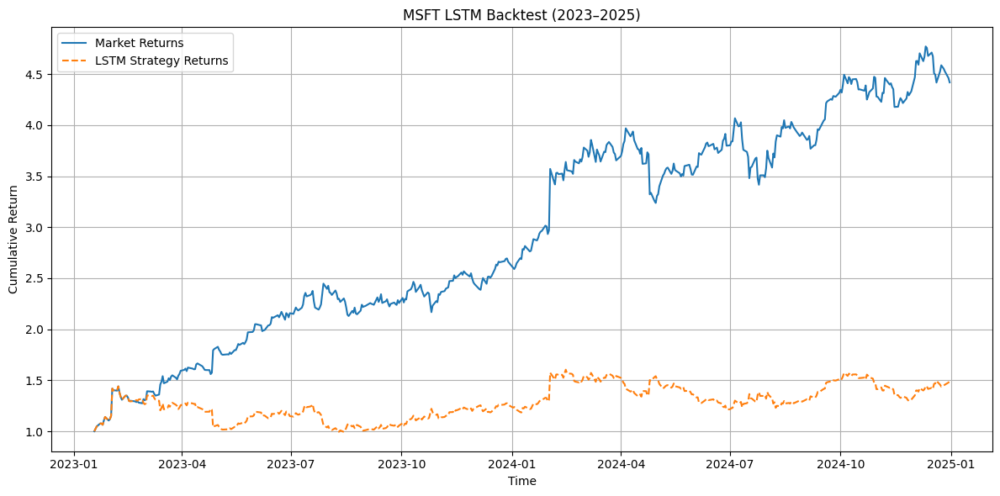


📊 MSFT — LSTM Strategy (2023–2025)
📆 Period: 2023-01-18 to 2024-12-31
💰 Total Strategy Return: 49.20%
📉 Sharpe Ratio: 0.72


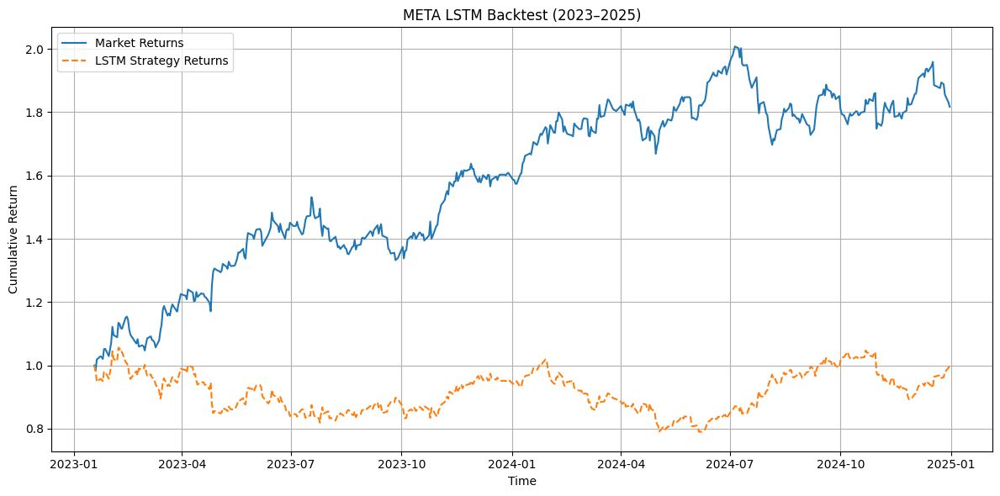


📊 META — LSTM Strategy (2023–2025)
📆 Period: 2023-01-18 to 2024-12-31
💰 Total Strategy Return: 0.01%
📉 Sharpe Ratio: 0.11


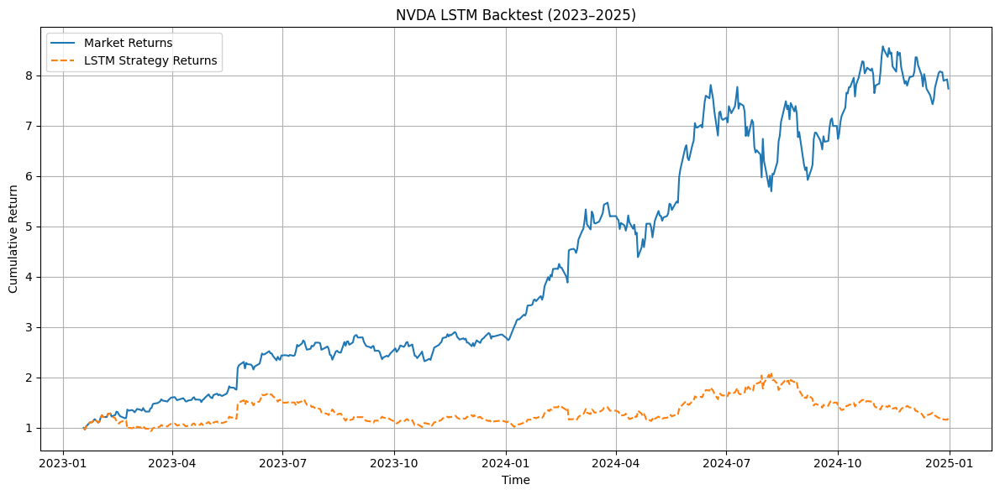


📊 NVDA — LSTM Strategy (2023–2025)
📆 Period: 2023-01-18 to 2024-12-31
💰 Total Strategy Return: 18.69%
📉 Sharpe Ratio: 0.43


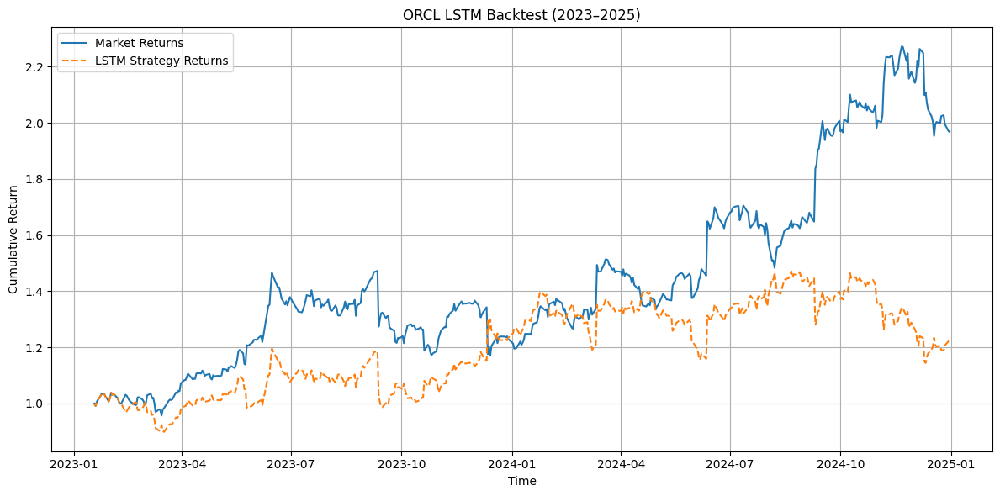


📊 ORCL — LSTM Strategy (2023–2025)
📆 Period: 2023-01-18 to 2024-12-31
💰 Total Strategy Return: 22.36%
📉 Sharpe Ratio: 0.49

📊 Summary of LSTM Backtest (2023–2025):
  Stock  Sharpe Ratio  Total Return (%)       Start         End
0  AAPL          0.32              9.31  2023-01-18  2024-12-31
1  GOOG         -0.97            -48.79  2023-01-18  2024-12-31
2  AMZN          1.17             80.03  2023-01-18  2024-12-31
3  MSFT          0.72             49.20  2023-01-18  2024-12-31
4  META          0.11              0.01  2023-01-18  2024-12-31
5  NVDA          0.43             18.69  2023-01-18  2024-12-31
6  ORCL          0.49             22.36  2023-01-18  2024-12-31


In [ ]:
####LSTM more comprehensive backtest


#  Results container
lstm_results = []

# Get dates for the test set
test_dates = stock_data.index[-len(y_test):]  # same length as y_test

for i, stock in enumerate(stocks):
    actual = y_test_rescaled[:, i]
    predicted = predictions_rescaled[:, i]

    # Create daily returns
    returns = np.diff(actual) / actual[:-1]
    returns = np.insert(returns, 0, 0)

    signals = np.where(np.roll(predicted, -1) > predicted, 1, -1)
    signals[-1] = 0

    strategy_returns = signals[:-1] * returns[1:]
    strategy_returns = np.insert(strategy_returns, 0, 0)

    # Construct a DataFrame for time alignment
    df_backtest = pd.DataFrame({
        "Actual": actual,
        "Predicted": predicted,
        "Market_Returns": returns,
        "Strategy_Returns": strategy_returns
    }, index=test_dates)

    # Filter to last 2 years
    df_eval = df_backtest[df_backtest.index >= pd.Timestamp("2023-01-01")].copy()
    df_eval["Cumulative_Market"] = (1 + df_eval["Market_Returns"]).cumprod()
    df_eval["Cumulative_Strategy"] = (1 + df_eval["Strategy_Returns"]).cumprod()

    # Sharpe Ratio
    sharpe = df_eval["Strategy_Returns"].mean() / df_eval["Strategy_Returns"].std()
    sharpe *= np.sqrt(252)
    total_return = df_eval["Cumulative_Strategy"].iloc[-1] - 1

    # Save results
    lstm_results.append({
        "Stock": stock,
        "Sharpe Ratio": round(sharpe, 2),
        "Total Return (%)": round(total_return * 100, 2),
        "Start": df_eval.index[0].date(),
        "End": df_eval.index[-1].date()
    })

    # Plot
    plt.figure(figsize=(12,6))
    plt.plot(df_eval["Cumulative_Market"], label="Market Returns")
    plt.plot(df_eval["Cumulative_Strategy"], label="LSTM Strategy Returns", linestyle="--")
    plt.title(f"{stock} LSTM Backtest (2023–2025)")
    plt.xlabel("Time")
    plt.ylabel("Cumulative Return")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

    # Print key metrics
    print(f"\n {stock} — LSTM Strategy (2023–2025)")
    print(f" Period: {df_eval.index[0].date()} to {df_eval.index[-1].date()}")
    print(f" Total Strategy Return: {total_return * 100:.2f}%")
    print(f" Sharpe Ratio: {sharpe:.2f}")

# Final summary table
lstm_results_df = pd.DataFrame(lstm_results)
print("\n Summary of LSTM Backtest (2023–2025):")
print(lstm_results_df)







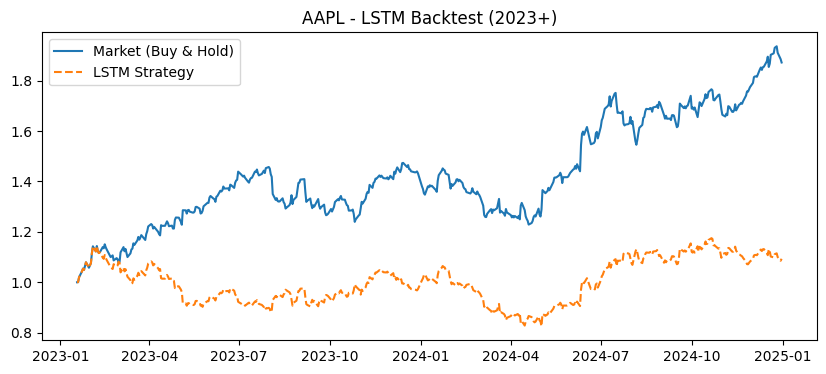

AAPL => Return: 9.31%, Sharpe: 0.32


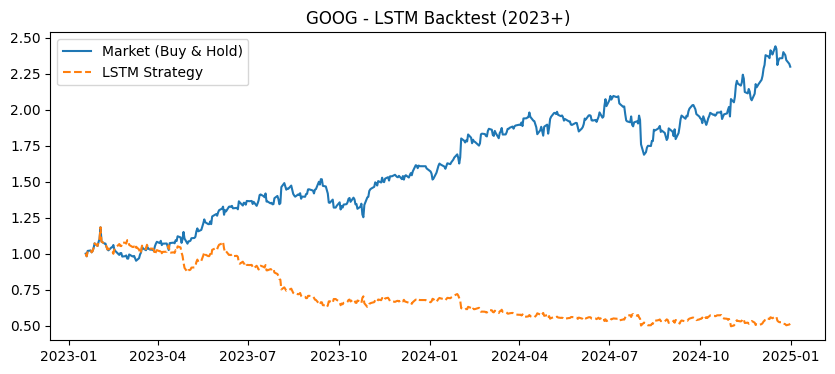

GOOG => Return: -48.79%, Sharpe: -0.97


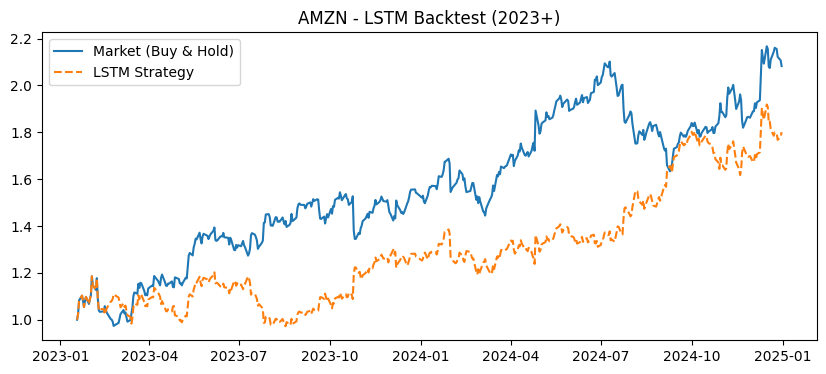

AMZN => Return: 80.03%, Sharpe: 1.17


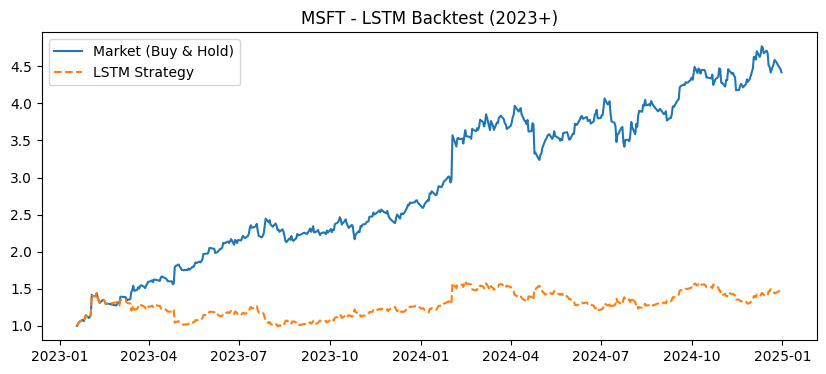

MSFT => Return: 49.20%, Sharpe: 0.72


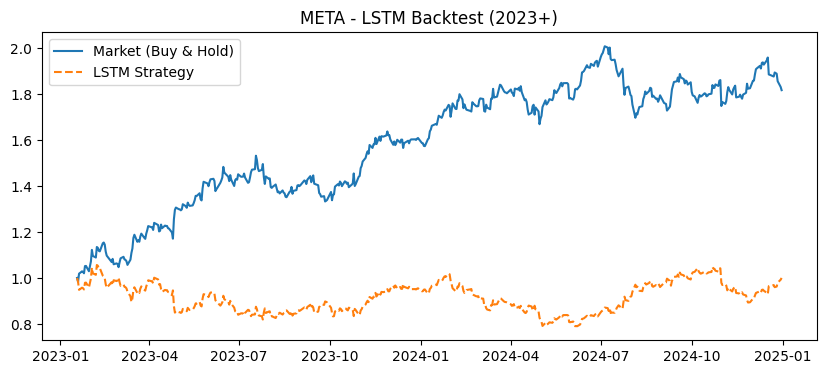

META => Return: 0.01%, Sharpe: 0.11


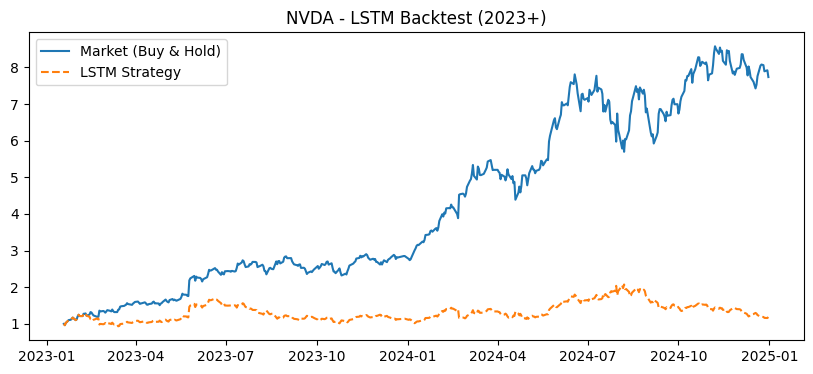

NVDA => Return: 18.69%, Sharpe: 0.43


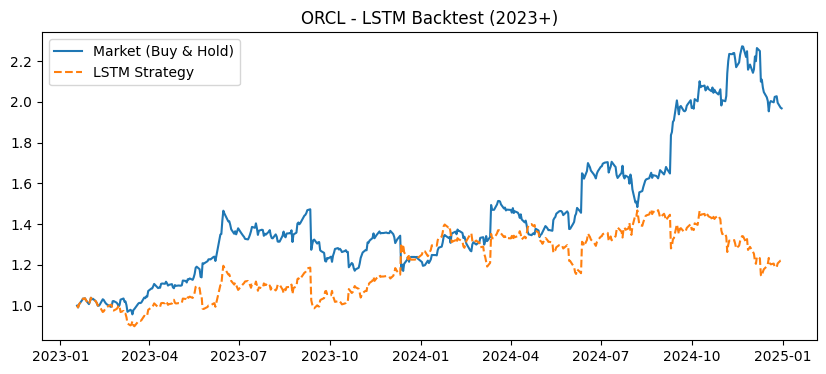

ORCL => Return: 22.36%, Sharpe: 0.49


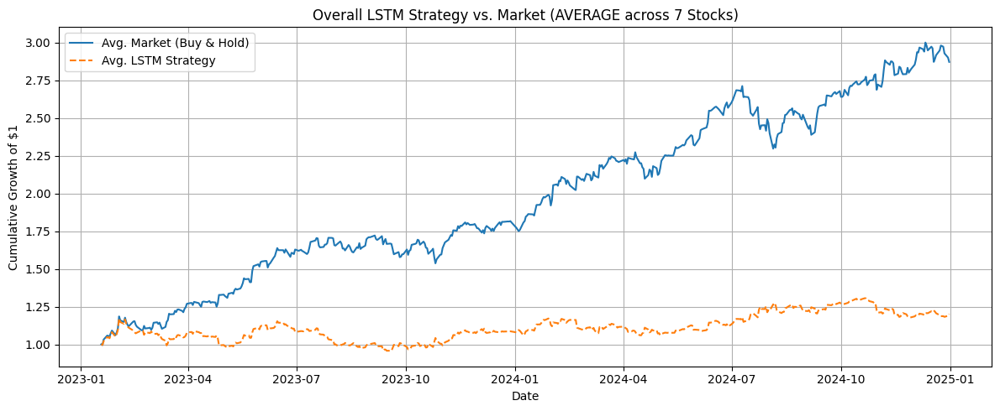

---------- LSTM Aggregated Results (2023+ ) ----------
Overall Mean LSTM Strategy Return: 20.08%
Overall Sharpe Ratio (Avg Strategy): 0.58
------------------------------------------------------


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


lstm_market_returns = []
lstm_strategy_returns = []


for i, stock in enumerate(stocks):

    actual = y_test_rescaled[:, i]
    predicted = predictions_rescaled[:, i]


    market_returns = np.diff(actual) / actual[:-1]
    market_returns = np.insert(market_returns, 0, 0)


    signals = np.where(np.roll(predicted, -1) > predicted, 1, -1)
    signals[-1] = 0


    strategy_returns = signals[:-1] * market_returns[1:]
    strategy_returns = np.insert(strategy_returns, 0, 0)


    df_backtest = pd.DataFrame({
        "Market_Returns": market_returns,
        "Strategy_Returns": strategy_returns
    }, index=test_dates)


    df_eval = df_backtest[df_backtest.index >= pd.Timestamp("2023-01-01")].copy()



    lstm_market_returns.append(df_eval["Market_Returns"])
    lstm_strategy_returns.append(df_eval["Strategy_Returns"])



    df_eval["Cumulative_Market"]   = (1 + df_eval["Market_Returns"]).cumprod()
    df_eval["Cumulative_Strategy"] = (1 + df_eval["Strategy_Returns"]).cumprod()

    plt.figure(figsize=(10,4))
    plt.plot(df_eval["Cumulative_Market"], label="Market (Buy & Hold)")
    plt.plot(df_eval["Cumulative_Strategy"], label="LSTM Strategy", linestyle="--")
    plt.title(f"{stock} - LSTM Backtest (2023+)")
    plt.legend()
    plt.show()


    stock_sharpe = (
        df_eval["Strategy_Returns"].mean() / df_eval["Strategy_Returns"].std()
    ) * np.sqrt(252)
    total_return = df_eval["Cumulative_Strategy"].iloc[-1] - 1
    print(f"{stock} => Return: {total_return*100:.2f}%, Sharpe: {stock_sharpe:.2f}")


df_market_mean   = pd.concat(lstm_market_returns,   axis=1).mean(axis=1)
df_strategy_mean = pd.concat(lstm_strategy_returns, axis=1).mean(axis=1)

df_lstm_agg = pd.DataFrame({
    "Mean_Market_Return":   df_market_mean,
    "Mean_Strategy_Return": df_strategy_mean
})


df_lstm_agg["Cumulative_Market"]   = (1 + df_lstm_agg["Mean_Market_Return"]).cumprod()
df_lstm_agg["Cumulative_Strategy"] = (1 + df_lstm_agg["Mean_Strategy_Return"]).cumprod()


lstm_avg_sharpe = (
    df_lstm_agg["Mean_Strategy_Return"].mean()
    / df_lstm_agg["Mean_Strategy_Return"].std()
) * np.sqrt(252)

lstm_avg_total_return = df_lstm_agg["Cumulative_Strategy"].iloc[-1] - 1

plt.figure(figsize=(12,5))
plt.plot(df_lstm_agg["Cumulative_Market"],   label="Avg. Market (Buy & Hold)")
plt.plot(df_lstm_agg["Cumulative_Strategy"], label="Avg. LSTM Strategy", linestyle="--")
plt.title("Overall LSTM Strategy vs. Market (AVERAGE across 7 Stocks)")
plt.xlabel("Date")
plt.ylabel("Cumulative Growth of $1")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

print("LSTM Aggregated Results (2023+ ) ")
print(f"Overall Mean LSTM Strategy Return: {lstm_avg_total_return*100:.2f}%")
print(f"Overall Sharpe Ratio (Avg Strategy): {lstm_avg_sharpe:.2f}")



In [ ]:
print(df.columns.tolist())


NameError: name 'df' is not defined

In [ ]:
# Make sure all indicators are already calculated before this




df["Market_State"] = df.apply(get_market_state, axis=1)


<ipython-input-17-ae5769ca7f27>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Market_State"] = df.apply(get_market_state, axis=1)


**This is the Purist Decision theory Framework Method used Bayesian MDP**


📈 Running MDP Backtest for AAPL...
YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed
<ipython-input-2-807702ca69eb>:40: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-2-807702ca69eb>:139: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Strategy_Return"].fillna(0, inplace=True)


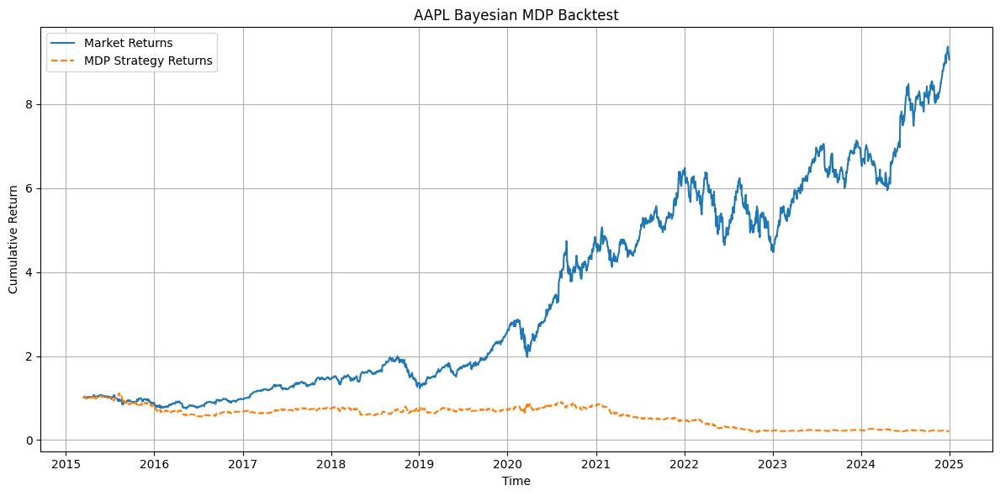

💰 Total Strategy Return: -78.13%
📉 Sharpe Ratio: -0.45

📈 Running MDP Backtest for GOOG...


[*********************100%***********************]  1 of 1 completed
<ipython-input-2-807702ca69eb>:40: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-2-807702ca69eb>:139: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Strategy_Return"].fillna(0, inplace=True)


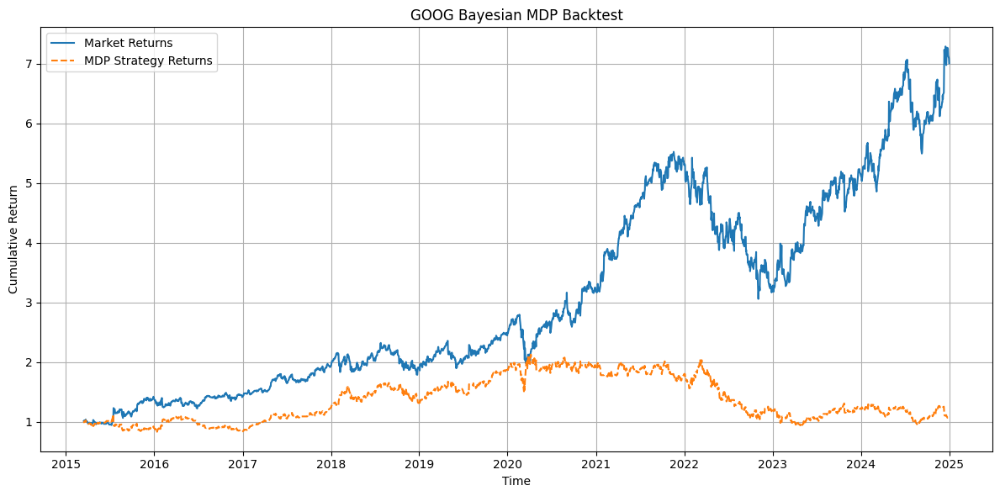

[*********************100%***********************]  1 of 1 completed

💰 Total Strategy Return: 9.65%
📉 Sharpe Ratio: 0.17

📈 Running MDP Backtest for AMZN...



<ipython-input-2-807702ca69eb>:40: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-2-807702ca69eb>:139: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Strategy_Return"].fillna(0, inplace=True)


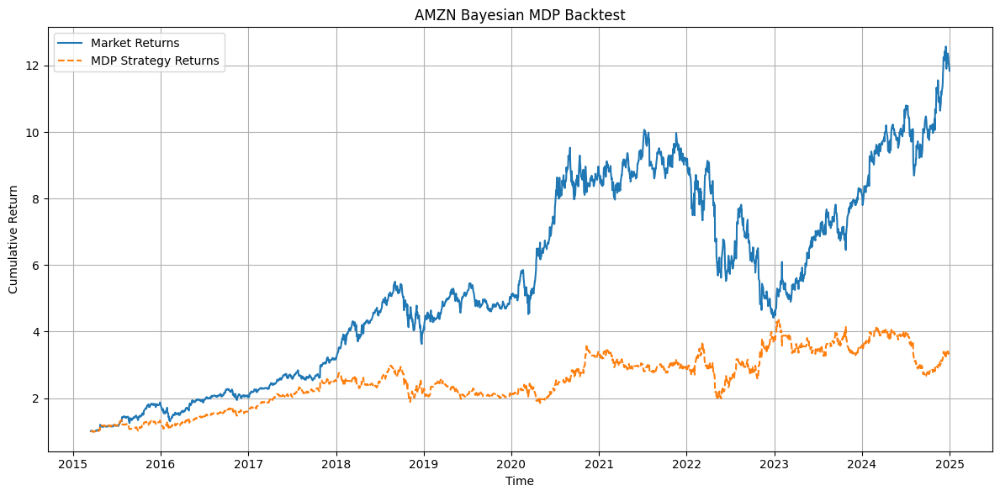

💰 Total Strategy Return: 226.87%
📉 Sharpe Ratio: 0.54

📈 Running MDP Backtest for MSFT...


[*********************100%***********************]  1 of 1 completed
<ipython-input-2-807702ca69eb>:40: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-2-807702ca69eb>:139: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Strategy_Return"].fillna(0, inplace=True)


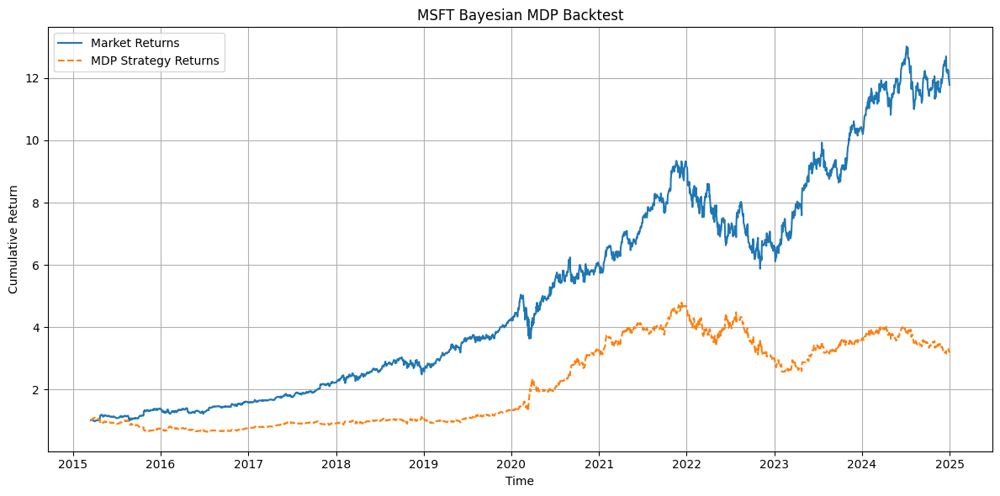

💰 Total Strategy Return: 218.07%
📉 Sharpe Ratio: 0.59

📈 Running MDP Backtest for META...


[*********************100%***********************]  1 of 1 completed
<ipython-input-2-807702ca69eb>:40: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-2-807702ca69eb>:139: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Strategy_Return"].fillna(0, inplace=True)


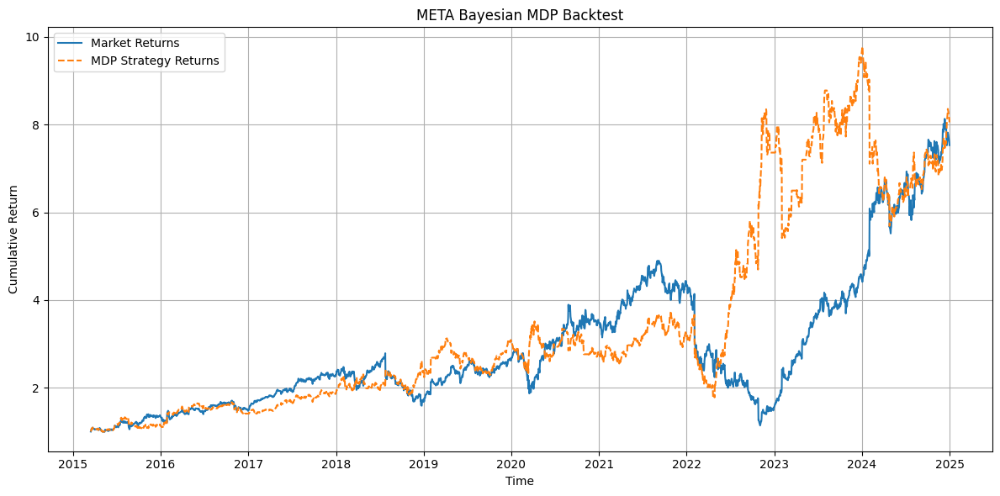

💰 Total Strategy Return: 705.13%
📉 Sharpe Ratio: 0.77

📈 Running MDP Backtest for NVDA...


[*********************100%***********************]  1 of 1 completed
<ipython-input-2-807702ca69eb>:40: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-2-807702ca69eb>:139: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Strategy_Return"].fillna(0, inplace=True)


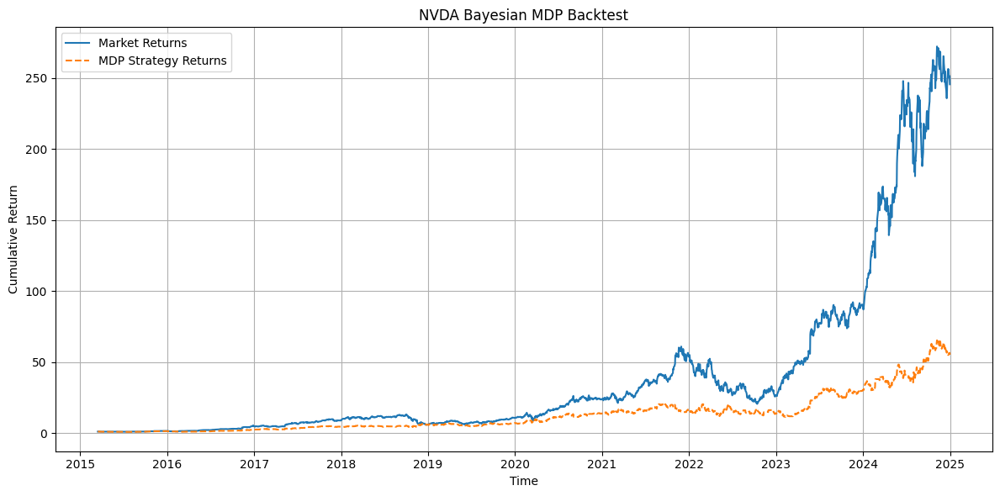

💰 Total Strategy Return: 5414.99%
📉 Sharpe Ratio: 1.13

📈 Running MDP Backtest for ORCL...


[*********************100%***********************]  1 of 1 completed
<ipython-input-2-807702ca69eb>:40: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-2-807702ca69eb>:139: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Strategy_Return"].fillna(0, inplace=True)


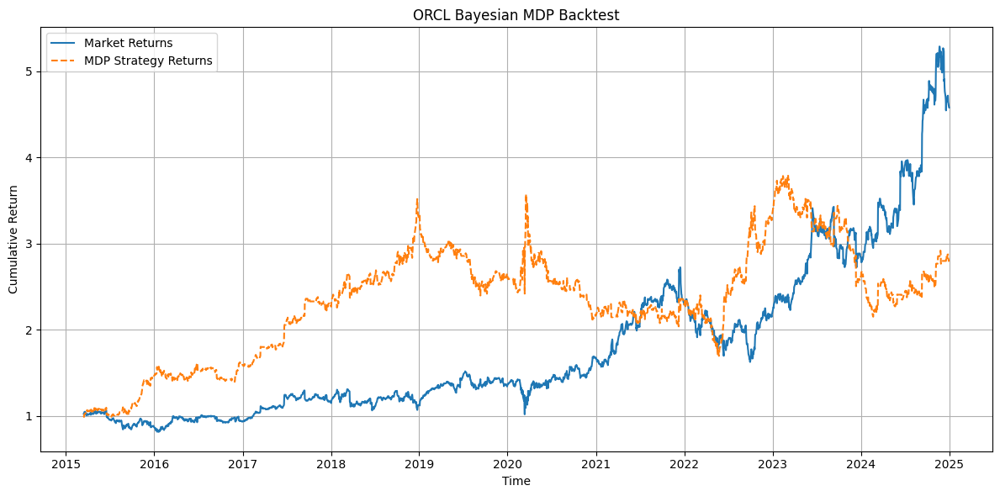

💰 Total Strategy Return: 179.04%
📉 Sharpe Ratio: 0.53


In [2]:
### More clear version
###The MDP backtest is run individually for each of the 7 stocks (AAPL, GOOG, etc.) over the period 2015–2025,
##using OHLCV data and technical indicators computed from that stock’s own history.



import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


# Step 1: Helper Functions


def add_technical_indicators(df):
    # Make sure we're working with consistent column names
    df.columns = df.columns.str.capitalize()

    df["SMA_10"] = df["Close"].rolling(window=10).mean()
    df["SMA_50"] = df["Close"].rolling(window=50).mean()
    df["SMA_20"] = df["Close"].rolling(window=20).mean()
    df["STD_20"] = df["Close"].rolling(window=20).std()

    df["Bollinger_Upper"] = df["SMA_20"] + (2 * df["STD_20"])
    df["Bollinger_Lower"] = df["SMA_20"] - (2 * df["STD_20"])

    df["EMA_12"] = df["Close"].ewm(span=12, adjust=False).mean()
    df["EMA_26"] = df["Close"].ewm(span=26, adjust=False).mean()
    df["MACD"] = df["EMA_12"] - df["EMA_26"]

    df["Typical_Price"] = (df["High"] + df["Low"] + df["Close"]) / 3
    df["Raw_Money_Flow"] = df["Typical_Price"] * df["Volume"]
    df["Positive_MF"] = np.where(df["Typical_Price"] > df["Typical_Price"].shift(1), df["Raw_Money_Flow"], 0)
    df["Negative_MF"] = np.where(df["Typical_Price"] < df["Typical_Price"].shift(1), df["Raw_Money_Flow"], 0)
    df["Money_Flow_Ratio"] = df["Positive_MF"].rolling(window=14).sum() / df["Negative_MF"].rolling(window=14).sum()
    df["MFI"] = 100 - (100 / (1 + df["Money_Flow_Ratio"]))

    df["Daily_Return"] = df["Close"].pct_change().fillna(0)
    df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')

    return df.dropna()


def get_market_state(row, macd_threshold, mfi_overbought, mfi_oversold, volatility_high, volatility_low):
    if (
        row["MACD"] > macd_threshold and
        row["Bollinger_Upper"] > row["Close"] and
        row["MFI"] > mfi_overbought
    ):
        return "Overbought"
    elif (
        row["MACD"] < macd_threshold and
        row["Bollinger_Lower"] < row["Close"] and
        row["MFI"] < mfi_oversold
    ):
        return "Oversold"
    elif row["SMA_10"] > row["SMA_50"] and row["Volatility"] < volatility_high:
        return "Uptrend"
    elif row["SMA_10"] < row["SMA_50"] and row["Volatility"] > volatility_low:
        return "Downtrend"
    else:
        return "Neutral"

def select_best_action(state, reward_matrix, transition_matrix):
    expected_rewards = {
        a: reward_matrix[state][a] * max(transition_matrix[state][a].values())
        for a in actions
    }
    return max(expected_rewards, key=expected_rewards.get)

def update_bayesian_transition(current_state, action, new_state, transition_matrix, alpha=0.3):
    transition_matrix[current_state][action][new_state] += alpha
    total = sum(transition_matrix[current_state][action].values())
    for s in transition_matrix[current_state][action]:
        transition_matrix[current_state][action][s] /= total

def get_position(state):
    return 1 if state in ["Uptrend", "Oversold"] else -1 if state in ["Downtrend", "Overbought"] else 0


# Step 2: Run for each stock


stocks = ['AAPL', 'GOOG', 'AMZN', 'MSFT', 'META', 'NVDA', 'ORCL']
start_date = '2015-01-01'
end_date = '2025-01-01'

for ticker in stocks:
    print(f"\n📈 Running MDP Backtest for {ticker}...")
    df = yf.download(ticker, start=start_date, end=end_date)
    if isinstance(df.columns, pd.MultiIndex):
      df.columns = [col[0] if isinstance(col, tuple) else col for col in df.columns]

    df = add_technical_indicators(df)

    # Thresholds for this stock
    macd_threshold = df["MACD"].median()
    mfi_overbought = df["MFI"].quantile(0.75)
    mfi_oversold = df["MFI"].quantile(0.25)
    volatility_high = df["Volatility"].quantile(0.75)
    volatility_low = df["Volatility"].quantile(0.25)

    df["Market_State"] = df.apply(
        lambda row: get_market_state(row, macd_threshold, mfi_overbought, mfi_oversold, volatility_high, volatility_low),
        axis=1
    )

    # MDP Setup
    actions = ["Buy", "Sell", "Hold"]
    states = ["Overbought", "Oversold", "Uptrend", "Downtrend", "Neutral"]

    transition_matrix = {
        state: {action: {s: 1/len(states) for s in states} for action in actions}
        for state in states
    }

    reward_matrix = {
        "Overbought": {"Buy": -10, "Sell": 15, "Hold": 5},
        "Oversold": {"Buy": 15, "Sell": -10, "Hold": 5},
        "Uptrend": {"Buy": 10, "Sell": -5, "Hold": 2},
        "Downtrend": {"Buy": -5, "Sell": 10, "Hold": 2},
        "Neutral": {"Buy": 3, "Sell": 3, "Hold": 1}
    }

    # Prediction loop
    current_state = df.iloc[0]["Market_State"]
    predictions = []

    for idx, row in df.iterrows():
        action = select_best_action(current_state, reward_matrix, transition_matrix)
        predictions.append(current_state)
        update_bayesian_transition(current_state, action, row["Market_State"], transition_matrix)
        current_state = row["Market_State"]

    df["Predicted_State"] = predictions
    df["Position"] = df["Predicted_State"].apply(get_position)
    df["Strategy_Return"] = df["Position"].shift(1) * df["Daily_Return"]
    df["Strategy_Return"].fillna(0, inplace=True)
    df["Cumulative_Market"] = (1 + df["Daily_Return"]).cumprod()
    df["Cumulative_Strategy"] = (1 + df["Strategy_Return"]).cumprod()

    sharpe_ratio = df["Strategy_Return"].mean() / df["Strategy_Return"].std()
    sharpe_ratio *= np.sqrt(252)
    total_return = df["Cumulative_Strategy"].iloc[-1] - 1

    # Plot
    plt.figure(figsize=(12,6))
    plt.plot(df["Cumulative_Market"], label="Market Returns")
    plt.plot(df["Cumulative_Strategy"], label="MDP Strategy Returns", linestyle="--")
    plt.title(f"{ticker} Bayesian MDP Backtest")
    plt.xlabel("Time")
    plt.ylabel("Cumulative Return")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

    # Results
    print(f" Total Strategy Return: {total_return * 100:.2f}%")
    print(f" Sharpe Ratio: {sharpe_ratio:.2f}")


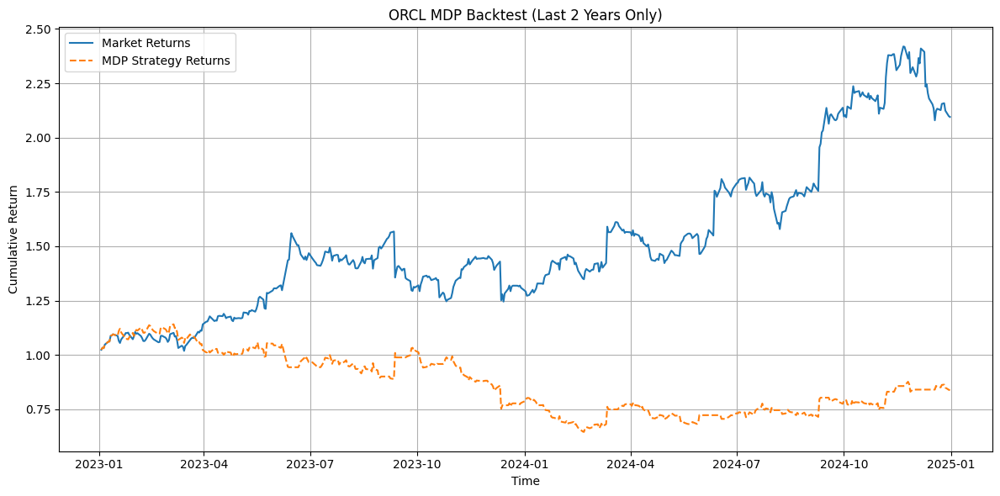

📆 Evaluation Period: 2023-01-03 to 2024-12-31
💰 Total Strategy Return (Last 2 Years): -16.15%
📉 Sharpe Ratio (Last 2 Years): -0.19


In [3]:
# 📌 FILTER to last 2 years (2023–2025)
evaluation_start = pd.Timestamp("2023-01-01")
df_eval = df[df.index >= evaluation_start].copy()

#  Recalculate cumulative returns
df_eval["Cumulative_Market"] = (1 + df_eval["Daily_Return"]).cumprod()
df_eval["Cumulative_Strategy"] = (1 + df_eval["Strategy_Return"]).cumprod()

# Sharpe Ratio and total return (last 2 years only)
sharpe_ratio = df_eval["Strategy_Return"].mean() / df_eval["Strategy_Return"].std()
sharpe_ratio *= np.sqrt(252)
total_return = df_eval["Cumulative_Strategy"].iloc[-1] - 1

#  Plot
plt.figure(figsize=(12,6))
plt.plot(df_eval["Cumulative_Market"], label="Market Returns")
plt.plot(df_eval["Cumulative_Strategy"], label="MDP Strategy Returns", linestyle="--")
plt.title(f"{ticker} MDP Backtest (Last 2 Years Only)")
plt.xlabel("Time")
plt.ylabel("Cumulative Return")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

#  Results
print(f" Evaluation Period: {df_eval.index[0].date()} to {df_eval.index[-1].date()}")
print(f" Total Strategy Return (Last 2 Years): {total_return * 100:.2f}%")
print(f" Sharpe Ratio (Last 2 Years): {sharpe_ratio:.2f}")


In [4]:
def add_technical_indicators(df):
    df["SMA_10"] = df["Close"].rolling(window=10).mean()
    df["SMA_50"] = df["Close"].rolling(window=50).mean()
    df["SMA_20"] = df["Close"].rolling(window=20).mean()
    df["STD_20"] = df["Close"].rolling(window=20).std()

    df["Bollinger_Upper"] = df["SMA_20"] + (2 * df["STD_20"])
    df["Bollinger_Lower"] = df["SMA_20"] - (2 * df["STD_20"])

    df["EMA_12"] = df["Close"].ewm(span=12, adjust=False).mean()
    df["EMA_26"] = df["Close"].ewm(span=26, adjust=False).mean()
    df["MACD"] = df["EMA_12"] - df["EMA_26"]

    df["Typical_Price"] = (df["High"] + df["Low"] + df["Close"]) / 3
    df["Raw_Money_Flow"] = df["Typical_Price"] * df["Volume"]
    df["Positive_MF"] = np.where(df["Typical_Price"] > df["Typical_Price"].shift(1), df["Raw_Money_Flow"], 0)
    df["Negative_MF"] = np.where(df["Typical_Price"] < df["Typical_Price"].shift(1), df["Raw_Money_Flow"], 0)
    df["Money_Flow_Ratio"] = df["Positive_MF"].rolling(window=14).sum() / df["Negative_MF"].rolling(window=14).sum()
    df["MFI"] = 100 - (100 / (1 + df["Money_Flow_Ratio"]))

    df["Daily_return"] = df["Close"].pct_change().fillna(0)
    df["Volatility"] = df["Daily_return"].rolling(window=10).std().fillna(method='bfill')

    return df.dropna()


[*********************100%***********************]  1 of 1 completed


📈 Running MDP Backtest for AAPL...



<ipython-input-4-9f68fe3c93bc>:22: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-5-dec7b9230ed9>:62: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Strategy_Return"].fillna(0, inplace=True)


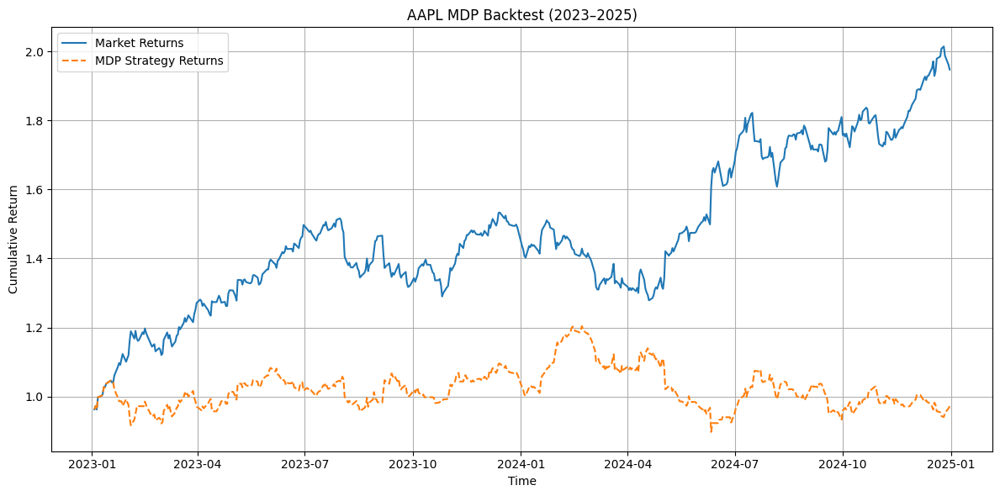

[*********************100%***********************]  1 of 1 completed

📆 Evaluation Period: 2023-01-03 to 2024-12-31
💰 Total Strategy Return (Last 2 Years): -2.78%
📉 Sharpe Ratio (Last 2 Years): 0.04

📈 Running MDP Backtest for GOOG...



<ipython-input-4-9f68fe3c93bc>:22: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-5-dec7b9230ed9>:62: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Strategy_Return"].fillna(0, inplace=True)


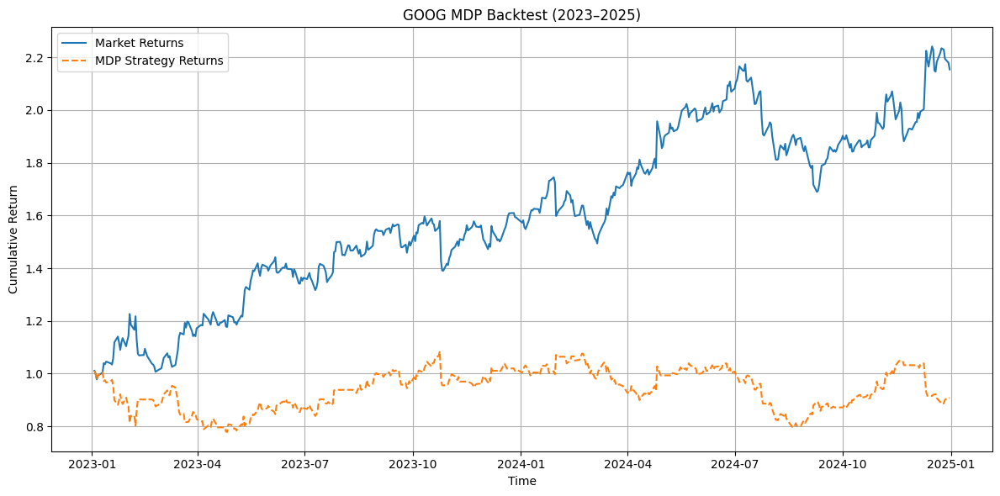

[*********************100%***********************]  1 of 1 completed

📆 Evaluation Period: 2023-01-03 to 2024-12-31
💰 Total Strategy Return (Last 2 Years): -9.26%
📉 Sharpe Ratio (Last 2 Years): -0.04

📈 Running MDP Backtest for AMZN...



<ipython-input-4-9f68fe3c93bc>:22: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-5-dec7b9230ed9>:62: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Strategy_Return"].fillna(0, inplace=True)


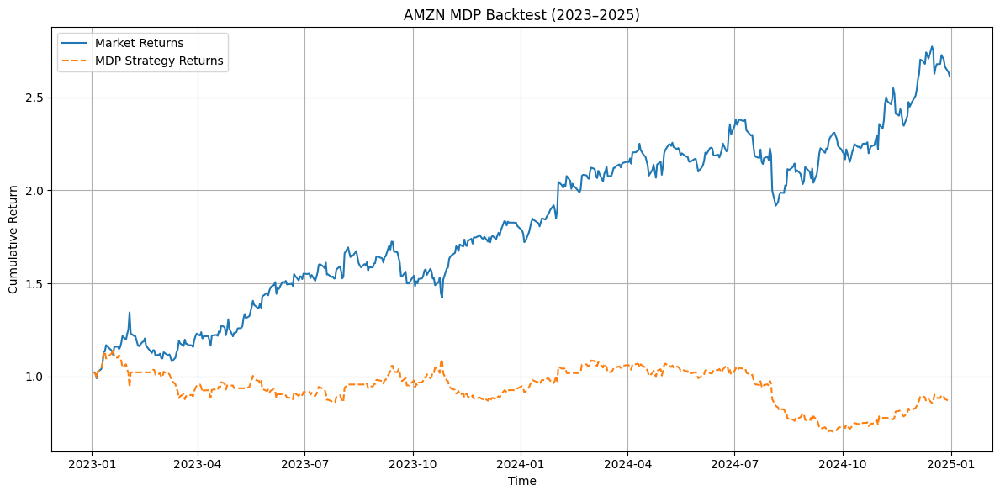

[*********************100%***********************]  1 of 1 completed

📆 Evaluation Period: 2023-01-03 to 2024-12-31
💰 Total Strategy Return (Last 2 Years): -13.87%
📉 Sharpe Ratio (Last 2 Years): -0.11

📈 Running MDP Backtest for MSFT...



<ipython-input-4-9f68fe3c93bc>:22: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-5-dec7b9230ed9>:62: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Strategy_Return"].fillna(0, inplace=True)


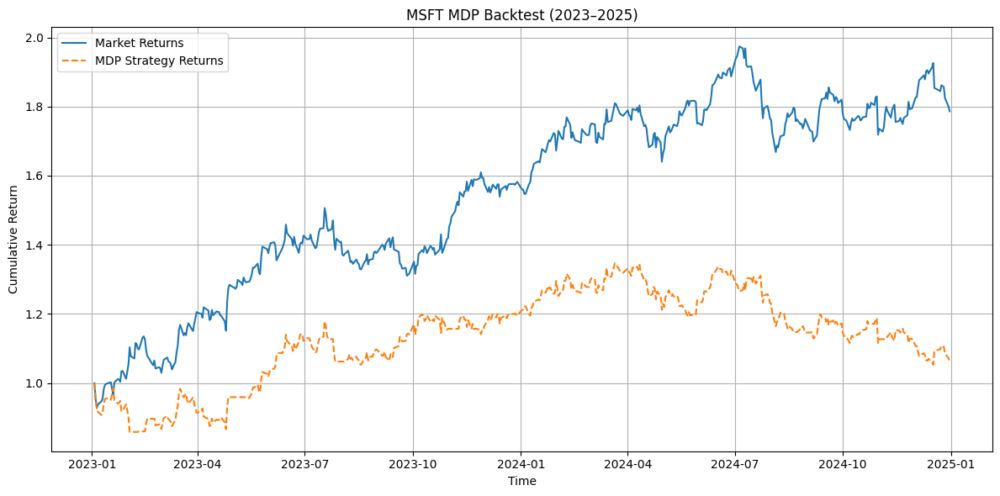

[*********************100%***********************]  1 of 1 completed

📆 Evaluation Period: 2023-01-03 to 2024-12-31
💰 Total Strategy Return (Last 2 Years): 6.31%
📉 Sharpe Ratio (Last 2 Years): 0.25

📈 Running MDP Backtest for META...



<ipython-input-4-9f68fe3c93bc>:22: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-5-dec7b9230ed9>:62: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Strategy_Return"].fillna(0, inplace=True)


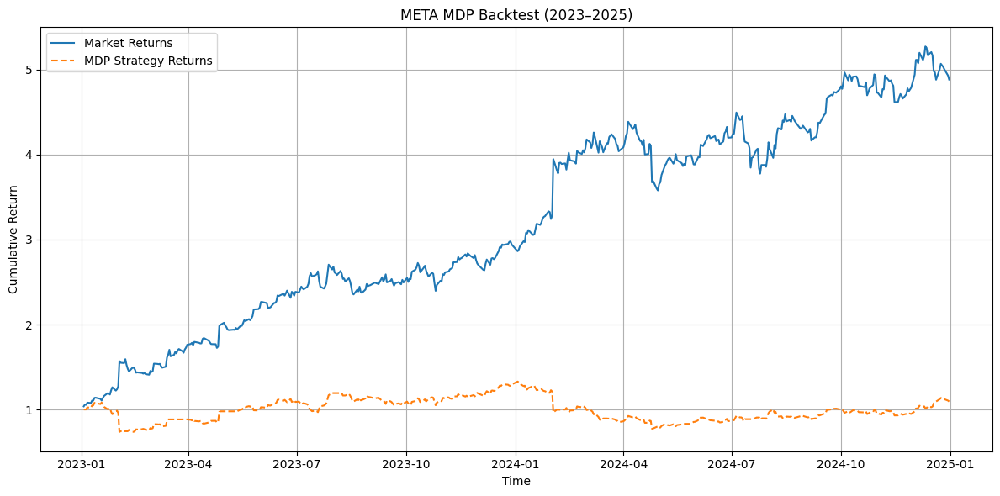

[*********************100%***********************]  1 of 1 completed

📆 Evaluation Period: 2023-01-03 to 2024-12-31
💰 Total Strategy Return (Last 2 Years): 9.39%
📉 Sharpe Ratio (Last 2 Years): 0.32

📈 Running MDP Backtest for NVDA...



<ipython-input-4-9f68fe3c93bc>:22: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-5-dec7b9230ed9>:62: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Strategy_Return"].fillna(0, inplace=True)


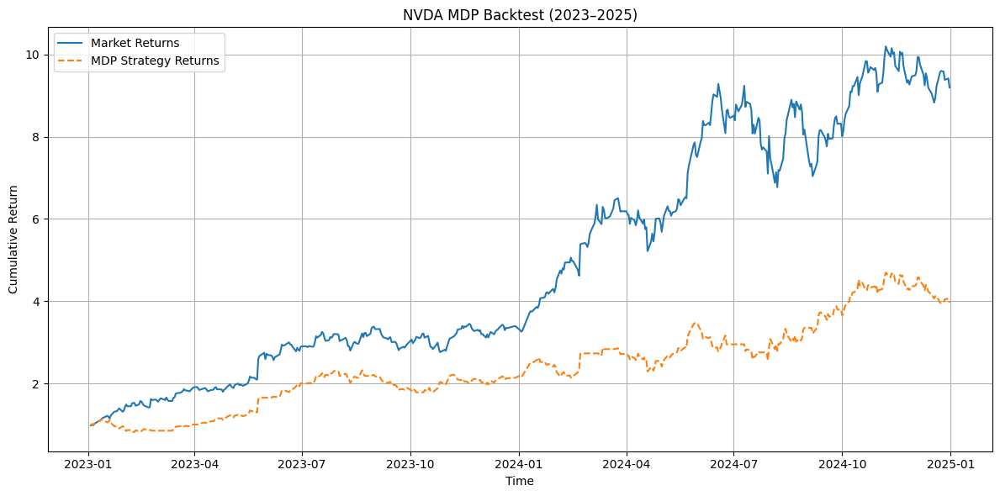

[*********************100%***********************]  1 of 1 completed

📆 Evaluation Period: 2023-01-03 to 2024-12-31
💰 Total Strategy Return (Last 2 Years): 296.44%
📉 Sharpe Ratio (Last 2 Years): 1.70

📈 Running MDP Backtest for ORCL...



<ipython-input-4-9f68fe3c93bc>:22: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-5-dec7b9230ed9>:62: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Strategy_Return"].fillna(0, inplace=True)


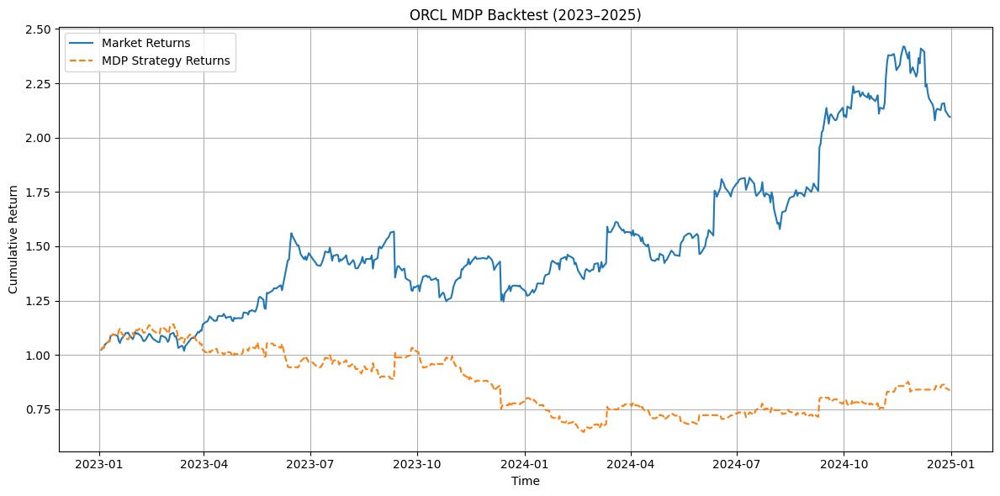

📆 Evaluation Period: 2023-01-03 to 2024-12-31
💰 Total Strategy Return (Last 2 Years): -16.15%
📉 Sharpe Ratio (Last 2 Years): -0.19

📊 Summary of MDP Backtest (2023–2025):
  Stock  Sharpe Ratio  Total Return (%)       Start         End
0  AAPL          0.04             -2.78  2023-01-03  2024-12-31
1  GOOG         -0.04             -9.26  2023-01-03  2024-12-31
2  AMZN         -0.11            -13.87  2023-01-03  2024-12-31
3  MSFT          0.25              6.31  2023-01-03  2024-12-31
4  META          0.32              9.39  2023-01-03  2024-12-31
5  NVDA          1.70            296.44  2023-01-03  2024-12-31
6  ORCL         -0.19            -16.15  2023-01-03  2024-12-31


In [5]:
# Results container
results = []

market_returns = []
strategy_returns = []

for ticker in stocks:
    print(f"\n📈 Running MDP Backtest for {ticker}...")

    df = yf.download(ticker, start=start_date, end=end_date)



    # Fix column names
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [col[0] if isinstance(col, tuple) else col for col in df.columns]
    df.columns = [col.capitalize() for col in df.columns]

    df = add_technical_indicators(df)

    # Dynamic thresholds
    macd_threshold = df["MACD"].median()
    mfi_overbought = df["MFI"].quantile(0.75)
    mfi_oversold = df["MFI"].quantile(0.25)
    volatility_high = df["Volatility"].quantile(0.75)
    volatility_low = df["Volatility"].quantile(0.25)

    df["Market_State"] = df.apply(
        lambda row: get_market_state(row, macd_threshold, mfi_overbought, mfi_oversold, volatility_high, volatility_low),
        axis=1
    )

    # MDP setup
    actions = ["Buy", "Sell", "Hold"]
    states = ["Overbought", "Oversold", "Uptrend", "Downtrend", "Neutral"]

    transition_matrix = {
        state: {action: {s: 1/len(states) for s in states} for action in actions}
        for state in states
    }

    reward_matrix = {
        "Overbought": {"Buy": -10, "Sell": 15, "Hold": 5},
        "Oversold": {"Buy": 15, "Sell": -10, "Hold": 5},
        "Uptrend": {"Buy": 10, "Sell": -5, "Hold": 2},
        "Downtrend": {"Buy": -5, "Sell": 10, "Hold": 2},
        "Neutral": {"Buy": 3, "Sell": 3, "Hold": 1}
    }

    current_state = df.iloc[0]["Market_State"]
    predictions = []

    for _, row in df.iterrows():
        action = select_best_action(current_state, reward_matrix, transition_matrix)
        predictions.append(current_state)
        update_bayesian_transition(current_state, action, row["Market_State"], transition_matrix)
        current_state = row["Market_State"]

    df["Predicted_State"] = predictions
    df["Position"] = df["Predicted_State"].apply(get_position)
    df["Strategy_Return"] = df["Position"].shift(1) * df["Daily_return"]
    df["Strategy_Return"].fillna(0, inplace=True)
    df["Cumulative_Market"] = (1 + df["Daily_return"]).cumprod()
    df["Cumulative_Strategy"] = (1 + df["Strategy_Return"]).cumprod()

    #  Filter to last 2 years
    evaluation_start = pd.Timestamp("2023-01-01")
    df_eval = df[df.index >= evaluation_start].copy()

    df_eval["Cumulative_Market"] = (1 + df_eval["Daily_return"]).cumprod()
    df_eval["Cumulative_Strategy"] = (1 + df_eval["Strategy_Return"]).cumprod()

    sharpe_ratio = df_eval["Strategy_Return"].mean() / df_eval["Strategy_Return"].std()
    sharpe_ratio *= np.sqrt(252)
    total_return = df_eval["Cumulative_Strategy"].iloc[-1] - 1

    #  Store results
    results.append({
        "Stock": ticker,
        "Sharpe Ratio": round(sharpe_ratio, 2),
        "Total Return (%)": round(total_return * 100, 2),
        "Start": df_eval.index[0].date(),
        "End": df_eval.index[-1].date()
    })

    #  Plot
    plt.figure(figsize=(12,6))
    plt.plot(df_eval["Cumulative_Market"], label="Market Returns")
    plt.plot(df_eval["Cumulative_Strategy"], label="MDP Strategy Returns", linestyle="--")
    plt.title(f"{ticker} MDP Backtest (2023–2025)")
    plt.xlabel("Time")
    plt.ylabel("Cumulative Return")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

    market_returns.append(df_eval["Daily_return"])
    strategy_returns.append(df_eval["Strategy_Return"])


    #  Print stats
    print(f" Evaluation Period: {df_eval.index[0].date()} to {df_eval.index[-1].date()}")
    print(f" Total Strategy Return (Last 2 Years): {total_return * 100:.2f}%")
    print(f" Sharpe Ratio (Last 2 Years): {sharpe_ratio:.2f}")

# Final summary
results_df = pd.DataFrame(results)
print("\n Summary of MDP Backtest (2023–2025):")
print(results_df)



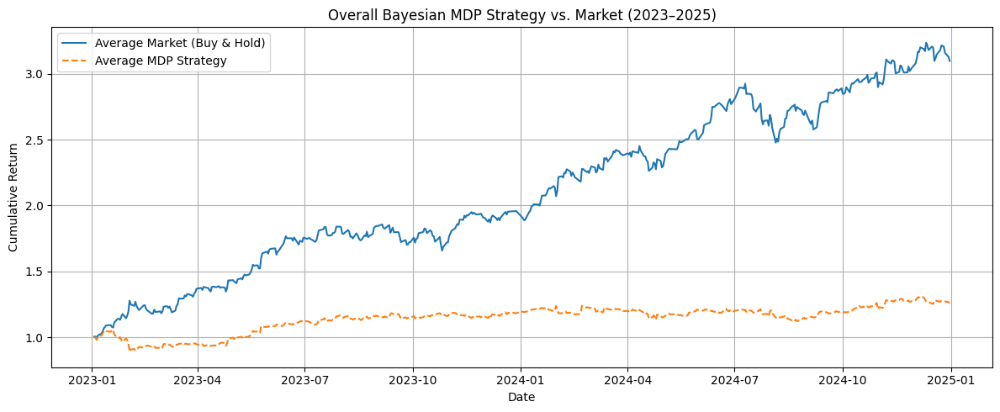

✅ Overall MDP Strategy Return (2023–2025): 25.90%
📈 Overall Sharpe Ratio (Average Strategy): 0.81


In [ ]:

# ONE-CELL SNIPPET (After Loop)

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# 1) Align all stocks by date and take the mean return across them
df_market = pd.concat(market_returns, axis=1).mean(axis=1)    # average daily market return
df_strategy = pd.concat(strategy_returns, axis=1).mean(axis=1)  # average daily strategy return

# 2) Build a DataFrame for the aggregated returns
df_agg = pd.DataFrame({
    "Mean_Market_Return": df_market,
    "Mean_Strategy_Return": df_strategy
})

# 3) Compute cumulative returns for the average series
df_agg["Cumulative_Market"] = (1 + df_agg["Mean_Market_Return"]).cumprod()
df_agg["Cumulative_Strategy"] = (1 + df_agg["Mean_Strategy_Return"]).cumprod()

# 4) Calculate overall Sharpe Ratio (on the average daily strategy)
avg_strategy_return = df_agg["Mean_Strategy_Return"].mean()
avg_strategy_std = df_agg["Mean_Strategy_Return"].std()
sharpe_ratio = (avg_strategy_return / avg_strategy_std) * np.sqrt(252)

# 5) Plot
plt.figure(figsize=(12,5))
plt.plot(df_agg.index, df_agg["Cumulative_Market"], label="Average Market (Buy & Hold)")
plt.plot(df_agg.index, df_agg["Cumulative_Strategy"],
         label="Average MDP Strategy", linestyle="--")
plt.title("Overall Bayesian MDP Strategy vs. Market (2023–2025)")
plt.xlabel("Date")
plt.ylabel("Cumulative Return")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# 6) Print final stats
final_strategy_return = df_agg["Cumulative_Strategy"].iloc[-1] - 1
print(f" Overall MDP Strategy Return (2023–2025): {final_strategy_return * 100:.2f}%")
print(f" Overall Sharpe Ratio (Average Strategy): {sharpe_ratio:.2f}")


Hybrid MDP + LSTM attempt 1

[*********************100%***********************]  1 of 1 completed


📊 Running Hybrid Model for AAPL...



<ipython-input-40-e0b0638e6828>:38: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-40-e0b0638e6828>:91: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


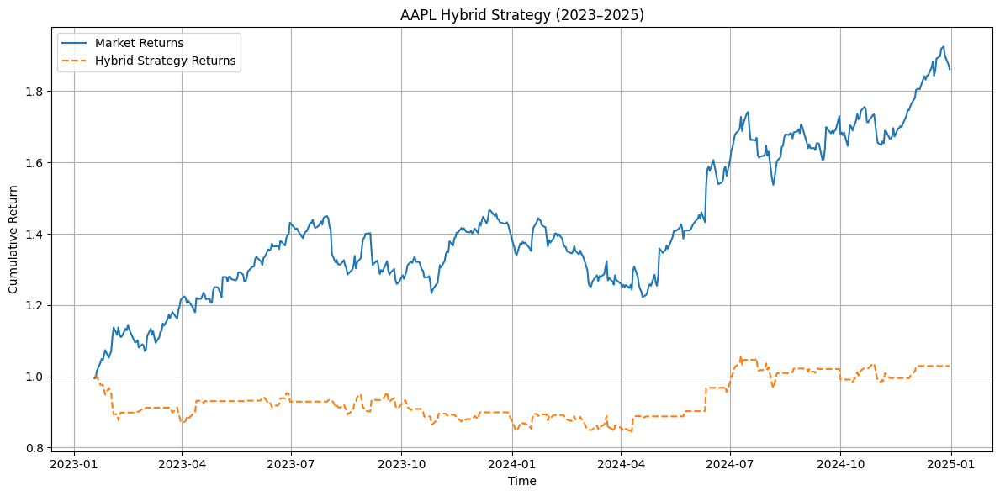

[*********************100%***********************]  1 of 1 completed


📊 Running Hybrid Model for GOOG...



<ipython-input-40-e0b0638e6828>:38: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-40-e0b0638e6828>:91: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


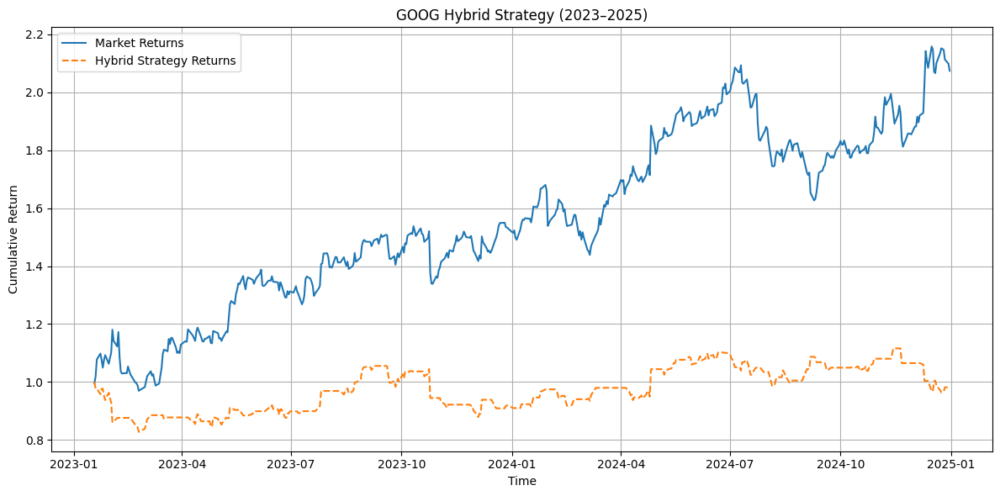

[*********************100%***********************]  1 of 1 completed


📊 Running Hybrid Model for AMZN...



<ipython-input-40-e0b0638e6828>:38: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-40-e0b0638e6828>:91: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


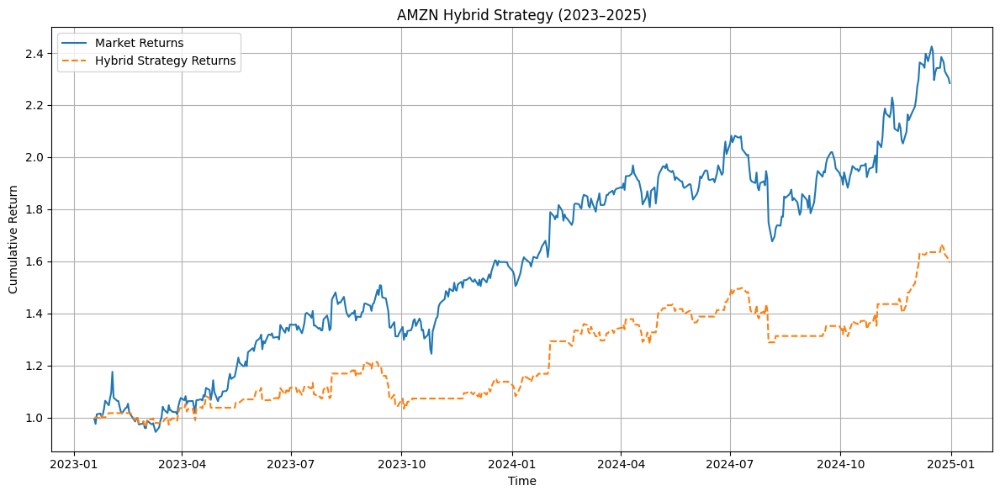

[*********************100%***********************]  1 of 1 completed


📊 Running Hybrid Model for MSFT...



<ipython-input-40-e0b0638e6828>:38: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-40-e0b0638e6828>:91: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


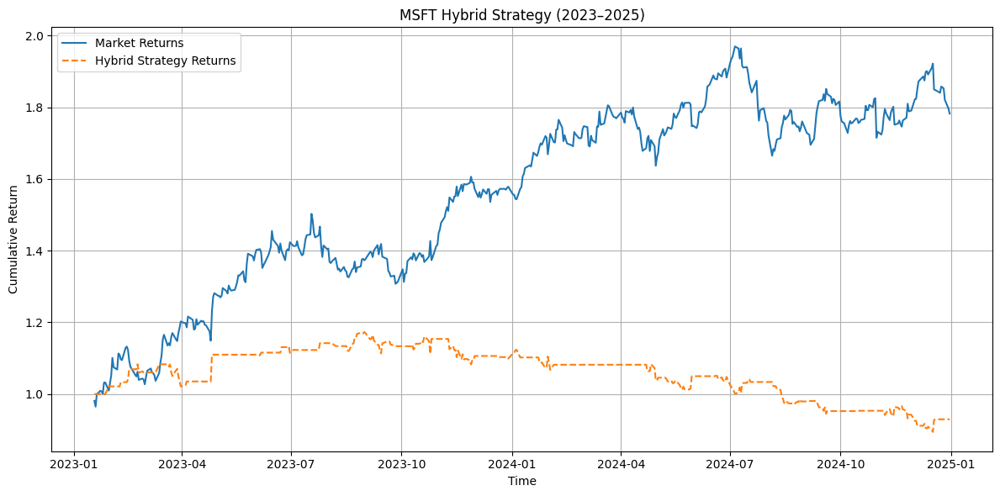

[*********************100%***********************]  1 of 1 completed


📊 Running Hybrid Model for META...



<ipython-input-40-e0b0638e6828>:38: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-40-e0b0638e6828>:91: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


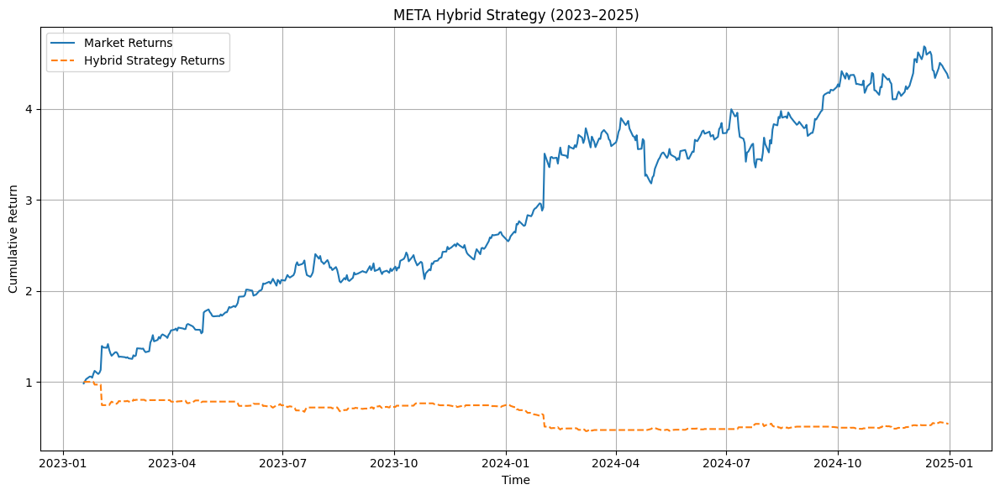

[*********************100%***********************]  1 of 1 completed


📊 Running Hybrid Model for NVDA...



<ipython-input-40-e0b0638e6828>:38: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-40-e0b0638e6828>:91: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


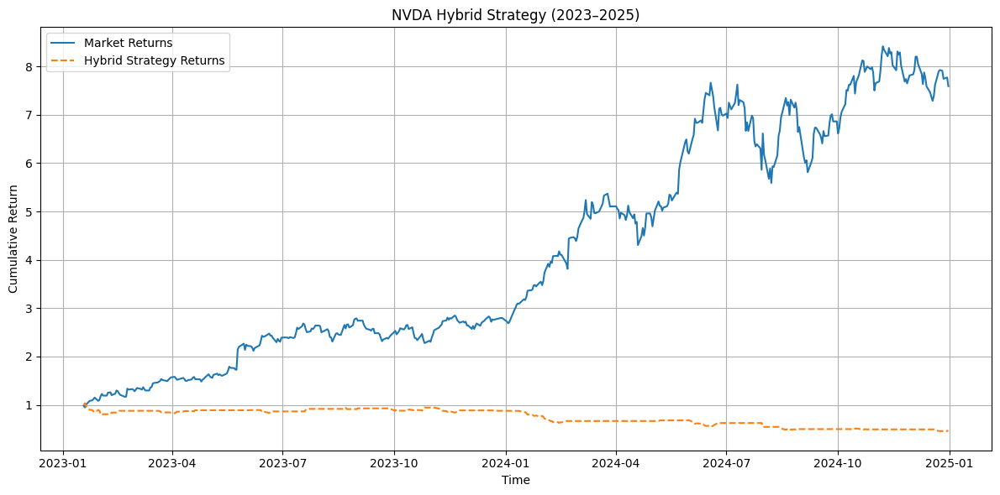

[*********************100%***********************]  1 of 1 completed


📊 Running Hybrid Model for ORCL...



<ipython-input-40-e0b0638e6828>:38: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-40-e0b0638e6828>:91: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


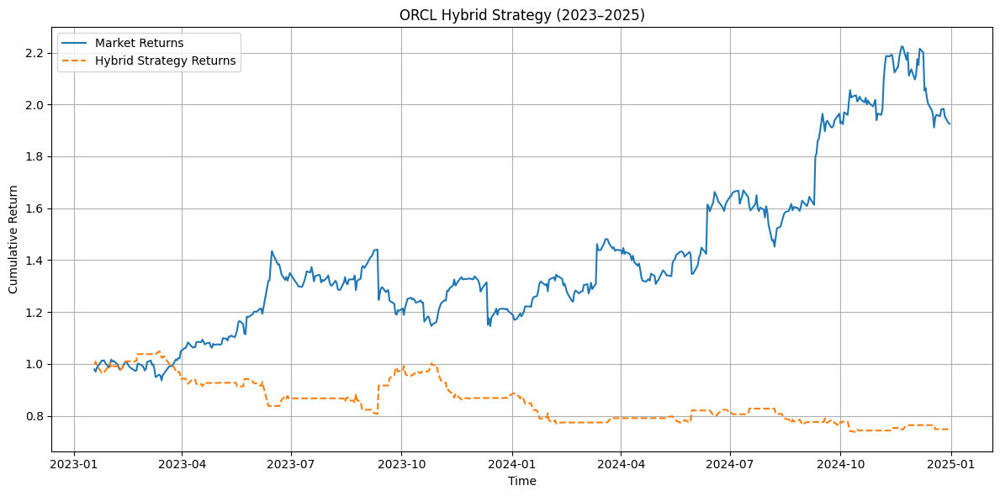


📊 Summary of Hybrid Backtest (2023–2025):
  Stock  Sharpe Ratio  Total Return (%)       Start         End
0  AAPL          0.17              2.88  2023-01-18  2024-12-31
1  GOOG          0.06             -1.85  2023-01-18  2024-12-31
2  AMZN          1.20             59.48  2023-01-18  2024-12-31
3  MSFT         -0.23             -7.04  2023-01-18  2024-12-31
4  META         -0.93            -46.32  2023-01-18  2024-12-31
5  NVDA         -1.48            -52.99  2023-01-18  2024-12-31
6  ORCL         -0.76            -25.19  2023-01-18  2024-12-31


In [ ]:
######## hybrid

# Create DataFrames
pred_df = pd.DataFrame(predictions_rescaled, columns=stocks, index=test_dates)
actual_df = pd.DataFrame(y_test_rescaled, columns=stocks, index=test_dates)

# Results container
hybrid_results = []

for stock in stocks:
    print(f"\n📊 Running Hybrid Model for {stock}...")

    # Download historical OHLCV data (needed for MDP indicators)
    df = yf.download(stock, start='2015-01-01', end='2025-01-01')

    # Clean columns
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [col[0] if isinstance(col, tuple) else col for col in df.columns]
    df.columns = [str(col).capitalize() for col in df.columns]

    # Add MDP indicators
    df["SMA_10"] = df["Close"].rolling(window=10).mean()
    df["SMA_50"] = df["Close"].rolling(window=50).mean()
    df["SMA_20"] = df["Close"].rolling(window=20).mean()
    df["STD_20"] = df["Close"].rolling(window=20).std()
    df["Bollinger_Upper"] = df["SMA_20"] + (2 * df["STD_20"])
    df["Bollinger_Lower"] = df["SMA_20"] - (2 * df["STD_20"])
    df["EMA_12"] = df["Close"].ewm(span=12, adjust=False).mean()
    df["EMA_26"] = df["Close"].ewm(span=26, adjust=False).mean()
    df["MACD"] = df["EMA_12"] - df["EMA_26"]
    df["Typical_Price"] = (df["High"] + df["Low"] + df["Close"]) / 3
    df["Raw_Money_Flow"] = df["Typical_Price"] * df["Volume"]
    df["Positive_MF"] = np.where(df["Typical_Price"] > df["Typical_Price"].shift(1), df["Raw_Money_Flow"], 0)
    df["Negative_MF"] = np.where(df["Typical_Price"] < df["Typical_Price"].shift(1), df["Raw_Money_Flow"], 0)
    df["Money_Flow_Ratio"] = df["Positive_MF"].rolling(window=14).sum() / df["Negative_MF"].rolling(window=14).sum()
    df["MFI"] = 100 - (100 / (1 + df["Money_Flow_Ratio"]))
    df["Daily_Return"] = df["Close"].pct_change().fillna(0)
    df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
    df.dropna(inplace=True)

    # MDP thresholds
    macd_threshold = df["MACD"].median()
    mfi_overbought = df["MFI"].quantile(0.75)
    mfi_oversold = df["MFI"].quantile(0.25)
    volatility_high = df["Volatility"].quantile(0.75)
    volatility_low = df["Volatility"].quantile(0.25)

    # MDP state detection
    def get_market_state(row):
        if (
            row["MACD"] > macd_threshold
            and row["Bollinger_Upper"] > row["Close"]
            and row["MFI"] > mfi_overbought
        ):
            return "Overbought"
        elif (
            row["MACD"] < macd_threshold
            and row["Bollinger_Lower"] < row["Close"]
            and row["MFI"] < mfi_oversold
        ):
            return "Oversold"
        elif row["SMA_10"] > row["SMA_50"] and row["Volatility"] < volatility_high:
            return "Uptrend"
        elif row["SMA_10"] < row["SMA_50"] and row["Volatility"] > volatility_low:
            return "Downtrend"
        else:
            return "Neutral"

    df["Market_State"] = df.apply(get_market_state, axis=1)

    # Align with test dates
    hybrid_df = df.loc[df.index.isin(test_dates)][["Close", "Daily_Return", "Market_State"]].copy()
    hybrid_df["Actual"] = actual_df[stock]
    hybrid_df["Predicted"] = pred_df[stock]

    # Hybrid Decision Rule
    def hybrid_decision(row):
        direction = "up" if row["Predicted"] > row["Actual"] else "down"
        state = row["Market_State"]
        if direction == "up" and state in ["Uptrend", "Oversold"]:
            return 1
        elif direction == "down" and state in ["Downtrend", "Overbought"]:
            return -1
        else:
            return 0

    hybrid_df["Position"] = hybrid_df.apply(hybrid_decision, axis=1)

    # Strategy return
    hybrid_df["Strategy_Return"] = hybrid_df["Position"].shift(1) * hybrid_df["Daily_Return"]
    hybrid_df["Strategy_Return"].fillna(0, inplace=True)
    hybrid_df["Cumulative_Market"] = (1 + hybrid_df["Daily_Return"]).cumprod()
    hybrid_df["Cumulative_Strategy"] = (1 + hybrid_df["Strategy_Return"]).cumprod()

    # Filter to last 2 years
    hybrid_df = hybrid_df[hybrid_df.index >= pd.Timestamp("2023-01-01")]
    sharpe = hybrid_df["Strategy_Return"].mean() / hybrid_df["Strategy_Return"].std()
    sharpe *= np.sqrt(252)
    total_return = hybrid_df["Cumulative_Strategy"].iloc[-1] - 1

    # Save results
    hybrid_results.append({
        "Stock": stock,
        "Sharpe Ratio": round(sharpe, 2),
        "Total Return (%)": round(total_return * 100, 2),
        "Start": hybrid_df.index[0].date(),
        "End": hybrid_df.index[-1].date()
    })

    # Plot
    plt.figure(figsize=(12,6))
    plt.plot(hybrid_df["Cumulative_Market"], label="Market Returns")
    plt.plot(hybrid_df["Cumulative_Strategy"], label="Hybrid Strategy Returns", linestyle="--")
    plt.title(f"{stock} Hybrid Strategy (2023–2025)")
    plt.xlabel("Time")
    plt.ylabel("Cumulative Return")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

# Final summary
hybrid_df_summary = pd.DataFrame(hybrid_results)
print("\n Summary of Hybrid Backtest (2023–2025):")
print(hybrid_df_summary)


Hybrid: LSTM +  Bayesian MDP attempt 2


🔁 Running Weighted Hybrid Model for AAPL...


[*********************100%***********************]  1 of 1 completed
<ipython-input-41-0e50128f1963>:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-41-0e50128f1963>:88: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


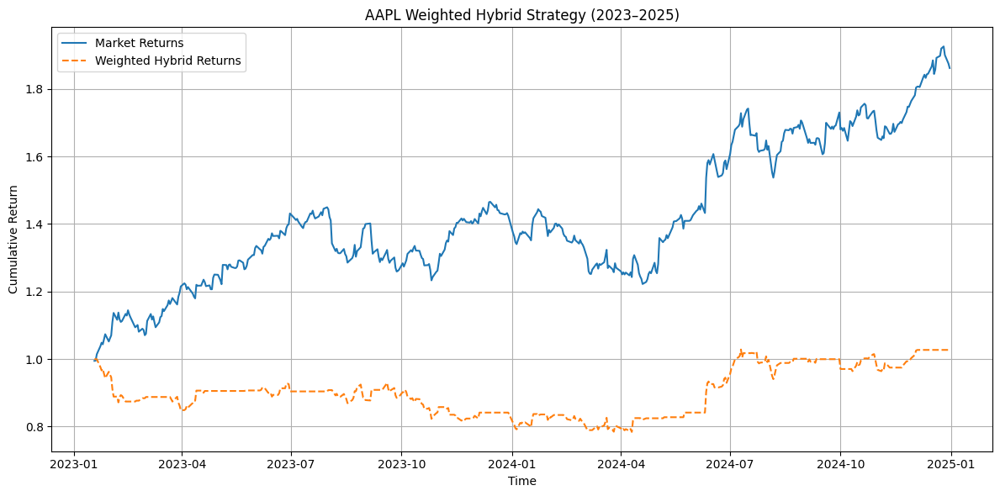

[*********************100%***********************]  1 of 1 completed


🔁 Running Weighted Hybrid Model for GOOG...



<ipython-input-41-0e50128f1963>:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-41-0e50128f1963>:88: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


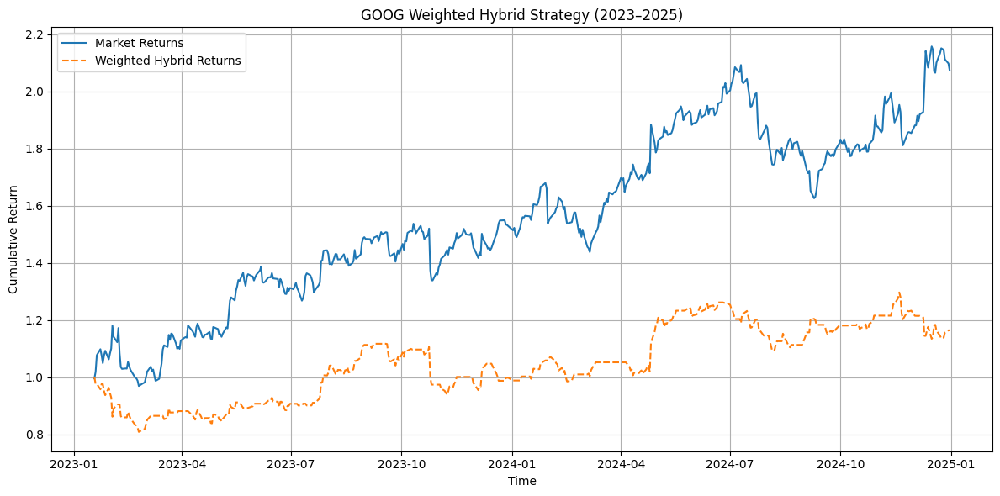

[*********************100%***********************]  1 of 1 completed


🔁 Running Weighted Hybrid Model for AMZN...



<ipython-input-41-0e50128f1963>:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-41-0e50128f1963>:88: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


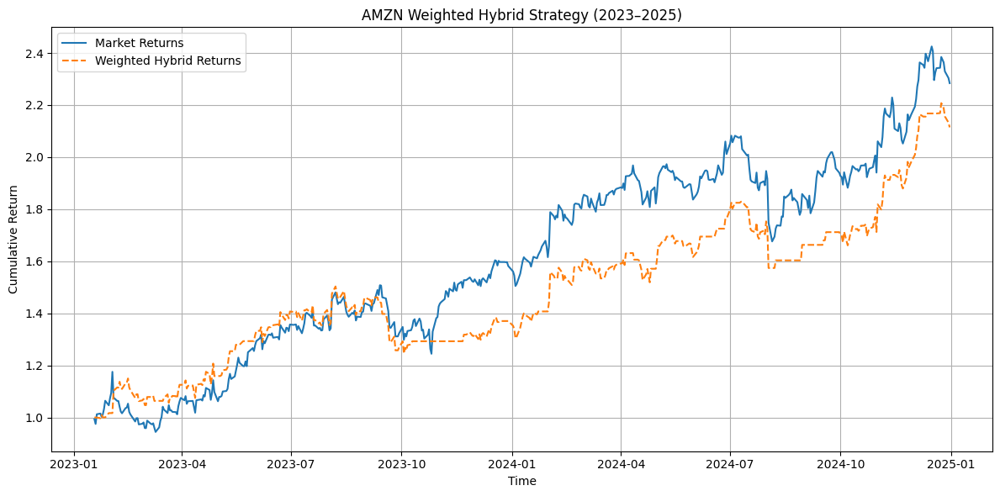

[*********************100%***********************]  1 of 1 completed


🔁 Running Weighted Hybrid Model for MSFT...



<ipython-input-41-0e50128f1963>:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-41-0e50128f1963>:88: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


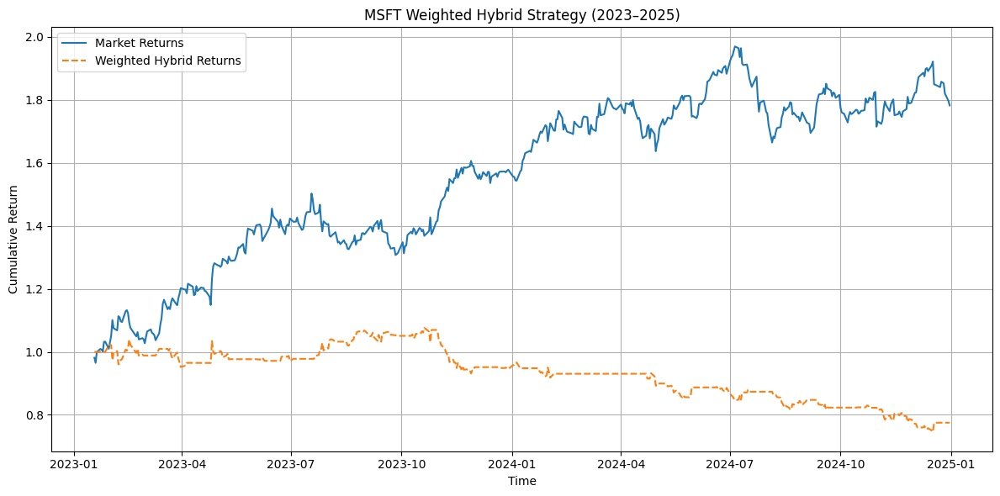

[*********************100%***********************]  1 of 1 completed


🔁 Running Weighted Hybrid Model for META...



<ipython-input-41-0e50128f1963>:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-41-0e50128f1963>:88: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


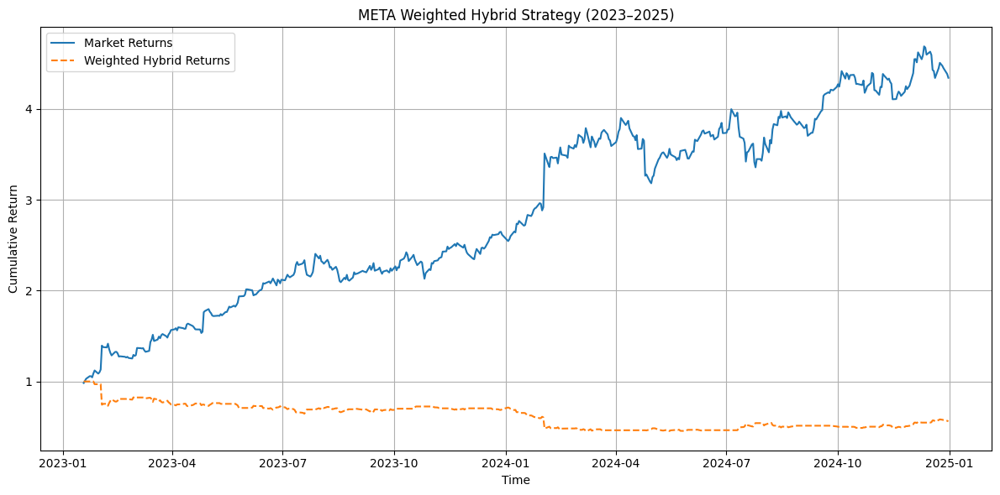

[*********************100%***********************]  1 of 1 completed


🔁 Running Weighted Hybrid Model for NVDA...



<ipython-input-41-0e50128f1963>:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-41-0e50128f1963>:88: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


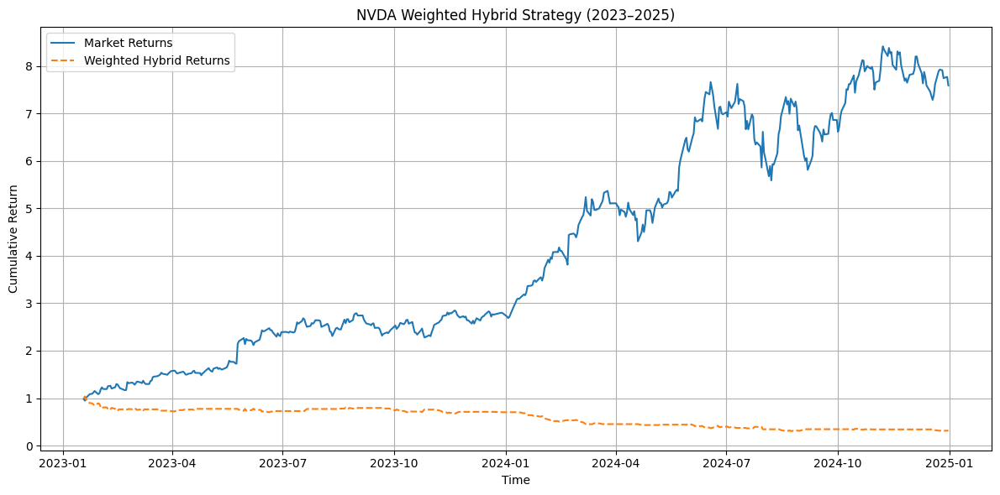

[*********************100%***********************]  1 of 1 completed


🔁 Running Weighted Hybrid Model for ORCL...



<ipython-input-41-0e50128f1963>:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-41-0e50128f1963>:88: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


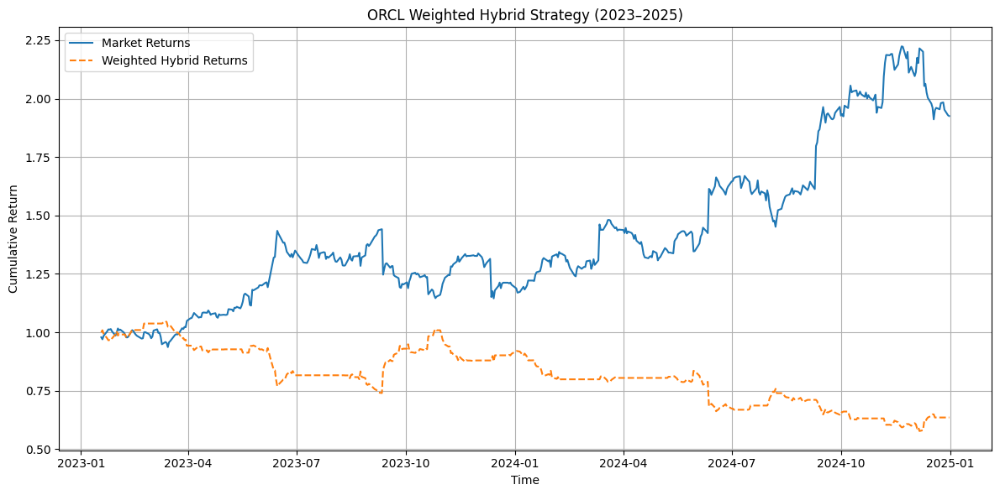


📊 Summary of Weighted Hybrid Backtest (2023–2025):
  Stock  Sharpe Ratio  Total Return (%)       Start         End
0  AAPL          0.16              2.70  2023-01-18  2024-12-31
1  GOOG          0.45             16.44  2023-01-18  2024-12-31
2  AMZN          1.68            111.45  2023-01-18  2024-12-31
3  MSFT         -0.78            -22.49  2023-01-18  2024-12-31
4  META         -0.78            -43.85  2023-01-18  2024-12-31
5  NVDA         -1.82            -67.98  2023-01-18  2024-12-31
6  ORCL         -0.87            -36.45  2023-01-18  2024-12-31


In [ ]:
#  Weighted Hybrid Model Backtest

# Assumes:
# - predictions_rescaled, y_test_rescaled, test_dates already defined
# - stocks list defined
# - stock_data = yf.download(...)["Close"] exists and matches test_dates

import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

pred_df = pd.DataFrame(predictions_rescaled, columns=stocks, index=test_dates)
actual_df = pd.DataFrame(y_test_rescaled, columns=stocks, index=test_dates)

hybrid_results_weighted = []

for stock in stocks:
    print(f"\n Running Weighted Hybrid Model for {stock}...")

    df = yf.download(stock, start='2015-01-01', end='2025-01-01')
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [col[0] if isinstance(col, tuple) else col for col in df.columns]
    df.columns = [str(col).capitalize() for col in df.columns]

    df["SMA_10"] = df["Close"].rolling(window=10).mean()
    df["SMA_50"] = df["Close"].rolling(window=50).mean()
    df["SMA_20"] = df["Close"].rolling(window=20).mean()
    df["STD_20"] = df["Close"].rolling(window=20).std()
    df["Bollinger_Upper"] = df["SMA_20"] + (2 * df["STD_20"])
    df["Bollinger_Lower"] = df["SMA_20"] - (2 * df["STD_20"])
    df["EMA_12"] = df["Close"].ewm(span=12, adjust=False).mean()
    df["EMA_26"] = df["Close"].ewm(span=26, adjust=False).mean()
    df["MACD"] = df["EMA_12"] - df["EMA_26"]
    df["Typical_Price"] = (df["High"] + df["Low"] + df["Close"]) / 3
    df["Raw_Money_Flow"] = df["Typical_Price"] * df["Volume"]
    df["Positive_MF"] = np.where(df["Typical_Price"] > df["Typical_Price"].shift(1), df["Raw_Money_Flow"], 0)
    df["Negative_MF"] = np.where(df["Typical_Price"] < df["Typical_Price"].shift(1), df["Raw_Money_Flow"], 0)
    df["Money_Flow_Ratio"] = df["Positive_MF"].rolling(window=14).sum() / df["Negative_MF"].rolling(window=14).sum()
    df["MFI"] = 100 - (100 / (1 + df["Money_Flow_Ratio"]))
    df["Daily_Return"] = df["Close"].pct_change().fillna(0)
    df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
    df.dropna(inplace=True)

    macd_threshold = df["MACD"].median()
    mfi_overbought = df["MFI"].quantile(0.75)
    mfi_oversold = df["MFI"].quantile(0.25)
    volatility_high = df["Volatility"].quantile(0.75)
    volatility_low = df["Volatility"].quantile(0.25)

    def get_market_state(row):
        if row["MACD"] > macd_threshold and row["Bollinger_Upper"] > row["Close"] and row["MFI"] > mfi_overbought:
            return "Overbought"
        elif row["MACD"] < macd_threshold and row["Bollinger_Lower"] < row["Close"] and row["MFI"] < mfi_oversold:
            return "Oversold"
        elif row["SMA_10"] > row["SMA_50"] and row["Volatility"] < volatility_high:
            return "Uptrend"
        elif row["SMA_10"] < row["SMA_50"] and row["Volatility"] > volatility_low:
            return "Downtrend"
        else:
            return "Neutral"

    df["Market_State"] = df.apply(get_market_state, axis=1)

    hybrid_df = df.loc[df.index.isin(test_dates)][["Close", "Daily_Return", "Market_State"]].copy()
    hybrid_df["Actual"] = actual_df[stock]
    hybrid_df["Predicted"] = pred_df[stock]

    def weighted_decision(row):
        score = 0
        if row["Predicted"] > row["Actual"]:
            score += 1
        else:
            score -= 1
        if row["Market_State"] in ["Uptrend", "Oversold"]:
            score += 0.5
        elif row["Market_State"] in ["Downtrend", "Overbought"]:
            score -= 0.5
        if score > 0.5:
            return 1
        elif score < -0.5:
            return -1
        else:
            return 0

    hybrid_df["Position"] = hybrid_df.apply(weighted_decision, axis=1)
    hybrid_df["Strategy_Return"] = hybrid_df["Position"].shift(1) * hybrid_df["Daily_Return"]
    hybrid_df["Strategy_Return"].fillna(0, inplace=True)
    hybrid_df["Cumulative_Market"] = (1 + hybrid_df["Daily_Return"]).cumprod()
    hybrid_df["Cumulative_Strategy"] = (1 + hybrid_df["Strategy_Return"]).cumprod()

    hybrid_df = hybrid_df[hybrid_df.index >= pd.Timestamp("2023-01-01")]
    sharpe = hybrid_df["Strategy_Return"].mean() / hybrid_df["Strategy_Return"].std()
    sharpe *= np.sqrt(252)
    total_return = hybrid_df["Cumulative_Strategy"].iloc[-1] - 1

    hybrid_results_weighted.append({
        "Stock": stock,
        "Sharpe Ratio": round(sharpe, 2),
        "Total Return (%)": round(total_return * 100, 2),
        "Start": hybrid_df.index[0].date(),
        "End": hybrid_df.index[-1].date()
    })

    plt.figure(figsize=(12,6))
    plt.plot(hybrid_df["Cumulative_Market"], label="Market Returns")
    plt.plot(hybrid_df["Cumulative_Strategy"], label="Weighted Hybrid Returns", linestyle="--")
    plt.title(f"{stock} Weighted Hybrid Strategy (2023–2025)")
    plt.xlabel("Time")
    plt.ylabel("Cumulative Return")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

summary_df = pd.DataFrame(hybrid_results_weighted)
print("\n Summary of Weighted Hybrid Backtest (2023–2025):")
print(summary_df)


Hybrid: LSTM +  Bayesian MDP attempt 3

[*********************100%***********************]  1 of 1 completed


🔁 Running LSTM-Leaning Hybrid Model for AAPL...



<ipython-input-42-83ee82d0e8e3>:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-42-83ee82d0e8e3>:80: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


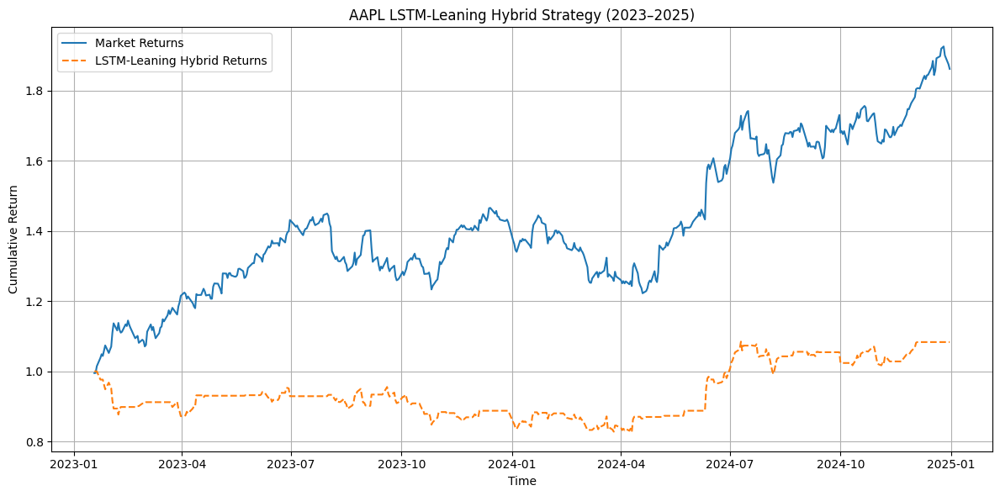

[*********************100%***********************]  1 of 1 completed


🔁 Running LSTM-Leaning Hybrid Model for GOOG...



<ipython-input-42-83ee82d0e8e3>:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-42-83ee82d0e8e3>:80: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


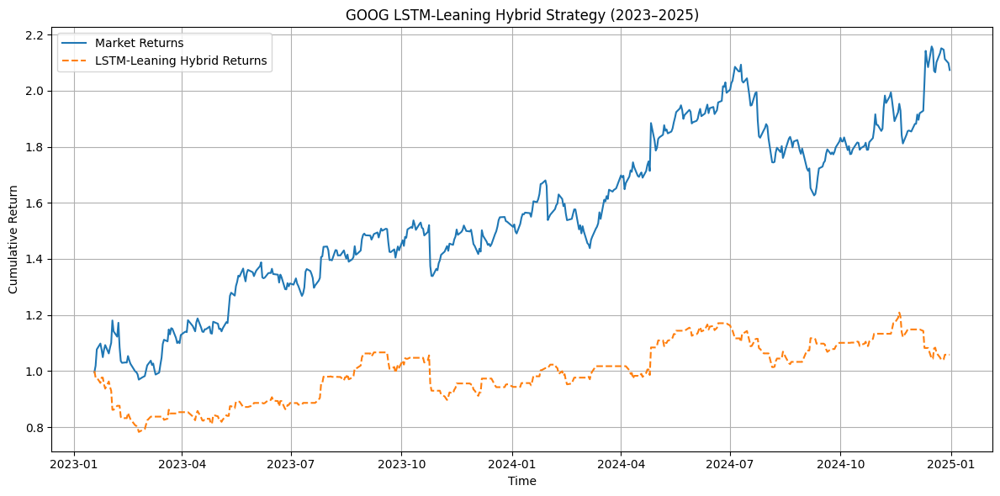

[*********************100%***********************]  1 of 1 completed


🔁 Running LSTM-Leaning Hybrid Model for AMZN...



<ipython-input-42-83ee82d0e8e3>:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-42-83ee82d0e8e3>:80: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


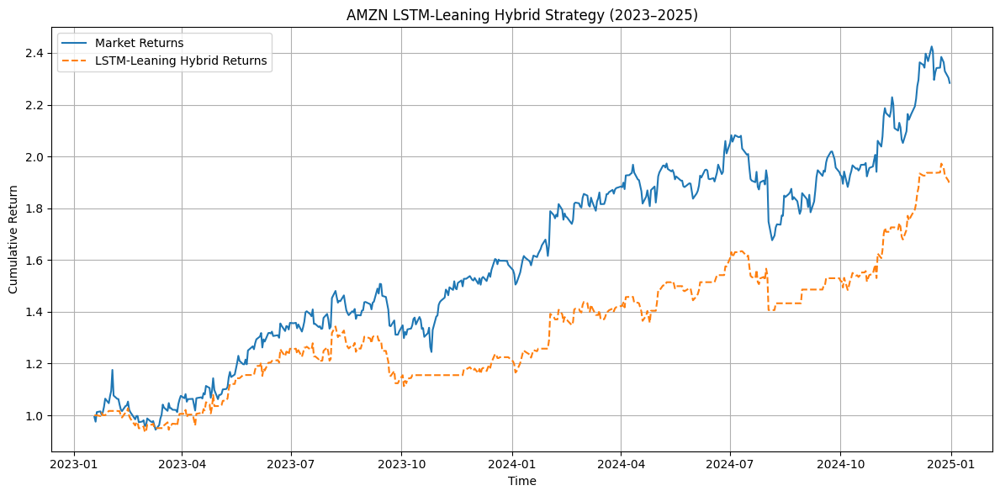

[*********************100%***********************]  1 of 1 completed


🔁 Running LSTM-Leaning Hybrid Model for MSFT...



<ipython-input-42-83ee82d0e8e3>:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-42-83ee82d0e8e3>:80: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


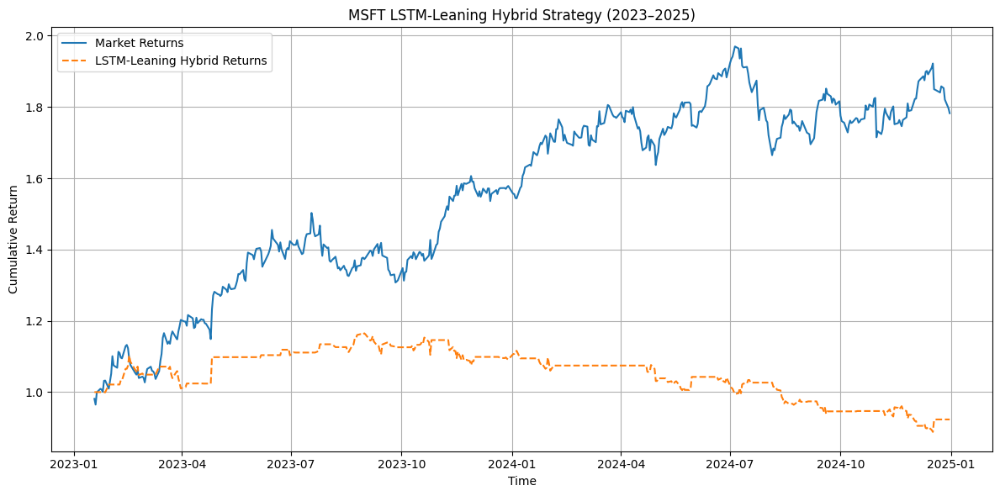

[*********************100%***********************]  1 of 1 completed


🔁 Running LSTM-Leaning Hybrid Model for META...



<ipython-input-42-83ee82d0e8e3>:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-42-83ee82d0e8e3>:80: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


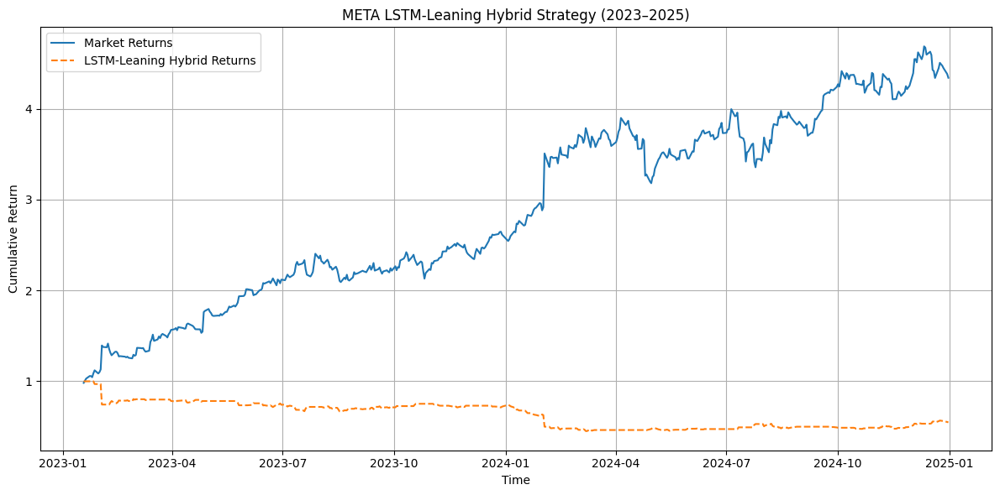

[*********************100%***********************]  1 of 1 completed


🔁 Running LSTM-Leaning Hybrid Model for NVDA...



<ipython-input-42-83ee82d0e8e3>:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-42-83ee82d0e8e3>:80: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


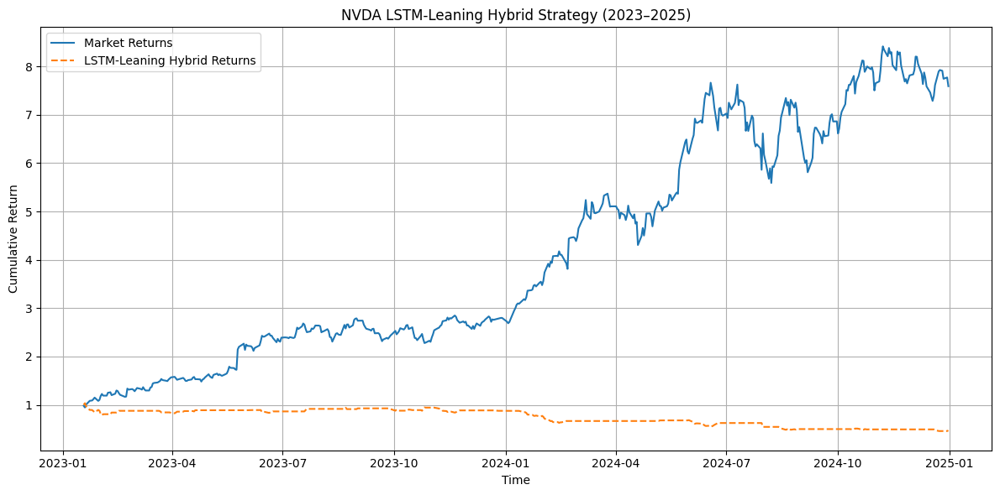

[*********************100%***********************]  1 of 1 completed


🔁 Running LSTM-Leaning Hybrid Model for ORCL...



<ipython-input-42-83ee82d0e8e3>:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-42-83ee82d0e8e3>:80: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


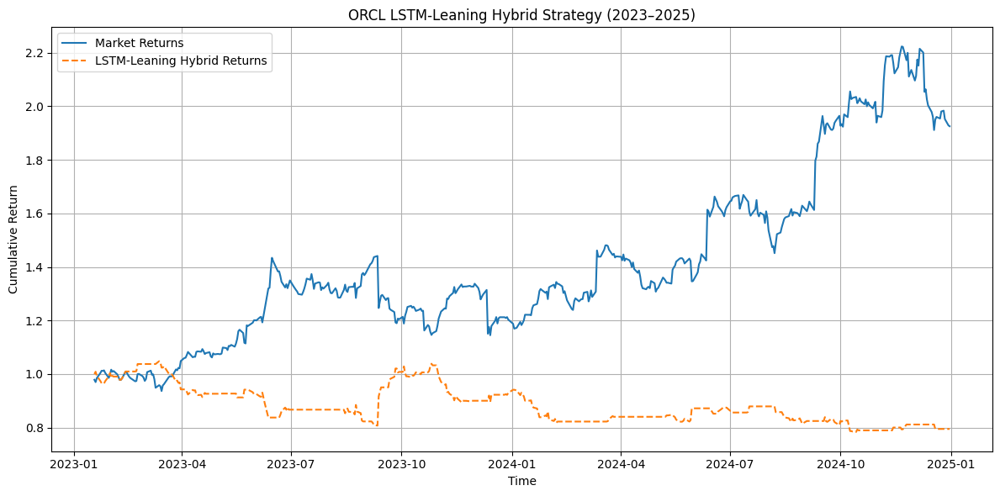


📊 Summary of LSTM-Leaning Hybrid Backtest (2023–2025):
  Stock  Sharpe Ratio  Total Return (%)       Start         End
0  AAPL          0.34              8.30  2023-01-18  2024-12-31
1  GOOG          0.24              5.83  2023-01-18  2024-12-31
2  AMZN          1.49             88.94  2023-01-18  2024-12-31
3  MSFT         -0.24             -7.67  2023-01-18  2024-12-31
4  META         -0.89            -45.27  2023-01-18  2024-12-31
5  NVDA         -1.48            -52.99  2023-01-18  2024-12-31
6  ORCL         -0.57            -20.50  2023-01-18  2024-12-31


In [ ]:
#  LSTM-Leaning Hybrid Model Backtest

# Assumes:
# - predictions_rescaled, y_test_rescaled, test_dates already defined
# - stocks list defined
# - stock_data = yf.download(...)["Close"] exists and matches test_dates

import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

pred_df = pd.DataFrame(predictions_rescaled, columns=stocks, index=test_dates)
actual_df = pd.DataFrame(y_test_rescaled, columns=stocks, index=test_dates)

hybrid_results_lstm_leaning = []

for stock in stocks:
    print(f"\n🔁 Running LSTM-Leaning Hybrid Model for {stock}...")

    df = yf.download(stock, start='2015-01-01', end='2025-01-01')
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [col[0] if isinstance(col, tuple) else col for col in df.columns]
    df.columns = [str(col).capitalize() for col in df.columns]

    df["SMA_10"] = df["Close"].rolling(window=10).mean()
    df["SMA_50"] = df["Close"].rolling(window=50).mean()
    df["SMA_20"] = df["Close"].rolling(window=20).mean()
    df["STD_20"] = df["Close"].rolling(window=20).std()
    df["Bollinger_Upper"] = df["SMA_20"] + (2 * df["STD_20"])
    df["Bollinger_Lower"] = df["SMA_20"] - (2 * df["STD_20"])
    df["EMA_12"] = df["Close"].ewm(span=12, adjust=False).mean()
    df["EMA_26"] = df["Close"].ewm(span=26, adjust=False).mean()
    df["MACD"] = df["EMA_12"] - df["EMA_26"]
    df["Typical_Price"] = (df["High"] + df["Low"] + df["Close"]) / 3
    df["Raw_Money_Flow"] = df["Typical_Price"] * df["Volume"]
    df["Positive_MF"] = np.where(df["Typical_Price"] > df["Typical_Price"].shift(1), df["Raw_Money_Flow"], 0)
    df["Negative_MF"] = np.where(df["Typical_Price"] < df["Typical_Price"].shift(1), df["Raw_Money_Flow"], 0)
    df["Money_Flow_Ratio"] = df["Positive_MF"].rolling(window=14).sum() / df["Negative_MF"].rolling(window=14).sum()
    df["MFI"] = 100 - (100 / (1 + df["Money_Flow_Ratio"]))
    df["Daily_Return"] = df["Close"].pct_change().fillna(0)
    df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
    df.dropna(inplace=True)

    macd_threshold = df["MACD"].median()
    mfi_overbought = df["MFI"].quantile(0.75)
    mfi_oversold = df["MFI"].quantile(0.25)
    volatility_high = df["Volatility"].quantile(0.75)
    volatility_low = df["Volatility"].quantile(0.25)

    def get_market_state(row):
        if row["MACD"] > macd_threshold and row["Bollinger_Upper"] > row["Close"] and row["MFI"] > mfi_overbought:
            return "Overbought"
        elif row["MACD"] < macd_threshold and row["Bollinger_Lower"] < row["Close"] and row["MFI"] < mfi_oversold:
            return "Oversold"
        elif row["SMA_10"] > row["SMA_50"] and row["Volatility"] < volatility_high:
            return "Uptrend"
        elif row["SMA_10"] < row["SMA_50"] and row["Volatility"] > volatility_low:
            return "Downtrend"
        else:
            return "Neutral"

    df["Market_State"] = df.apply(get_market_state, axis=1)

    hybrid_df = df.loc[df.index.isin(test_dates)][["Close", "Daily_Return", "Market_State"]].copy()
    hybrid_df["Actual"] = actual_df[stock]
    hybrid_df["Predicted"] = pred_df[stock]

    def lstm_leaning_decision(row):
        if row["Predicted"] > row["Actual"]:
            if row["Market_State"] not in ["Downtrend", "Overbought"]:
                return 1
        elif row["Predicted"] < row["Actual"]:
            if row["Market_State"] in ["Downtrend", "Overbought"]:
                return -1
        return 0

    hybrid_df["Position"] = hybrid_df.apply(lstm_leaning_decision, axis=1)
    hybrid_df["Strategy_Return"] = hybrid_df["Position"].shift(1) * hybrid_df["Daily_Return"]
    hybrid_df["Strategy_Return"].fillna(0, inplace=True)
    hybrid_df["Cumulative_Market"] = (1 + hybrid_df["Daily_Return"]).cumprod()
    hybrid_df["Cumulative_Strategy"] = (1 + hybrid_df["Strategy_Return"]).cumprod()

    hybrid_df = hybrid_df[hybrid_df.index >= pd.Timestamp("2023-01-01")]
    sharpe = hybrid_df["Strategy_Return"].mean() / hybrid_df["Strategy_Return"].std()
    sharpe *= np.sqrt(252)
    total_return = hybrid_df["Cumulative_Strategy"].iloc[-1] - 1

    hybrid_results_lstm_leaning.append({
        "Stock": stock,
        "Sharpe Ratio": round(sharpe, 2),
        "Total Return (%)": round(total_return * 100, 2),
        "Start": hybrid_df.index[0].date(),
        "End": hybrid_df.index[-1].date()
    })

    plt.figure(figsize=(12,6))
    plt.plot(hybrid_df["Cumulative_Market"], label="Market Returns")
    plt.plot(hybrid_df["Cumulative_Strategy"], label="LSTM-Leaning Hybrid Returns", linestyle="--")
    plt.title(f"{stock} LSTM-Leaning Hybrid Strategy (2023–2025)")
    plt.xlabel("Time")
    plt.ylabel("Cumulative Return")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

summary_df = pd.DataFrame(hybrid_results_lstm_leaning)
print("\n Summary of LSTM-Leaning Hybrid Backtest (2023–2025):")
print(summary_df)

Hybrid: LSTM +  Bayesian MDP attempt 4

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for AAPL...



<ipython-input-43-3e8076efeb0b>:54: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-43-3e8076efeb0b>:93: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


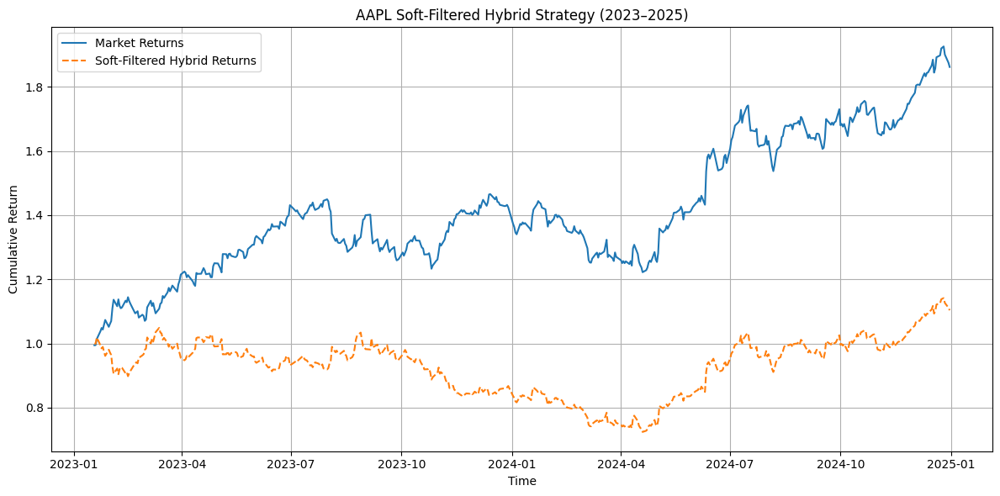

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for GOOG...



<ipython-input-43-3e8076efeb0b>:54: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-43-3e8076efeb0b>:93: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


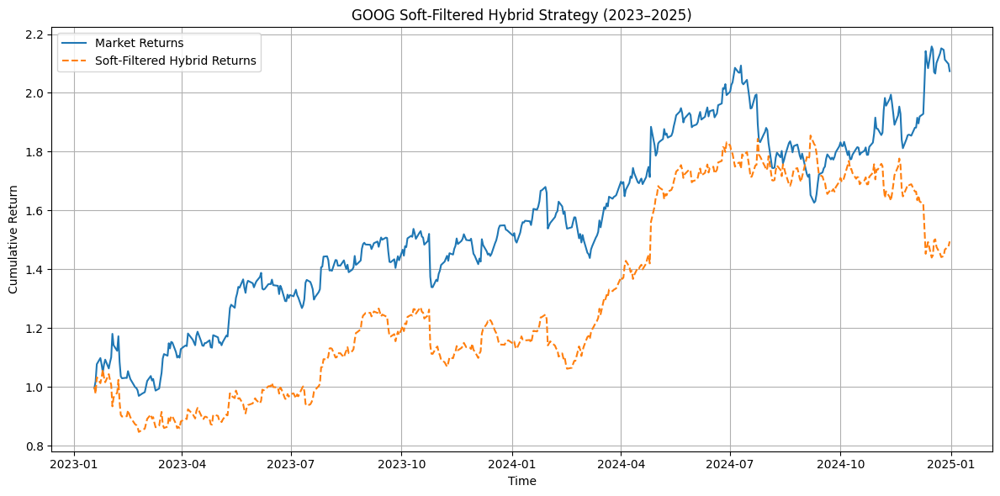

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for AMZN...



<ipython-input-43-3e8076efeb0b>:54: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-43-3e8076efeb0b>:93: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


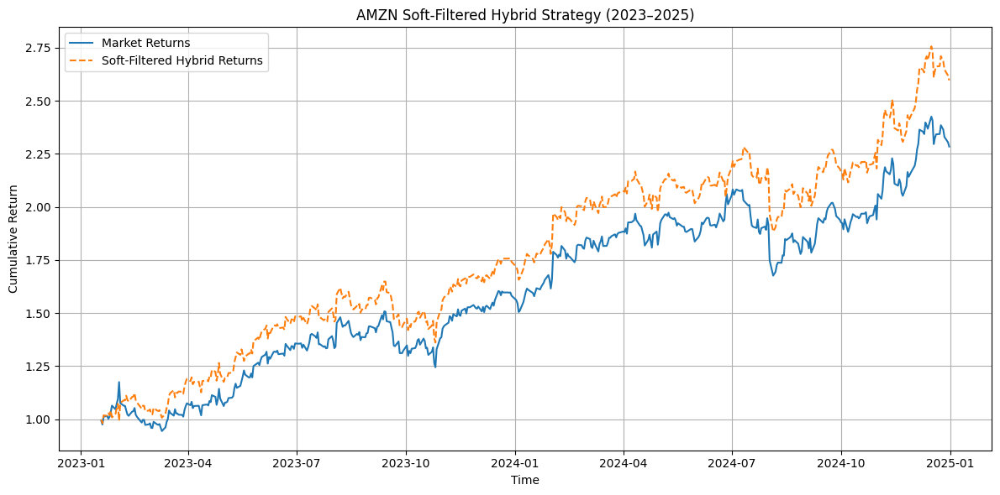

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for MSFT...



<ipython-input-43-3e8076efeb0b>:54: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-43-3e8076efeb0b>:93: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


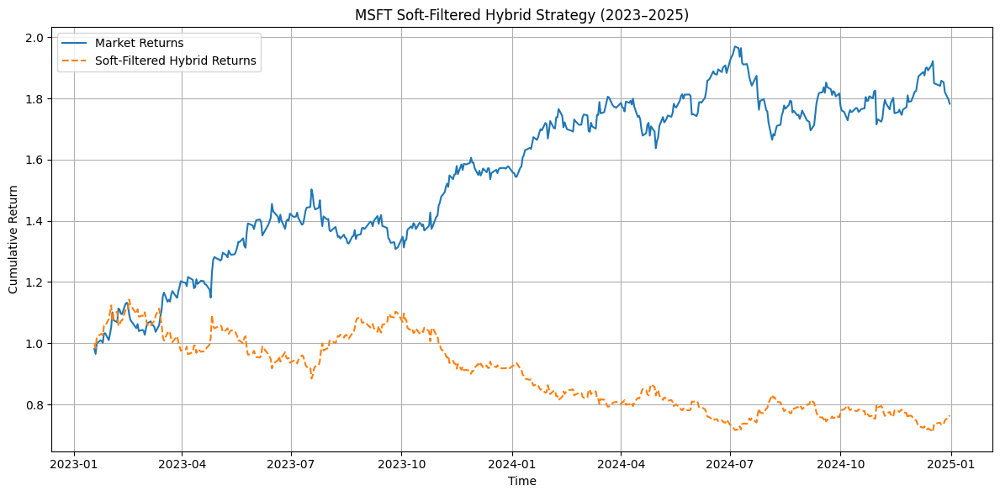

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for META...



<ipython-input-43-3e8076efeb0b>:54: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-43-3e8076efeb0b>:93: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


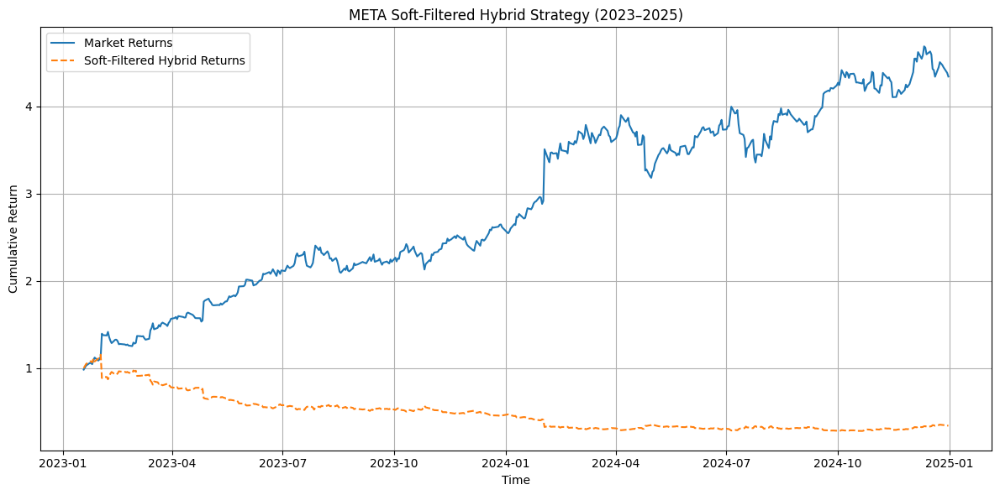

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for NVDA...



<ipython-input-43-3e8076efeb0b>:54: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-43-3e8076efeb0b>:93: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


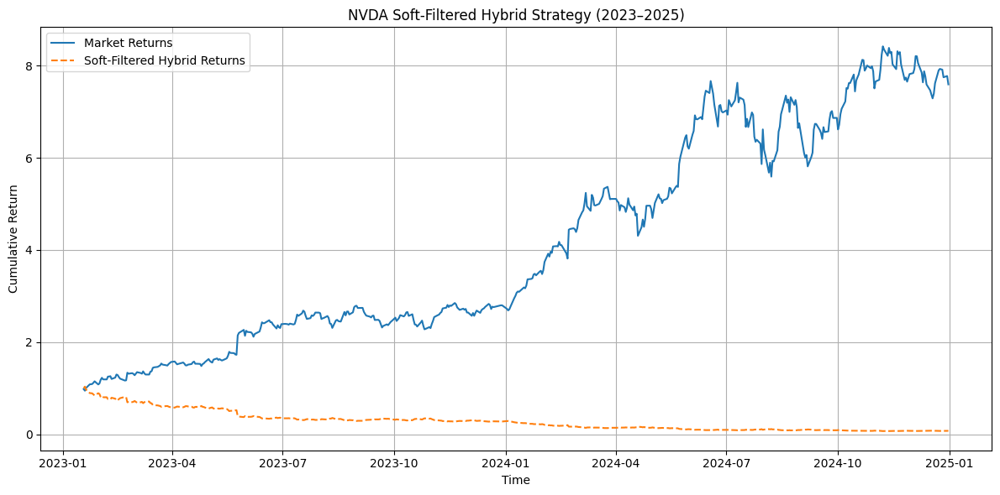

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for ORCL...



<ipython-input-43-3e8076efeb0b>:54: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-43-3e8076efeb0b>:93: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


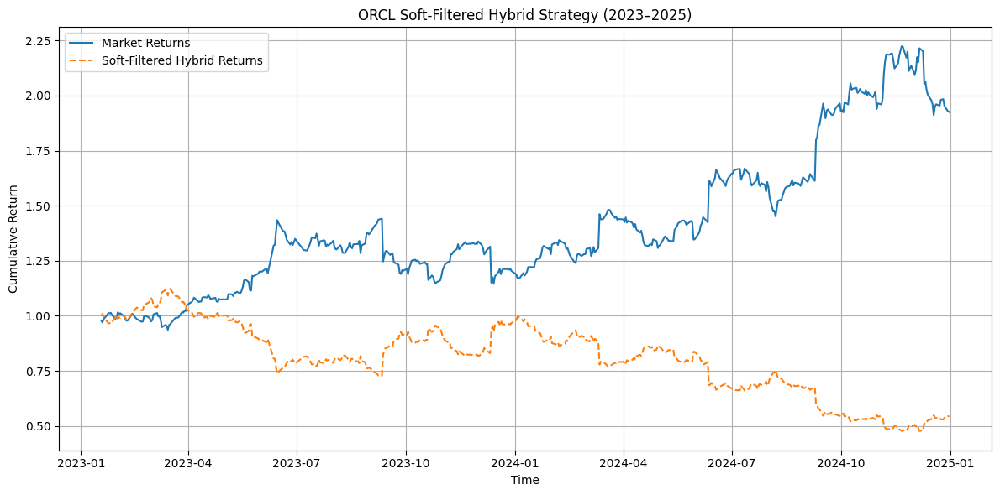


📊 Summary of Soft-Filtered Hybrid Backtest (2023–2025):
  Stock  Sharpe Ratio  Total Return (%)       Start         End
0  AAPL          0.34             10.37  2023-01-18  2024-12-31
1  GOOG          0.85             49.47  2023-01-18  2024-12-31
2  AMZN          1.77            159.57  2023-01-18  2024-12-31
3  MSFT         -0.50            -23.62  2023-01-18  2024-12-31
4  META         -1.23            -66.09  2023-01-18  2024-12-31
5  NVDA         -2.33            -92.24  2023-01-18  2024-12-31
6  ORCL         -0.83            -45.54  2023-01-18  2024-12-31


In [ ]:
#  Soft-Filtered Hybrid Model Backtest

# Assumes:
#   predictions_rescaled, y_test_rescaled, test_dates already defined
#  stocks list defined
#  stock_data = yf.download(...)['Close'] exists and matches test_dates

import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

pred_df = pd.DataFrame(predictions_rescaled, columns=stocks, index=test_dates)
actual_df = pd.DataFrame(y_test_rescaled, columns=stocks, index=test_dates)

hybrid_results_soft_filter = []

# MDP weight map
mdp_state_weight = {
    "Overbought": -1,
    "Oversold": 1,
    "Uptrend": 0.5,
    "Downtrend": -0.5,
    "Neutral": 0
}

alpha = 0.7  # LSTM emphasis
threshold = 0.005

for stock in stocks:
    print(f"\n Running Soft-Filtered Hybrid Model for {stock}...")

    df = yf.download(stock, start='2015-01-01', end='2025-01-01')
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [col[0] if isinstance(col, tuple) else col for col in df.columns]
    df.columns = [str(col).capitalize() for col in df.columns]

    df["SMA_10"] = df["Close"].rolling(window=10).mean()
    df["SMA_50"] = df["Close"].rolling(window=50).mean()
    df["SMA_20"] = df["Close"].rolling(window=20).mean()
    df["STD_20"] = df["Close"].rolling(window=20).std()
    df["Bollinger_Upper"] = df["SMA_20"] + (2 * df["STD_20"])
    df["Bollinger_Lower"] = df["SMA_20"] - (2 * df["STD_20"])
    df["EMA_12"] = df["Close"].ewm(span=12, adjust=False).mean()
    df["EMA_26"] = df["Close"].ewm(span=26, adjust=False).mean()
    df["MACD"] = df["EMA_12"] - df["EMA_26"]
    df["Typical_Price"] = (df["High"] + df["Low"] + df["Close"]) / 3
    df["Raw_Money_Flow"] = df["Typical_Price"] * df["Volume"]
    df["Positive_MF"] = np.where(df["Typical_Price"] > df["Typical_Price"].shift(1), df["Raw_Money_Flow"], 0)
    df["Negative_MF"] = np.where(df["Typical_Price"] < df["Typical_Price"].shift(1), df["Raw_Money_Flow"], 0)
    df["Money_Flow_Ratio"] = df["Positive_MF"].rolling(window=14).sum() / df["Negative_MF"].rolling(window=14).sum()
    df["MFI"] = 100 - (100 / (1 + df["Money_Flow_Ratio"]))
    df["Daily_Return"] = df["Close"].pct_change().fillna(0)
    df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
    df.dropna(inplace=True)

    macd_threshold = df["MACD"].median()
    mfi_overbought = df["MFI"].quantile(0.75)
    mfi_oversold = df["MFI"].quantile(0.25)
    volatility_high = df["Volatility"].quantile(0.75)
    volatility_low = df["Volatility"].quantile(0.25)

    def get_market_state(row):
        if row["MACD"] > macd_threshold and row["Bollinger_Upper"] > row["Close"] and row["MFI"] > mfi_overbought:
            return "Overbought"
        elif row["MACD"] < macd_threshold and row["Bollinger_Lower"] < row["Close"] and row["MFI"] < mfi_oversold:
            return "Oversold"
        elif row["SMA_10"] > row["SMA_50"] and row["Volatility"] < volatility_high:
            return "Uptrend"
        elif row["SMA_10"] < row["SMA_50"] and row["Volatility"] > volatility_low:
            return "Downtrend"
        else:
            return "Neutral"

    df["Market_State"] = df.apply(get_market_state, axis=1)

    hybrid_df = df.loc[df.index.isin(test_dates)][["Close", "Daily_Return", "Market_State"]].copy()
    hybrid_df["Actual"] = actual_df[stock]
    hybrid_df["Predicted"] = pred_df[stock]

    def soft_filtered_position(row):
        lstm_score = row["Predicted"] - row["Actual"]
        mdp_adjust = mdp_state_weight.get(row["Market_State"], 0)
        score = lstm_score + alpha * mdp_adjust
        if score > threshold:
            return 1
        elif score < -threshold:
            return -1
        return 0

    hybrid_df["Position"] = hybrid_df.apply(soft_filtered_position, axis=1)
    hybrid_df["Strategy_Return"] = hybrid_df["Position"].shift(1) * hybrid_df["Daily_Return"]
    hybrid_df["Strategy_Return"].fillna(0, inplace=True)
    hybrid_df["Cumulative_Market"] = (1 + hybrid_df["Daily_Return"]).cumprod()
    hybrid_df["Cumulative_Strategy"] = (1 + hybrid_df["Strategy_Return"]).cumprod()

    hybrid_df = hybrid_df[hybrid_df.index >= pd.Timestamp("2023-01-01")]
    sharpe = hybrid_df["Strategy_Return"].mean() / hybrid_df["Strategy_Return"].std()
    sharpe *= np.sqrt(252)
    total_return = hybrid_df["Cumulative_Strategy"].iloc[-1] - 1

    hybrid_results_soft_filter.append({
        "Stock": stock,
        "Sharpe Ratio": round(sharpe, 2),
        "Total Return (%)": round(total_return * 100, 2),
        "Start": hybrid_df.index[0].date(),
        "End": hybrid_df.index[-1].date()
    })

    plt.figure(figsize=(12,6))
    plt.plot(hybrid_df["Cumulative_Market"], label="Market Returns")
    plt.plot(hybrid_df["Cumulative_Strategy"], label="Soft-Filtered Hybrid Returns", linestyle="--")
    plt.title(f"{stock} Soft-Filtered Hybrid Strategy (2023–2025)")
    plt.xlabel("Time")
    plt.ylabel("Cumulative Return")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

summary_df = pd.DataFrame(hybrid_results_soft_filter)
print("\n Summary of Soft-Filtered Hybrid Backtest (2023–2025):")
print(summary_df)


Hybrid: LSTM +  Bayesian MDP attempt 5

In [ ]:
# 1) Create empty lists *before* the loop
all_market_returns = []
all_strategy_returns = []

# 2) Inside your loop over stocks, after you build hybrid_df:
for stock in stocks:
    ...
    # Filter to the evaluation period
    df_eval = hybrid_df[hybrid_df.index >= pd.Timestamp("2023-01-01")].copy()

    # ADD THESE LINES so that you actually save daily returns
    all_market_returns.append(df_eval["Daily_Return"])
    all_strategy_returns.append(df_eval["Strategy_Return"])

    # Then do your per-stock plots, etc.
    ...


[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for AAPL...



<ipython-input-44-c70beffd9b43>:37: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-44-c70beffd9b43>:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


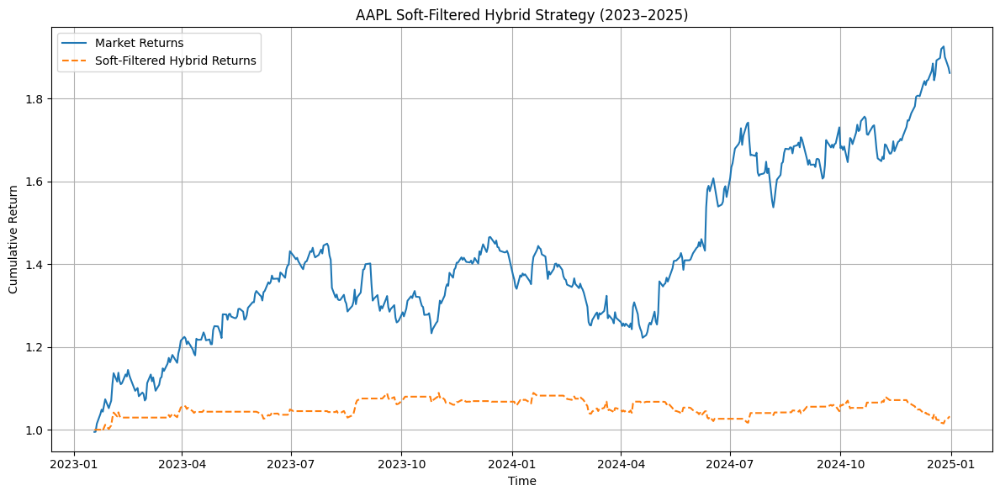

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for GOOG...



<ipython-input-44-c70beffd9b43>:37: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-44-c70beffd9b43>:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


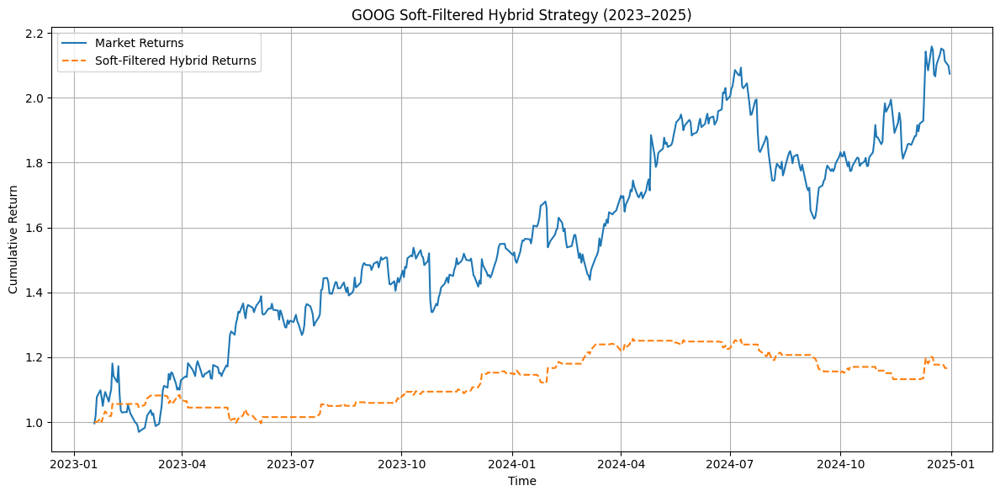

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for AMZN...



<ipython-input-44-c70beffd9b43>:37: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-44-c70beffd9b43>:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


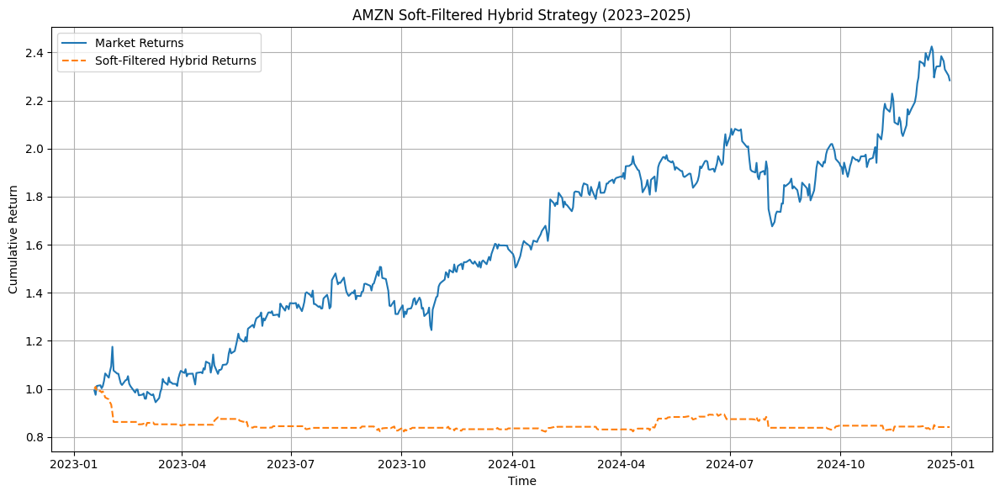

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for MSFT...



<ipython-input-44-c70beffd9b43>:37: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-44-c70beffd9b43>:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


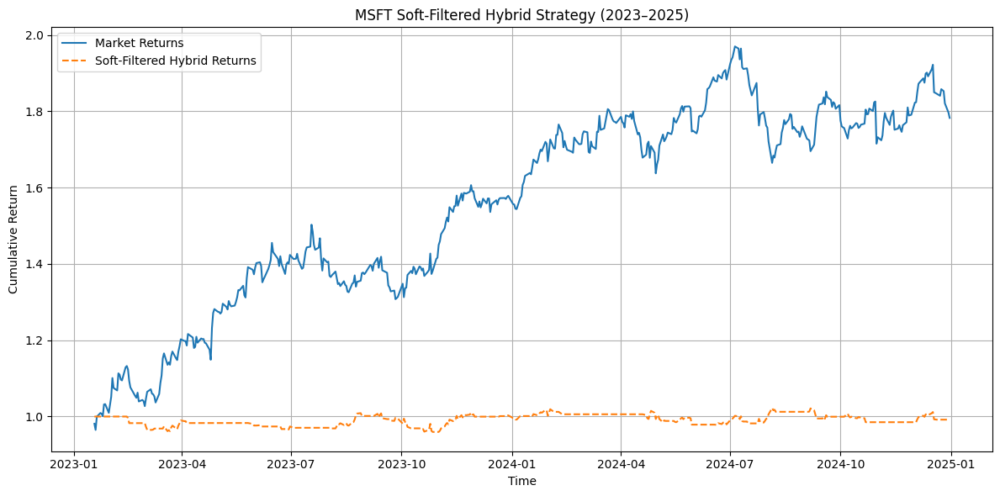

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for META...



<ipython-input-44-c70beffd9b43>:37: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-44-c70beffd9b43>:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


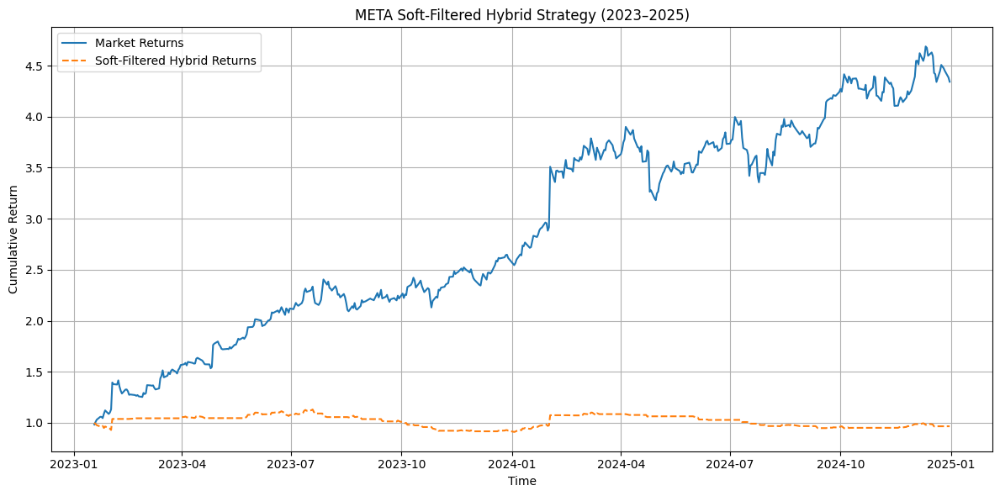

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for NVDA...



<ipython-input-44-c70beffd9b43>:37: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-44-c70beffd9b43>:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


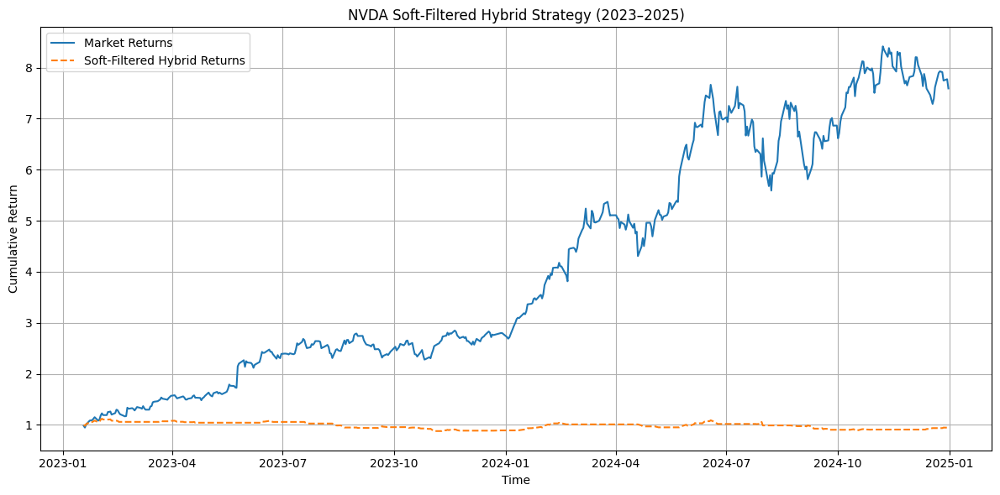

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for ORCL...



<ipython-input-44-c70beffd9b43>:37: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-44-c70beffd9b43>:68: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_Return"].fillna(0, inplace=True)


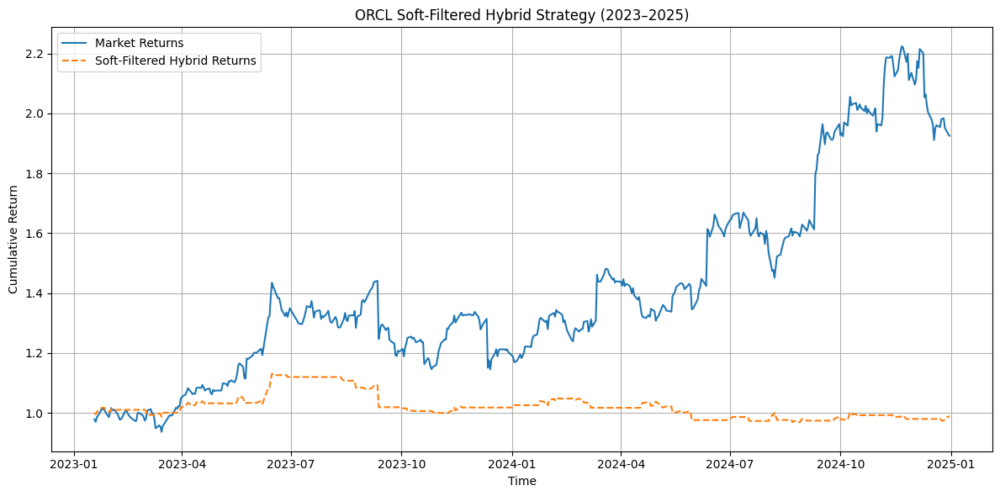


📊 Summary of Soft-Filtered Hybrid Backtest (2023–2025):
  Stock  Sharpe Ratio  Total Return (%)       Start         End
0  AAPL          0.27              3.24  2023-01-18  2024-12-31
1  GOOG          0.90             16.65  2023-01-18  2024-12-31
2  AMZN         -0.92            -15.86  2023-01-18  2024-12-31
3  MSFT         -0.03             -0.81  2023-01-18  2024-12-31
4  META         -0.06             -3.45  2023-01-18  2024-12-31
5  NVDA         -0.14             -5.52  2023-01-18  2024-12-31
6  ORCL         -0.03             -1.15  2023-01-18  2024-12-31


In [ ]:
# Soft-Filtered Hybrid Model Backtest with Volatility Gating and Confidence Capping

import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

pred_df = pd.DataFrame(predictions_rescaled, columns=stocks, index=test_dates)
actual_df = pd.DataFrame(y_test_rescaled, columns=stocks, index=test_dates)

hybrid_results_soft_filtered = []

for stock in stocks:
    print(f"\n Running Soft-Filtered Hybrid Model for {stock}...")

    df = yf.download(stock, start='2015-01-01', end='2025-01-01')
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [col[0] if isinstance(col, tuple) else col for col in df.columns]
    df.columns = [str(col).capitalize() for col in df.columns]

    df["SMA_10"] = df["Close"].rolling(window=10).mean()
    df["SMA_50"] = df["Close"].rolling(window=50).mean()
    df["SMA_20"] = df["Close"].rolling(window=20).mean()
    df["STD_20"] = df["Close"].rolling(window=20).std()
    df["Bollinger_Upper"] = df["SMA_20"] + (2 * df["STD_20"])
    df["Bollinger_Lower"] = df["SMA_20"] - (2 * df["STD_20"])
    df["EMA_12"] = df["Close"].ewm(span=12, adjust=False).mean()
    df["EMA_26"] = df["Close"].ewm(span=26, adjust=False).mean()
    df["MACD"] = df["EMA_12"] - df["EMA_26"]
    df["Typical_Price"] = (df["High"] + df["Low"] + df["Close"]) / 3
    df["Raw_Money_Flow"] = df["Typical_Price"] * df["Volume"]
    df["Positive_MF"] = np.where(df["Typical_Price"] > df["Typical_Price"].shift(1), df["Raw_Money_Flow"], 0)
    df["Negative_MF"] = np.where(df["Typical_Price"] < df["Typical_Price"].shift(1), df["Raw_Money_Flow"], 0)
    df["Money_Flow_Ratio"] = df["Positive_MF"].rolling(window=14).sum() / df["Negative_MF"].rolling(window=14).sum()
    df["MFI"] = 100 - (100 / (1 + df["Money_Flow_Ratio"]))
    df["Daily_Return"] = df["Close"].pct_change().fillna(0)
    df["Volatility"] = df["Daily_Return"].rolling(window=10).std().fillna(method='bfill')
    df.dropna(inplace=True)

    macd_threshold = df["MACD"].median()
    mfi_overbought = df["MFI"].quantile(0.75)
    mfi_oversold = df["MFI"].quantile(0.25)
    volatility_high = df["Volatility"].quantile(0.90)

    def get_soft_confidence(row):
        if row["MACD"] > macd_threshold and row["MFI"] > mfi_overbought:
            return 0.25  # bearish
        elif row["MACD"] < macd_threshold and row["MFI"] < mfi_oversold:
            return 0.75  # bullish
        else:
            return 0.5  # neutral

    df["MDP_Confidence"] = df.apply(get_soft_confidence, axis=1)

    hybrid_df = df.loc[df.index.isin(test_dates)][["Close", "Daily_Return", "Volatility", "MDP_Confidence"]].copy()
    hybrid_df["Actual"] = actual_df[stock]
    hybrid_df["Predicted"] = pred_df[stock]

    def soft_filtered_decision(row):
        if row["Volatility"] > volatility_high:
            return 0  # avoid trading in high volatility
        lstm_signal = 1 if row["Predicted"] > row["Actual"] else -1
        confidence_weighted = lstm_signal * (2 * (row["MDP_Confidence"] - 0.5))
        return np.clip(confidence_weighted, -1, 1)

    hybrid_df["Position"] = hybrid_df.apply(soft_filtered_decision, axis=1)
    hybrid_df["Strategy_Return"] = hybrid_df["Position"].shift(1) * hybrid_df["Daily_Return"]
    hybrid_df["Strategy_Return"].fillna(0, inplace=True)
    hybrid_df["Cumulative_Market"] = (1 + hybrid_df["Daily_Return"]).cumprod()
    hybrid_df["Cumulative_Strategy"] = (1 + hybrid_df["Strategy_Return"]).cumprod()

    hybrid_df = hybrid_df[hybrid_df.index >= pd.Timestamp("2023-01-01")]
    sharpe = hybrid_df["Strategy_Return"].mean() / hybrid_df["Strategy_Return"].std()
    sharpe *= np.sqrt(252)
    total_return = hybrid_df["Cumulative_Strategy"].iloc[-1] - 1

    hybrid_results_soft_filtered.append({
        "Stock": stock,
        "Sharpe Ratio": round(sharpe, 2),
        "Total Return (%)": round(total_return * 100, 2),
        "Start": hybrid_df.index[0].date(),
        "End": hybrid_df.index[-1].date()
    })

    plt.figure(figsize=(12,6))
    plt.plot(hybrid_df["Cumulative_Market"], label="Market Returns")
    plt.plot(hybrid_df["Cumulative_Strategy"], label="Soft-Filtered Hybrid Returns", linestyle="--")
    plt.title(f"{stock} Soft-Filtered Hybrid Strategy (2023–2025)")
    plt.xlabel("Time")
    plt.ylabel("Cumulative Return")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

summary_df = pd.DataFrame(hybrid_results_soft_filtered)
print("\n Summary of Soft-Filtered Hybrid Backtest (2023–2025):")
print(summary_df)


In [ ]:
%whos


Interactive namespace is empty.


In [ ]:
# 3) Once you have appended each stock's daily returns,
#    the concat lines will work correctly:

df_market_mean   = pd.concat(all_market_returns,   axis=1).mean(axis=1)
df_strategy_mean = pd.concat(all_strategy_returns, axis=1).mean(axis=1)

df_agg = pd.DataFrame({
    "Mean_Market_Return":   df_market_mean,
    "Mean_Strategy_Return": df_strategy_mean
})

df_agg["Cumulative_Market"]   = (1 + df_agg["Mean_Market_Return"]).cumprod()
df_agg["Cumulative_Strategy"] = (1 + df_agg["Mean_Strategy_Return"]).cumprod()
...


Ellipsis

In [ ]:
all_market_returns.append(df_eval["Daily_Return"])
all_strategy_returns.append(df_eval["Strategy_Return"])


[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for AAPL...



<ipython-input-39-8622dbfbf67c>:57: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-39-8622dbfbf67c>:113: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_return"].fillna(0, inplace=True)


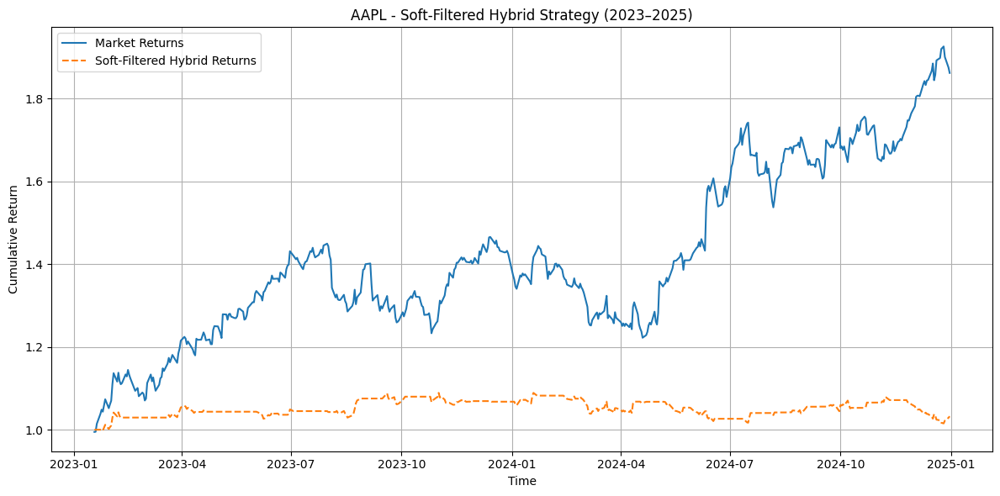

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for GOOG...



<ipython-input-39-8622dbfbf67c>:57: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-39-8622dbfbf67c>:113: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_return"].fillna(0, inplace=True)


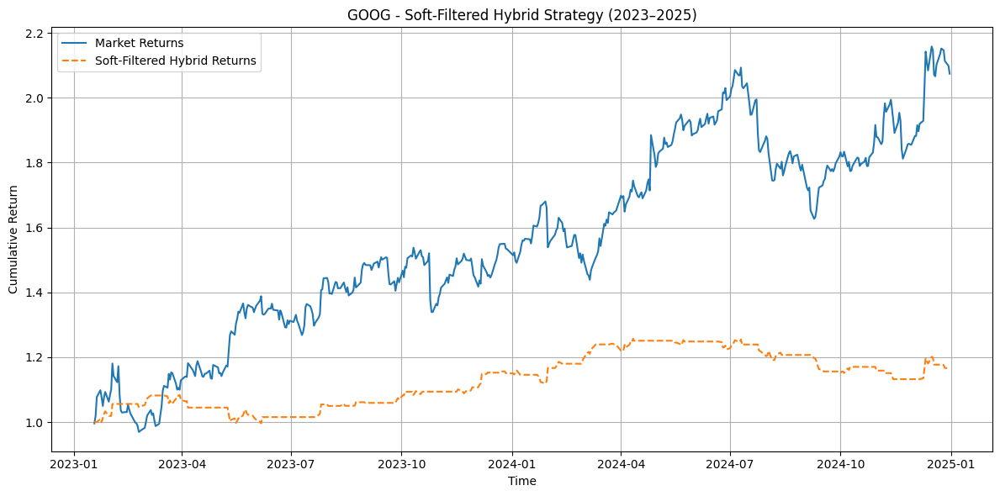

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for AMZN...



<ipython-input-39-8622dbfbf67c>:57: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-39-8622dbfbf67c>:113: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_return"].fillna(0, inplace=True)


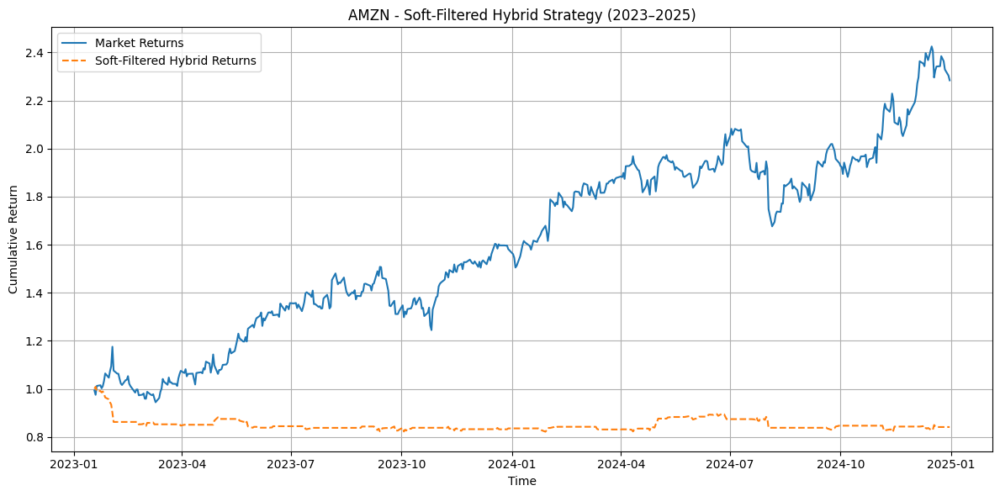

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for MSFT...



<ipython-input-39-8622dbfbf67c>:57: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-39-8622dbfbf67c>:113: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_return"].fillna(0, inplace=True)


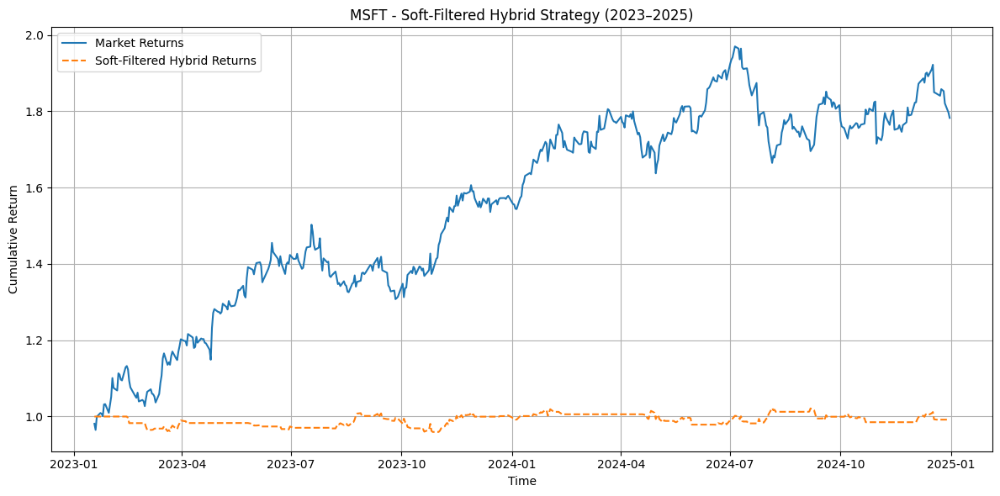

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for META...



<ipython-input-39-8622dbfbf67c>:57: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-39-8622dbfbf67c>:113: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_return"].fillna(0, inplace=True)


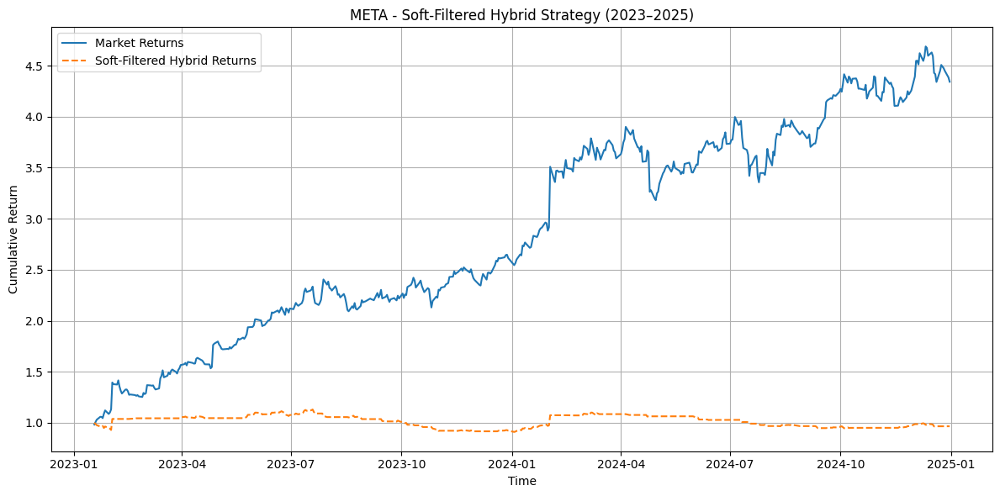

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for NVDA...



<ipython-input-39-8622dbfbf67c>:57: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-39-8622dbfbf67c>:113: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_return"].fillna(0, inplace=True)


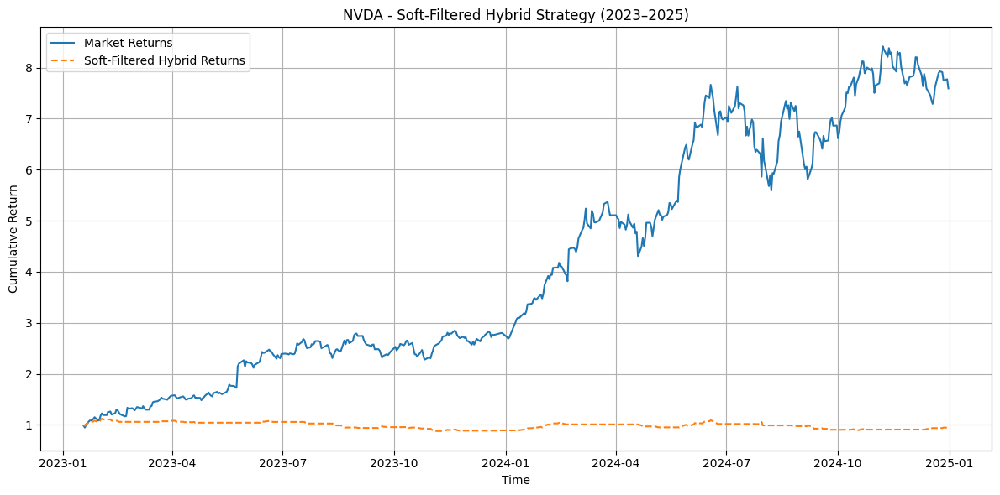

[*********************100%***********************]  1 of 1 completed


🔁 Running Soft-Filtered Hybrid Model for ORCL...



<ipython-input-39-8622dbfbf67c>:57: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Volatility"] = df["Daily_return"].rolling(window=10).std().fillna(method='bfill')
<ipython-input-39-8622dbfbf67c>:113: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hybrid_df["Strategy_return"].fillna(0, inplace=True)


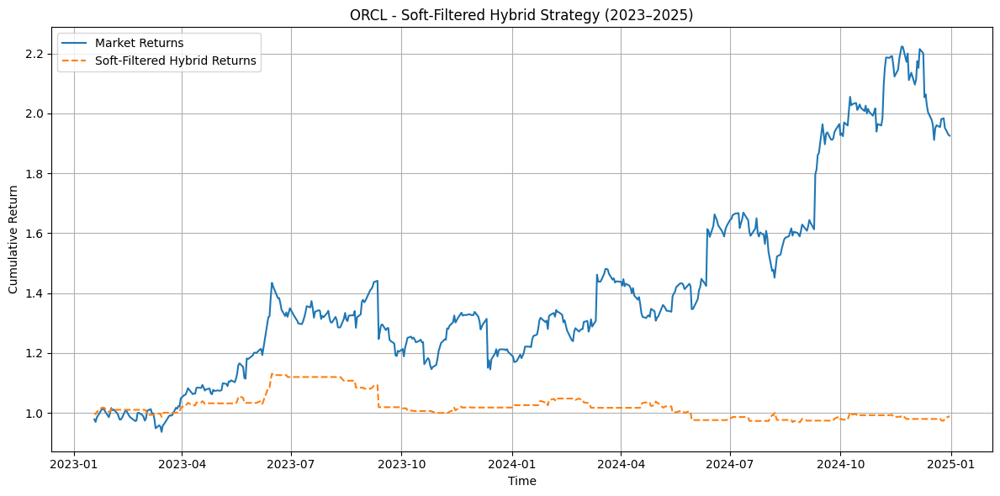


📊 Summary of Soft-Filtered Hybrid Backtest (2023–2025):
  Stock  Sharpe Ratio  Total Return (%)       Start         End
0  AAPL          0.27              3.24  2023-01-18  2024-12-31
1  GOOG          0.90             16.65  2023-01-18  2024-12-31
2  AMZN         -0.92            -15.86  2023-01-18  2024-12-31
3  MSFT         -0.03             -0.81  2023-01-18  2024-12-31
4  META         -0.06             -3.45  2023-01-18  2024-12-31
5  NVDA         -0.14             -5.52  2023-01-18  2024-12-31
6  ORCL         -0.03             -1.15  2023-01-18  2024-12-31


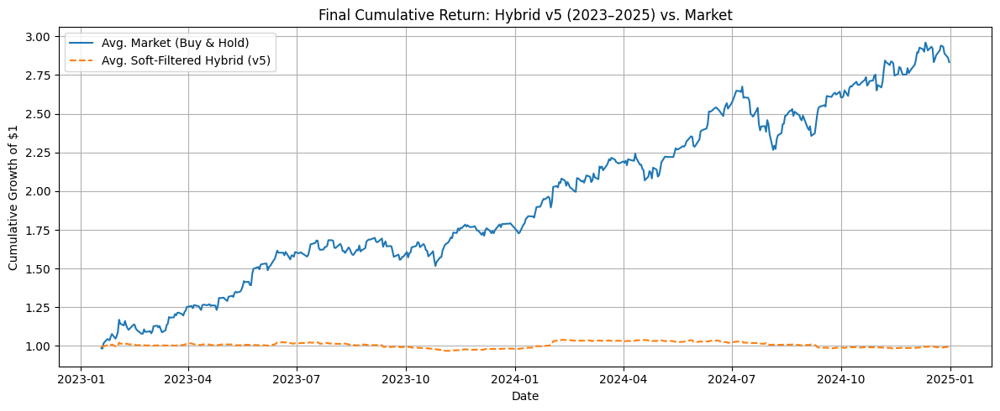


------ FINAL HYBRID v5 AGGREGATED RESULTS (2023–2025) ------
Overall Return: -0.56%
Sharpe Ratio:  -0.05
-----------------------------------------------------------


In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt




pred_df = pd.DataFrame(predictions_rescaled, columns=stocks, index=test_dates)
actual_df = pd.DataFrame(y_test_rescaled, columns=stocks, index=test_dates)


all_market_returns = []
all_strategy_returns = []



hybrid_results_soft_filtered = []

for stock in stocks:
    print(f"\n🔁 Running Soft-Filtered Hybrid Model for {stock}...")

    # 1) Download OHLCV data for the stock
    df = yf.download(stock, start='2015-01-01', end='2025-01-01')
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [col[0] if isinstance(col, tuple) else col for col in df.columns]
    df.columns = [str(col).capitalize() for col in df.columns]

    # 2) Compute the technical indicators
    df["SMA_10"] = df["Close"].rolling(window=10).mean()
    df["SMA_50"] = df["Close"].rolling(window=50).mean()
    df["SMA_20"] = df["Close"].rolling(window=20).mean()
    df["STD_20"] = df["Close"].rolling(window=20).std()
    df["Bollinger_Upper"] = df["SMA_20"] + (2 * df["STD_20"])
    df["Bollinger_Lower"] = df["SMA_20"] - (2 * df["STD_20"])
    df["EMA_12"] = df["Close"].ewm(span=12, adjust=False).mean()
    df["EMA_26"] = df["Close"].ewm(span=26, adjust=False).mean()
    df["MACD"] = df["EMA_12"] - df["EMA_26"]
    df["Typical_price"] = (df["High"] + df["Low"] + df["Close"]) / 3
    df["Raw_money_flow"] = df["Typical_price"] * df["Volume"]
    df["Positive_mf"] = np.where(df["Typical_price"] > df["Typical_price"].shift(1), df["Raw_money_flow"], 0)
    df["Negative_mf"] = np.where(df["Typical_price"] < df["Typical_price"].shift(1), df["Raw_money_flow"], 0)
    df["Money_flow_ratio"] = df["Positive_mf"].rolling(window=14).sum() / df["Negative_mf"].rolling(window=14).sum()
    df["Mfi"] = 100 - (100 / (1 + df["Money_flow_ratio"]))
    df["Daily_return"] = df["Close"].pct_change().fillna(0)
    df["Volatility"] = df["Daily_return"].rolling(window=10).std().fillna(method='bfill')

    # Drop initial NaNs
    df.dropna(inplace=True)

    # 3) Define thresholds
    macd_threshold = df["MACD"].median()
    mfi_overbought = df["Mfi"].quantile(0.75)
    mfi_oversold = df["Mfi"].quantile(0.25)
    volatility_high = df["Volatility"].quantile(0.90)

    # 4) Create a "confidence" measure from MDP signals
    def get_soft_confidence(row):
        # Example logic:
        # If MACD > threshold & MFI is high => more bearish
        # If MACD < threshold & MFI is low  => more bullish
        # Otherwise neutral
        if row["MACD"] > macd_threshold and row["Mfi"] > mfi_overbought:
            return 0.25  # Bearish
        elif row["MACD"] < macd_threshold and row["Mfi"] < mfi_oversold:
            return 0.75  # Bullish
        else:
            return 0.5   # Neutral

    df["Mdp_confidence"] = df.apply(get_soft_confidence, axis=1)

    # 5) Align with test dates to evaluate
    hybrid_df = df.loc[df.index.isin(test_dates)][
        ["Close", "Daily_return", "Volatility", "Mdp_confidence"]
    ].copy()

    # Add actual/predicted from LSTM
    hybrid_df["Actual"] = actual_df[stock]
    hybrid_df["Predicted"] = pred_df[stock]

    # 6) Soft-filtered decision rule
    def soft_filtered_decision(row):
        # If volatility is too high, do NOT trade
        if row["Volatility"] > volatility_high:
            return 0
        # LSTM signal: +1 if predicted>actual, -1 if predicted<actual
        lstm_signal = 1 if row["Predicted"] > row["Actual"] else -1

        # Scale the LSTM signal by a factor derived from MDP confidence
        # confidence_weighted = (lstm_signal) * 2*(confidence-0.5)
        # which yields -1..+1 range
        confidence_weighted = lstm_signal * (2 * (row["Mdp_confidence"] - 0.5))

        # Clip to -1 or +1 max (just in case)
        return np.clip(confidence_weighted, -1, 1)

    hybrid_df["Position"] = hybrid_df.apply(soft_filtered_decision, axis=1)

    # 7) Calculate strategy return
    #    - Use position from previous day to get next day's return
    hybrid_df["Strategy_return"] = hybrid_df["Position"].shift(1) * hybrid_df["Daily_return"]
    hybrid_df["Strategy_return"].fillna(0, inplace=True)

    # 8) Cumulative returns
    hybrid_df["Cumulative_market"] = (1 + hybrid_df["Daily_return"]).cumprod()
    hybrid_df["Cumulative_strategy"] = (1 + hybrid_df["Strategy_return"]).cumprod()

    # 9) Filter to evaluation window (e.g., 2023–2025)
    df_eval = hybrid_df[hybrid_df.index >= pd.Timestamp("2023-01-01")].copy()

    # 10) Compute Sharpe & total return for THIS stock
    sharpe = df_eval["Strategy_return"].mean() / df_eval["Strategy_return"].std() * np.sqrt(252)
    total_return = df_eval["Cumulative_strategy"].iloc[-1] - 1

    # 11) Save per-stock results
    hybrid_results_soft_filtered.append({
        "Stock": stock,
        "Sharpe Ratio": round(sharpe, 2),
        "Total Return (%)": round(total_return * 100, 2),
        "Start": df_eval.index[0].date(),
        "End": df_eval.index[-1].date()
    })

    # --►► IMPORTANT: Append daily returns for aggregator
    all_market_returns.append(df_eval["Daily_return"])
    all_strategy_returns.append(df_eval["Strategy_return"])

    # 12) Plot each stock's result (optional)
    plt.figure(figsize=(12,6))
    plt.plot(df_eval["Cumulative_market"], label="Market Returns")
    plt.plot(df_eval["Cumulative_strategy"], label="Soft-Filtered Hybrid Returns", linestyle="--")
    plt.title(f"{stock} - Soft-Filtered Hybrid Strategy (2023–2025)")
    plt.xlabel("Time")
    plt.ylabel("Cumulative Return")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

# ---------------------------------------------------------
#  Print Per-Stock Summary
# ---------------------------------------------------------
summary_df = pd.DataFrame(hybrid_results_soft_filtered)
print("\n Summary of Soft-Filtered Hybrid Backtest (2023–2025):")
print(summary_df)

# ---------------------------------------------------------
#  Aggregate All Stocks: Final Cumulative Return Chart
#     - We'll take the average of daily returns across
#       the 7 stocks & plot 1 chart
# ---------------------------------------------------------
if len(all_market_returns) == 0 or len(all_strategy_returns) == 0:
    print("\nNo daily returns found. Make sure your loop appended returns.")
else:
    # 1) Combine and average across axis=1
    df_market_mean   = pd.concat(all_market_returns,   axis=1).mean(axis=1)
    df_strategy_mean = pd.concat(all_strategy_returns, axis=1).mean(axis=1)

    # 2) Build a DataFrame for final aggregator
    df_agg = pd.DataFrame({
        "Mean_Market_Return":   df_market_mean,
        "Mean_Strategy_Return": df_strategy_mean
    })

    # 3) Cumulative growth from 1 + daily returns
    df_agg["Cumulative_Market"]   = (1 + df_agg["Mean_Market_Return"]).cumprod()
    df_agg["Cumulative_Strategy"] = (1 + df_agg["Mean_Strategy_Return"]).cumprod()

    # 4) Final performance stats
    final_return = df_agg["Cumulative_Strategy"].iloc[-1] - 1
    annualized_sharpe = (
        df_agg["Mean_Strategy_Return"].mean() / df_agg["Mean_Strategy_Return"].std()
    ) * np.sqrt(252)

    # 5) Plot final aggregator chart
    plt.figure(figsize=(12,5))
    plt.plot(df_agg["Cumulative_Market"],   label="Avg. Market (Buy & Hold)")
    plt.plot(df_agg["Cumulative_Strategy"], label="Avg. Soft-Filtered Hybrid (v5)", linestyle="--")
    plt.title("Final Cumulative Return: Hybrid v5 (2023–2025) vs. Market")
    plt.xlabel("Date")
    plt.ylabel("Cumulative Growth of $1")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # 6) Print final aggregator stats
    print("\n------ FINAL HYBRID v5 AGGREGATED RESULTS (2023–2025) ------")
    print(f"Overall Return: {final_return * 100:.2f}%")
    print(f"Sharpe Ratio:  {annualized_sharpe:.2f}")
    print("-----------------------------------------------------------")


In [ ]:
summary_df.to_csv("soft_filtered_hybrid_results.csv", index=False)


In [ ]:
from google.colab import files
files.download("soft_filtered_hybrid_results.csv")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>